In [1]:
!pip install captum

import pandas as pd
import numpy as np
import matplotlib as plt
import seaborn as sns
import torchvision
from torchvision import models
from torchvision import transforms
from PIL import Image
import torch.nn.functional as F
import torch
import os
import json
from torch.utils.data import DataLoader
from torchvision.datasets import ImageFolder
import torch.nn as nn
import torchvision.transforms as transforms
import torch.utils.data as data
import torch.optim as optim
from ray import tune
from ray.tune import CLIReporter
from ray.tune.schedulers import ASHAScheduler
import collections
from functools import partial
from torch.utils.data import random_split
from captum.attr import IntegratedGradients
from captum.attr import GradientShap
from captum.attr import Occlusion
from captum.attr import NoiseTunnel
from captum.attr import visualization as viz
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import train_test_split
from matplotlib.colors import LinearSegmentedColormap

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 15.3 MB/s eta 0:00:0000:010:01


In [2]:
def reset_graph(seed=42):
    tf.reset_default_graph()
    tf.set_random_seed(seed)
    np.random.seed(seed)

%matplotlib inline
import matplotlib
import matplotlib.pyplot as plt
plt.rcParams['axes.labelsize']  = 14
plt.rcParams['xtick.labelsize'] = 12
plt.rcParams['ytick.labelsize'] = 12

# Where to save the figures
PROJECT_ROOT_DIR = "."
CHAPTER_ID = "pytorch"

# Making the device GPU
use_cuda = True
device = torch.device("cuda" if (torch.cuda.is_available()) else "cpu")


def save_fig(fig_id, tight_layout=True):
    path = os.path.join(PROJECT_ROOT_DIR, "images", CHAPTER_ID, fig_id + ".png")
    print("Saving figure", fig_id)
    if tight_layout:
        plt.tight_layout()
    plt.savefig(path, format='png', dpi=300)
    files.download(PROJECT_ROOT_DIR+'/images/'+CHAPTER_ID+'/'+fig_id + ".png") 

In [3]:
#Using Tranform to convert Image to Tensors
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

In [4]:
#Custom Dataset that reads the Image name and the label from the csv and associates the actual image with it
class CustomDataset(data.Dataset):
    def __init__(self, csv_path, image_folder_path, transform=None):
        self.data = pd.read_csv(csv_path)
        self.image_folder_path = image_folder_path
        self.transform = transform

    def __len__(self):
        return len(self.data)

    def __getitem__(self, index):
        image_path = self.data.iloc[index, 0]
        label = self.data.iloc[index, 1]
        image = Image.open(os.path.join(self.image_folder_path, image_path)).convert('RGB')

        if self.transform is not None:
            image = self.transform(image)

        return image, label

In [5]:
#creating the test and train dataset
train_set = CustomDataset('/kaggle/input/deep-learning-for-msc-2022-23/train.csv', '/kaggle/input/deep-learning-for-msc-2022-23/train', transform = transform)
test_set = CustomDataset('/kaggle/input/deep-learning-for-msc-2022-23/example.csv', '/kaggle/input/deep-learning-for-msc-2022-23/test', transform = transform)
predi = []
train_losses = []
train_accuracies = []
val_losses = []
val_accuracies = []
y_pred = []
y_true = []

In [6]:
train_set[0]

(tensor([[[ 1.5810,  1.2728,  0.9988,  ...,  1.8893,  1.9749,  1.9920],
          [ 1.3413,  1.2043,  1.1358,  ...,  2.0434,  2.0948,  2.1119],
          [ 1.0844,  1.1358,  1.2557,  ...,  2.1975,  2.2147,  2.2147],
          ...,
          [ 1.9749,  1.9749,  1.9749,  ...,  0.7933,  0.5707,  0.4337],
          [ 1.9578,  1.9749,  1.9749,  ...,  0.8789,  0.8961,  0.7419],
          [ 1.9407,  1.9407,  1.9578,  ...,  0.7762,  0.7933,  0.6906]],
 
         [[ 1.1681,  0.8004,  0.5203,  ...,  1.9209,  2.0084,  2.0259],
          [ 0.9055,  0.7304,  0.6429,  ...,  2.0784,  2.1485,  2.1660],
          [ 0.6254,  0.6429,  0.7304,  ...,  2.2360,  2.2710,  2.2710],
          ...,
          [ 2.1310,  2.1134,  2.1134,  ...,  0.2577,  0.0301, -0.1099],
          [ 2.1134,  2.1134,  2.1310,  ...,  0.3277,  0.3452,  0.1877],
          [ 2.0784,  2.0959,  2.1134,  ...,  0.2052,  0.2402,  0.1352]],
 
         [[ 2.3263,  2.0125,  1.7511,  ...,  2.2914,  2.3611,  2.3611],
          [ 2.1520,  2.0300,

In [7]:
#using Dataloader to create the train and test loader
train_loader = DataLoader(train_set, batch_size=16, shuffle=True)#, collate_fn=custom_collate)
test_loader = DataLoader(test_set, batch_size=16, shuffle=False)#, collate_fn=custom_collate)

# Custom Model with Tuning

In [8]:
#custom model for tuning
class Net(nn.Module):
    def __init__(self, l1=120, l2=80):
        super(Net, self).__init__()
        self.conv1 = nn.Conv2d(3, 20, 3, padding=1)
        self.relu1 = nn.ReLU()
        self.conv2 = nn.Conv2d(20, 64, 3, padding=1)
        self.relu2 = nn.ReLU()
        self.flatten = nn.Flatten() 
        self.fc1 = nn.Linear(640000, l1)
        self.fc2 = nn.Linear(l1,l2)
        self.fc3 = nn.Linear(l2, 4)


    def forward(self, x):
        x = self.conv1(x)
        x = self.relu1(x)
        x = self.conv2(x)
        x = self.relu2(x)
        x = self.flatten(x)
        x = self.fc1(x)
        x = self.fc2(x)
        x = self.fc3(x)
        return x

In [9]:
#training the model and tuning the l1, l2, batch size and the learning rate
def train_tune_model(config, checkpoint_dir=None):
    net = Net(config["l1"], config["l2"])

    device = "cpu"
    if torch.cuda.is_available():
        device = "cuda:0"
        if torch.cuda.device_count() > 1:
            net = nn.DataParallel(net)
    net.to(device)

    criterion = nn.CrossEntropyLoss()
    optimizer = optim.SGD(net.parameters(), lr=config["lr"], momentum=0.9)

    if checkpoint_dir:
        model_state, optimizer_state = torch.load(
            os.path.join(checkpoint_dir, "checkpoint"))
        net.load_state_dict(model_state)
        optimizer.load_state_dict(optimizer_state)

    test_abs = int(len(train_set) * 0.8)
    train_subset, val_subset = random_split(
        train_set, [test_abs, len(train_set) - test_abs])

    trainloader = torch.utils.data.DataLoader(
        train_subset,
        batch_size=int(config["batch_size"]),
        shuffle=True,
        num_workers=8)
    valloader = torch.utils.data.DataLoader(
        val_subset,
        batch_size=int(config["batch_size"]),
        shuffle=True,
        num_workers=8)

    for epoch in range(10):  # loop over the dataset multiple times
        running_loss = 0.0
        epoch_steps = 0
        for i, data in enumerate(trainloader, 0):
            # get the inputs; data is a list of [inputs, labels]
            inputs, labels = data
            inputs, labels = inputs.to(device), labels.to(device)

            # zero the parameter gradients
            optimizer.zero_grad()

            # forward + backward + optimize
            outputs = net(inputs)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            # print statistics
            running_loss += loss.item()
            epoch_steps += 1
            if i % 2000 == 1999:  # print every 2000 mini-batches
                print("[%d, %5d] loss: %.3f" % (epoch + 1, i + 1,
                                                running_loss / epoch_steps))
                running_loss = 0.0

        # Validation loss
        val_loss = 0.0
        val_steps = 0
        total = 0
        correct = 0
        for i, data in enumerate(valloader, 0):
            with torch.no_grad():
                inputs, labels = data
                inputs, labels = inputs.to(device), labels.to(device)

                outputs = net(inputs)
                _, predicted = torch.max(outputs.data, 1)
                total += labels.size(0)
                correct += (predicted == labels).sum().item()

                loss = criterion(outputs, labels)
                val_loss += loss.cpu().numpy()
                val_steps += 1

        with tune.checkpoint_dir(epoch) as checkpoint_dir:
            path = os.path.join(checkpoint_dir, "checkpoint")
            torch.save((net.state_dict(), optimizer.state_dict()), path)

        tune.report(loss=(val_loss / val_steps), accuracy=correct / total)
    print("Finished Training")

In [10]:
#testing the accuracy on the test images and example.csv
def test_accuracy(net, device="cpu"):
    predi = []
    y_pred = []
    y_true = []

    testloader = torch.utils.data.DataLoader(
        test_set, batch_size=4, shuffle=False)

    correct = 0
    total = 0
    with torch.no_grad():
        for data in testloader:
            images, labels = data
            images, labels = images.to(device), labels.to(device)
            outputs = net(images)
            _, predicted = torch.max(outputs.data, 1)
            predi.append(predicted)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
            y_pred += predicted.cpu().numpy().tolist()
            y_true += labels.cpu().numpy().tolist()
            
    num = []
    for i in range(len(predi)):
        for j in range(len(predi[i])):
            number = predi[i][j].item()
            num.append(number)
                
    doc = pd.read_csv("/kaggle/input/deep-learning-for-msc-2022-23/example.csv")
    doc['Label'] = num
    
    doc.to_csv("pretrained_tuned.csv", index=False)
    
    cm = confusion_matrix(y_true, y_pred)
    print(cm)
        
    return predi, y_pred, y_true, correct / total

In [11]:
def main(num_samples=2, max_num_epochs=15, gpus_per_trial=1):
    config = {
        "l1": tune.sample_from(lambda _: 2 ** np.random.randint(2, 9)),
        "l2": tune.sample_from(lambda _: 2 ** np.random.randint(2, 9)),
        "lr": tune.loguniform(1e-4, 1e-1),
        "batch_size": tune.choice([2, 4, 8, 16])
    }
    scheduler = ASHAScheduler(
        metric="loss",
        mode="min",
        max_t=max_num_epochs,
        grace_period=1,
        reduction_factor=2)
    reporter = CLIReporter(
        # parameter_columns=["l1", "l2", "lr", "batch_size"],
        metric_columns=["loss", "accuracy", "training_iteration"])
    result = tune.run(
        partial(train_tune_model),
        resources_per_trial={"cpu": 2, "gpu": gpus_per_trial},
        config=config,
        num_samples=num_samples,
        scheduler=scheduler,
        progress_reporter=reporter)

    best_trial = result.get_best_trial("loss", "min", "last")
    print("Best trial config: {}".format(best_trial.config))
    print("Best trial final validation loss: {}".format(
        best_trial.last_result["loss"]))
    print("Best trial final validation accuracy: {}".format(
        best_trial.last_result["accuracy"]))

    best_trained_model = Net(best_trial.config["l1"], best_trial.config["l2"])
    device = "cpu"
    if torch.cuda.is_available():
        device = "cuda:0"
        if gpus_per_trial > 1:
            best_trained_model = nn.DataParallel(best_trained_model)
    best_trained_model.to(device)

    best_checkpoint_dir = best_trial.checkpoint.dir_or_data
    model_state, optimizer_state = torch.load(os.path.join(
        best_checkpoint_dir, "checkpoint"))
    best_trained_model.load_state_dict(model_state)

    predi, y_pred, y_true, test_acc = test_accuracy(best_trained_model, device)
    print("Best trial test set accuracy: {}".format(test_acc))


if __name__ == "__main__":
    main(num_samples=2, max_num_epochs=15, gpus_per_trial=1)

2023-03-27 20:36:05,162	INFO worker.py:1535 -- Started a local Ray instance. View the dashboard at http://127.0.0.1:8265 
/opt/conda/lib/python3.7/site-packages/ray/tune/trainable/function_trainable.py:612: DeprecationWarning: `checkpoint_dir` in `func(config, checkpoint_dir)` is being deprecated. To save and load checkpoint in trainable functions, please use the `ray.air.session` API:

from ray.air import session

def train(config):
    # ...
    session.report({"metric": metric}, checkpoint=checkpoint)

For more information please see https://docs.ray.io/en/master/tune/api_docs/trainable.html

  DeprecationWarning,
E0327 20:36:08.361779884      24 fork_posix.cc:76]           Other threads are currently calling into gRPC, skipping fork() handlers


== Status ==
Current time: 2023-03-27 20:36:09 (running for 00:00:00.35)
Memory usage on this node: 1.5/15.6 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 8.000: None | Iter 4.000: None | Iter 2.000: None | Iter 1.000: None
Resources requested: 2.0/2 CPUs, 1.0/1 GPUs, 0.0/7.37 GiB heap, 0.0/3.69 GiB objects (0.0/1.0 accelerator_type:P100)
Result logdir: /root/ray_results/train_tune_model_2023-03-27_20-36-08
Number of trials: 2/2 (1 PENDING, 1 RUNNING)
+------------------------------+----------+----------------+--------------+------+------+------------+
| Trial name                   | status   | loc            |   batch_size |   l1 |   l2 |         lr |
|------------------------------+----------+----------------+--------------+------+------+------------|
| train_tune_model_00f58_00000 | RUNNING  | 172.19.2.2:308 |           16 |   64 |   16 | 0.0190672  |
| train_tune_model_00f58_00001 | PENDING  |                |            4 |  256 |    4 | 0.00152643 |
+-------------------

(func pid=308) /opt/conda/lib/python3.7/site-packages/torch/utils/data/dataloader.py:557: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
(func pid=308)   cpuset_checked))
(func pid=308) E0327 20:36:18.260645321     351 fork_posix.cc:76]           Other threads are currently calling into gRPC, skipping fork() handlers
(func pid=308) E0327 20:36:18.285551272     351 fork_posix.cc:76]           Other threads are currently calling into gRPC, skipping fork() handlers


== Status ==
Current time: 2023-03-27 20:36:19 (running for 00:00:10.69)
Memory usage on this node: 2.8/15.6 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 8.000: None | Iter 4.000: None | Iter 2.000: None | Iter 1.000: None
Resources requested: 2.0/2 CPUs, 1.0/1 GPUs, 0.0/7.37 GiB heap, 0.0/3.69 GiB objects (0.0/1.0 accelerator_type:P100)
Result logdir: /root/ray_results/train_tune_model_2023-03-27_20-36-08
Number of trials: 2/2 (1 PENDING, 1 RUNNING)
+------------------------------+----------+----------------+--------------+------+------+------------+
| Trial name                   | status   | loc            |   batch_size |   l1 |   l2 |         lr |
|------------------------------+----------+----------------+--------------+------+------+------------|
| train_tune_model_00f58_00000 | RUNNING  | 172.19.2.2:308 |           16 |   64 |   16 | 0.0190672  |
| train_tune_model_00f58_00001 | PENDING  |                |            4 |  256 |    4 | 0.00152643 |
+-------------------

(func pid=308) E0327 20:36:36.485293104     351 fork_posix.cc:76]           Other threads are currently calling into gRPC, skipping fork() handlers


== Status ==
Current time: 2023-03-27 20:36:39 (running for 00:00:30.74)
Memory usage on this node: 3.4/15.6 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 8.000: None | Iter 4.000: None | Iter 2.000: None | Iter 1.000: None
Resources requested: 2.0/2 CPUs, 1.0/1 GPUs, 0.0/7.37 GiB heap, 0.0/3.69 GiB objects (0.0/1.0 accelerator_type:P100)
Result logdir: /root/ray_results/train_tune_model_2023-03-27_20-36-08
Number of trials: 2/2 (1 PENDING, 1 RUNNING)
+------------------------------+----------+----------------+--------------+------+------+------------+
| Trial name                   | status   | loc            |   batch_size |   l1 |   l2 |         lr |
|------------------------------+----------+----------------+--------------+------+------+------------|
| train_tune_model_00f58_00000 | RUNNING  | 172.19.2.2:308 |           16 |   64 |   16 | 0.0190672  |
| train_tune_model_00f58_00001 | PENDING  |                |            4 |  256 |    4 | 0.00152643 |
+-------------------

Trial name,accuracy,date,done,episodes_total,experiment_id,experiment_tag,hostname,iterations_since_restore,loss,node_ip,pid,should_checkpoint,time_since_restore,time_this_iter_s,time_total_s,timestamp,timesteps_since_restore,timesteps_total,training_iteration,trial_id,warmup_time
train_tune_model_00f58_00000,0.101852,2023-03-27_20-38-57,True,,c9100812c0e846cb937967967c90b8fa,"0_batch_size=16,l1=64,l2=16,lr=0.0191",42f2bf0340d6,10,nan,172.19.2.2,308,True,162.619,14.8627,162.619,1679949537,0,,10,00f58_00000,0.00943279
train_tune_model_00f58_00001,0.835317,2023-03-27_20-49-30,True,,19caf297d37d457abce66c1b31a28a13,"1_batch_size=4,l1=256,l2=4,lr=0.0015",42f2bf0340d6,10,1.18064,172.19.2.2,2222,True,627.54,62.7776,627.54,1679950170,0,,10,00f58_00001,0.00811625


(func pid=308) E0327 20:36:40.710613896     351 fork_posix.cc:76]           Other threads are currently calling into gRPC, skipping fork() handlers
/opt/conda/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1376: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input, interpolation=interpolation


== Status ==
Current time: 2023-03-27 20:36:45 (running for 00:00:36.89)
Memory usage on this node: 3.4/15.6 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 8.000: None | Iter 4.000: None | Iter 2.000: None | Iter 1.000: nan
Resources requested: 2.0/2 CPUs, 1.0/1 GPUs, 0.0/7.37 GiB heap, 0.0/3.69 GiB objects (0.0/1.0 accelerator_type:P100)
Result logdir: /root/ray_results/train_tune_model_2023-03-27_20-36-08
Number of trials: 2/2 (1 PENDING, 1 RUNNING)
+------------------------------+----------+----------------+--------------+------+------+------------+--------+------------+----------------------+
| Trial name                   | status   | loc            |   batch_size |   l1 |   l2 |         lr |   loss |   accuracy |   training_iteration |
|------------------------------+----------+----------------+--------------+------+------+------------+--------+------------+----------------------|
| train_tune_model_00f58_00000 | RUNNING  | 172.19.2.2:308 |           16 |   64 |   16 | 0.

(func pid=308) E0327 20:36:51.867155263     351 fork_posix.cc:76]           Other threads are currently calling into gRPC, skipping fork() handlers
(func pid=308) E0327 20:36:55.312865122     351 fork_posix.cc:76]           Other threads are currently calling into gRPC, skipping fork() handlers


== Status ==
Current time: 2023-03-27 20:37:00 (running for 00:00:51.34)
Memory usage on this node: 3.4/15.6 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 8.000: None | Iter 4.000: None | Iter 2.000: nan | Iter 1.000: nan
Resources requested: 2.0/2 CPUs, 1.0/1 GPUs, 0.0/7.37 GiB heap, 0.0/3.69 GiB objects (0.0/1.0 accelerator_type:P100)
Result logdir: /root/ray_results/train_tune_model_2023-03-27_20-36-08
Number of trials: 2/2 (1 PENDING, 1 RUNNING)
+------------------------------+----------+----------------+--------------+------+------+------------+--------+------------+----------------------+
| Trial name                   | status   | loc            |   batch_size |   l1 |   l2 |         lr |   loss |   accuracy |   training_iteration |
|------------------------------+----------+----------------+--------------+------+------+------------+--------+------------+----------------------|
| train_tune_model_00f58_00000 | RUNNING  | 172.19.2.2:308 |           16 |   64 |   16 | 0.0

(func pid=308) E0327 20:37:06.654398288     351 fork_posix.cc:76]           Other threads are currently calling into gRPC, skipping fork() handlers
(func pid=308) E0327 20:37:06.775673846     351 fork_posix.cc:76]           Other threads are currently calling into gRPC, skipping fork() handlers


== Status ==
Current time: 2023-03-27 20:37:10 (running for 00:01:01.36)
Memory usage on this node: 3.4/15.6 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 8.000: None | Iter 4.000: None | Iter 2.000: nan | Iter 1.000: nan
Resources requested: 2.0/2 CPUs, 1.0/1 GPUs, 0.0/7.37 GiB heap, 0.0/3.69 GiB objects (0.0/1.0 accelerator_type:P100)
Result logdir: /root/ray_results/train_tune_model_2023-03-27_20-36-08
Number of trials: 2/2 (1 PENDING, 1 RUNNING)
+------------------------------+----------+----------------+--------------+------+------+------------+--------+------------+----------------------+
| Trial name                   | status   | loc            |   batch_size |   l1 |   l2 |         lr |   loss |   accuracy |   training_iteration |
|------------------------------+----------+----------------+--------------+------+------+------------+--------+------------+----------------------|
| train_tune_model_00f58_00000 | RUNNING  | 172.19.2.2:308 |           16 |   64 |   16 | 0.0

(func pid=308) E0327 20:37:10.820686833     351 fork_posix.cc:76]           Other threads are currently calling into gRPC, skipping fork() handlers
(func pid=308) E0327 20:37:10.926279774     351 fork_posix.cc:76]           Other threads are currently calling into gRPC, skipping fork() handlers
(func pid=308) E0327 20:37:10.953506464     351 fork_posix.cc:76]           Other threads are currently calling into gRPC, skipping fork() handlers


== Status ==
Current time: 2023-03-27 20:37:15 (running for 00:01:07.01)
Memory usage on this node: 3.4/15.6 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 8.000: None | Iter 4.000: None | Iter 2.000: nan | Iter 1.000: nan
Resources requested: 2.0/2 CPUs, 1.0/1 GPUs, 0.0/7.37 GiB heap, 0.0/3.69 GiB objects (0.0/1.0 accelerator_type:P100)
Result logdir: /root/ray_results/train_tune_model_2023-03-27_20-36-08
Number of trials: 2/2 (1 PENDING, 1 RUNNING)
+------------------------------+----------+----------------+--------------+------+------+------------+--------+------------+----------------------+
| Trial name                   | status   | loc            |   batch_size |   l1 |   l2 |         lr |   loss |   accuracy |   training_iteration |
|------------------------------+----------+----------------+--------------+------+------+------------+--------+------------+----------------------|
| train_tune_model_00f58_00000 | RUNNING  | 172.19.2.2:308 |           16 |   64 |   16 | 0.0

(func pid=308) E0327 20:37:53.047412471     351 fork_posix.cc:76]           Other threads are currently calling into gRPC, skipping fork() handlers


== Status ==
Current time: 2023-03-27 20:37:56 (running for 00:01:47.43)
Memory usage on this node: 3.4/15.6 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 8.000: None | Iter 4.000: nan | Iter 2.000: nan | Iter 1.000: nan
Resources requested: 2.0/2 CPUs, 1.0/1 GPUs, 0.0/7.37 GiB heap, 0.0/3.69 GiB objects (0.0/1.0 accelerator_type:P100)
Result logdir: /root/ray_results/train_tune_model_2023-03-27_20-36-08
Number of trials: 2/2 (1 PENDING, 1 RUNNING)
+------------------------------+----------+----------------+--------------+------+------+------------+--------+------------+----------------------+
| Trial name                   | status   | loc            |   batch_size |   l1 |   l2 |         lr |   loss |   accuracy |   training_iteration |
|------------------------------+----------+----------------+--------------+------+------+------------+--------+------------+----------------------|
| train_tune_model_00f58_00000 | RUNNING  | 172.19.2.2:308 |           16 |   64 |   16 | 0.01

(func pid=308) E0327 20:37:56.609343774     351 fork_posix.cc:76]           Other threads are currently calling into gRPC, skipping fork() handlers


== Status ==
Current time: 2023-03-27 20:38:01 (running for 00:01:52.72)
Memory usage on this node: 3.5/15.6 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 8.000: None | Iter 4.000: nan | Iter 2.000: nan | Iter 1.000: nan
Resources requested: 2.0/2 CPUs, 1.0/1 GPUs, 0.0/7.37 GiB heap, 0.0/3.69 GiB objects (0.0/1.0 accelerator_type:P100)
Result logdir: /root/ray_results/train_tune_model_2023-03-27_20-36-08
Number of trials: 2/2 (1 PENDING, 1 RUNNING)
+------------------------------+----------+----------------+--------------+------+------+------------+--------+------------+----------------------+
| Trial name                   | status   | loc            |   batch_size |   l1 |   l2 |         lr |   loss |   accuracy |   training_iteration |
|------------------------------+----------+----------------+--------------+------+------+------------+--------+------------+----------------------|
| train_tune_model_00f58_00000 | RUNNING  | 172.19.2.2:308 |           16 |   64 |   16 | 0.01

(func pid=308) E0327 20:38:08.246924103     351 fork_posix.cc:76]           Other threads are currently calling into gRPC, skipping fork() handlers
(func pid=308) E0327 20:38:08.270807014     351 fork_posix.cc:76]           Other threads are currently calling into gRPC, skipping fork() handlers


== Status ==
Current time: 2023-03-27 20:38:11 (running for 00:02:02.75)
Memory usage on this node: 3.4/15.6 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 8.000: None | Iter 4.000: nan | Iter 2.000: nan | Iter 1.000: nan
Resources requested: 2.0/2 CPUs, 1.0/1 GPUs, 0.0/7.37 GiB heap, 0.0/3.69 GiB objects (0.0/1.0 accelerator_type:P100)
Result logdir: /root/ray_results/train_tune_model_2023-03-27_20-36-08
Number of trials: 2/2 (1 PENDING, 1 RUNNING)
+------------------------------+----------+----------------+--------------+------+------+------------+--------+------------+----------------------+
| Trial name                   | status   | loc            |   batch_size |   l1 |   l2 |         lr |   loss |   accuracy |   training_iteration |
|------------------------------+----------+----------------+--------------+------+------+------------+--------+------------+----------------------|
| train_tune_model_00f58_00000 | RUNNING  | 172.19.2.2:308 |           16 |   64 |   16 | 0.01

(func pid=308) E0327 20:38:23.233040138     351 fork_posix.cc:76]           Other threads are currently calling into gRPC, skipping fork() handlers
(func pid=308) E0327 20:38:23.406488482     351 fork_posix.cc:76]           Other threads are currently calling into gRPC, skipping fork() handlers


== Status ==
Current time: 2023-03-27 20:38:26 (running for 00:02:17.83)
Memory usage on this node: 3.4/15.6 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 8.000: None | Iter 4.000: nan | Iter 2.000: nan | Iter 1.000: nan
Resources requested: 2.0/2 CPUs, 1.0/1 GPUs, 0.0/7.37 GiB heap, 0.0/3.69 GiB objects (0.0/1.0 accelerator_type:P100)
Result logdir: /root/ray_results/train_tune_model_2023-03-27_20-36-08
Number of trials: 2/2 (1 PENDING, 1 RUNNING)
+------------------------------+----------+----------------+--------------+------+------+------------+--------+------------+----------------------+
| Trial name                   | status   | loc            |   batch_size |   l1 |   l2 |         lr |   loss |   accuracy |   training_iteration |
|------------------------------+----------+----------------+--------------+------+------+------------+--------+------------+----------------------|
| train_tune_model_00f58_00000 | RUNNING  | 172.19.2.2:308 |           16 |   64 |   16 | 0.01

(func pid=308) E0327 20:38:27.124649638     351 fork_posix.cc:76]           Other threads are currently calling into gRPC, skipping fork() handlers
(func pid=308) E0327 20:38:27.286904410     351 fork_posix.cc:76]           Other threads are currently calling into gRPC, skipping fork() handlers


== Status ==
Current time: 2023-03-27 20:38:32 (running for 00:02:23.32)
Memory usage on this node: 3.4/15.6 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 8.000: nan | Iter 4.000: nan | Iter 2.000: nan | Iter 1.000: nan
Resources requested: 2.0/2 CPUs, 1.0/1 GPUs, 0.0/7.37 GiB heap, 0.0/3.69 GiB objects (0.0/1.0 accelerator_type:P100)
Result logdir: /root/ray_results/train_tune_model_2023-03-27_20-36-08
Number of trials: 2/2 (1 PENDING, 1 RUNNING)
+------------------------------+----------+----------------+--------------+------+------+------------+--------+------------+----------------------+
| Trial name                   | status   | loc            |   batch_size |   l1 |   l2 |         lr |   loss |   accuracy |   training_iteration |
|------------------------------+----------+----------------+--------------+------+------+------------+--------+------------+----------------------|
| train_tune_model_00f58_00000 | RUNNING  | 172.19.2.2:308 |           16 |   64 |   16 | 0.019

(func pid=308) E0327 20:38:42.234300761     351 fork_posix.cc:76]           Other threads are currently calling into gRPC, skipping fork() handlers
(func pid=308) E0327 20:38:42.332685002     351 fork_posix.cc:76]           Other threads are currently calling into gRPC, skipping fork() handlers
(func pid=308) E0327 20:38:42.376059040     351 fork_posix.cc:76]           Other threads are currently calling into gRPC, skipping fork() handlers


== Status ==
Current time: 2023-03-27 20:38:47 (running for 00:02:38.48)
Memory usage on this node: 3.4/15.6 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 8.000: nan | Iter 4.000: nan | Iter 2.000: nan | Iter 1.000: nan
Resources requested: 2.0/2 CPUs, 1.0/1 GPUs, 0.0/7.37 GiB heap, 0.0/3.69 GiB objects (0.0/1.0 accelerator_type:P100)
Result logdir: /root/ray_results/train_tune_model_2023-03-27_20-36-08
Number of trials: 2/2 (1 PENDING, 1 RUNNING)
+------------------------------+----------+----------------+--------------+------+------+------------+--------+------------+----------------------+
| Trial name                   | status   | loc            |   batch_size |   l1 |   l2 |         lr |   loss |   accuracy |   training_iteration |
|------------------------------+----------+----------------+--------------+------+------+------------+--------+------------+----------------------|
| train_tune_model_00f58_00000 | RUNNING  | 172.19.2.2:308 |           16 |   64 |   16 | 0.019

(func pid=308) E0327 20:38:53.527389769     351 fork_posix.cc:76]           Other threads are currently calling into gRPC, skipping fork() handlers


(func pid=308) Finished Training
== Status ==
Current time: 2023-03-27 20:38:57 (running for 00:02:48.82)
Memory usage on this node: 1.5/15.6 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 8.000: nan | Iter 4.000: nan | Iter 2.000: nan | Iter 1.000: nan
Resources requested: 2.0/2 CPUs, 1.0/1 GPUs, 0.0/7.37 GiB heap, 0.0/3.69 GiB objects (0.0/1.0 accelerator_type:P100)
Result logdir: /root/ray_results/train_tune_model_2023-03-27_20-36-08
Number of trials: 2/2 (1 RUNNING, 1 TERMINATED)
+------------------------------+------------+-----------------+--------------+------+------+------------+--------+------------+----------------------+
| Trial name                   | status     | loc             |   batch_size |   l1 |   l2 |         lr |   loss |   accuracy |   training_iteration |
|------------------------------+------------+-----------------+--------------+------+------+------------+--------+------------+----------------------|
| train_tune_model_00f58_00001 | RUNNING    | 172.

(func pid=2222) /opt/conda/lib/python3.7/site-packages/torch/utils/data/dataloader.py:557: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
(func pid=2222)   cpuset_checked))
(func pid=2222) E0327 20:39:06.704912394    2262 fork_posix.cc:76]           Other threads are currently calling into gRPC, skipping fork() handlers


== Status ==
Current time: 2023-03-27 20:39:07 (running for 00:02:59.12)
Memory usage on this node: 3.0/15.6 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 8.000: nan | Iter 4.000: nan | Iter 2.000: nan | Iter 1.000: nan
Resources requested: 2.0/2 CPUs, 1.0/1 GPUs, 0.0/7.37 GiB heap, 0.0/3.69 GiB objects (0.0/1.0 accelerator_type:P100)
Result logdir: /root/ray_results/train_tune_model_2023-03-27_20-36-08
Number of trials: 2/2 (1 RUNNING, 1 TERMINATED)
+------------------------------+------------+-----------------+--------------+------+------+------------+--------+------------+----------------------+
| Trial name                   | status     | loc             |   batch_size |   l1 |   l2 |         lr |   loss |   accuracy |   training_iteration |
|------------------------------+------------+-----------------+--------------+------+------+------------+--------+------------+----------------------|
| train_tune_model_00f58_00001 | RUNNING    | 172.19.2.2:2222 |            4 |  256

(func pid=2222) E0327 20:40:10.216007916    2262 fork_posix.cc:76]           Other threads are currently calling into gRPC, skipping fork() handlers


== Status ==
Current time: 2023-03-27 20:40:15 (running for 00:04:06.37)
Memory usage on this node: 3.4/15.6 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 8.000: nan | Iter 4.000: nan | Iter 2.000: nan | Iter 1.000: -0.5727968748373092
Resources requested: 2.0/2 CPUs, 1.0/1 GPUs, 0.0/7.37 GiB heap, 0.0/3.69 GiB objects (0.0/1.0 accelerator_type:P100)
Result logdir: /root/ray_results/train_tune_model_2023-03-27_20-36-08
Number of trials: 2/2 (1 RUNNING, 1 TERMINATED)
+------------------------------+------------+-----------------+--------------+------+------+------------+------------+------------+----------------------+
| Trial name                   | status     | loc             |   batch_size |   l1 |   l2 |         lr |       loss |   accuracy |   training_iteration |
|------------------------------+------------+-----------------+--------------+------+------+------------+------------+------------+----------------------|
| train_tune_model_00f58_00001 | RUNNING    | 172.19.2.

(func pid=2222) E0327 20:41:03.005378911    2262 fork_posix.cc:76]           Other threads are currently calling into gRPC, skipping fork() handlers


== Status ==
Current time: 2023-03-27 20:41:05 (running for 00:04:56.46)
Memory usage on this node: 3.4/15.6 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 8.000: nan | Iter 4.000: nan | Iter 2.000: nan | Iter 1.000: -0.5727968748373092
Resources requested: 2.0/2 CPUs, 1.0/1 GPUs, 0.0/7.37 GiB heap, 0.0/3.69 GiB objects (0.0/1.0 accelerator_type:P100)
Result logdir: /root/ray_results/train_tune_model_2023-03-27_20-36-08
Number of trials: 2/2 (1 RUNNING, 1 TERMINATED)
+------------------------------+------------+-----------------+--------------+------+------+------------+------------+------------+----------------------+
| Trial name                   | status     | loc             |   batch_size |   l1 |   l2 |         lr |       loss |   accuracy |   training_iteration |
|------------------------------+------------+-----------------+--------------+------+------+------------+------------+------------+----------------------|
| train_tune_model_00f58_00001 | RUNNING    | 172.19.2.

(func pid=2222) E0327 20:42:04.515375725    2262 fork_posix.cc:76]           Other threads are currently calling into gRPC, skipping fork() handlers


== Status ==
Current time: 2023-03-27 20:42:08 (running for 00:05:59.37)
Memory usage on this node: 3.5/15.6 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 8.000: nan | Iter 4.000: nan | Iter 2.000: -0.49992723510571063 | Iter 1.000: -0.5727968748373092
Resources requested: 2.0/2 CPUs, 1.0/1 GPUs, 0.0/7.37 GiB heap, 0.0/3.69 GiB objects (0.0/1.0 accelerator_type:P100)
Result logdir: /root/ray_results/train_tune_model_2023-03-27_20-36-08
Number of trials: 2/2 (1 RUNNING, 1 TERMINATED)
+------------------------------+------------+-----------------+--------------+------+------+------------+------------+------------+----------------------+
| Trial name                   | status     | loc             |   batch_size |   l1 |   l2 |         lr |       loss |   accuracy |   training_iteration |
|------------------------------+------------+-----------------+--------------+------+------+------------+------------+------------+----------------------|
| train_tune_model_00f58_00001 | RUNNI

(func pid=2222) E0327 20:42:14.591399324    2262 fork_posix.cc:76]           Other threads are currently calling into gRPC, skipping fork() handlers
(func pid=2222) E0327 20:42:14.637985266    2262 fork_posix.cc:76]           Other threads are currently calling into gRPC, skipping fork() handlers
(func pid=2222) E0327 20:42:14.720836716    2262 fork_posix.cc:76]           Other threads are currently calling into gRPC, skipping fork() handlers
(func pid=2222) E0327 20:42:14.823347230    2262 fork_posix.cc:76]           Other threads are currently calling into gRPC, skipping fork() handlers
(func pid=2222) E0327 20:42:14.881730298    2262 fork_posix.cc:76]           Other threads are currently calling into gRPC, skipping fork() handlers


== Status ==
Current time: 2023-03-27 20:42:19 (running for 00:06:10.70)
Memory usage on this node: 3.4/15.6 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 8.000: nan | Iter 4.000: nan | Iter 2.000: -0.49992723510571063 | Iter 1.000: -0.5727968748373092
Resources requested: 2.0/2 CPUs, 1.0/1 GPUs, 0.0/7.37 GiB heap, 0.0/3.69 GiB objects (0.0/1.0 accelerator_type:P100)
Result logdir: /root/ray_results/train_tune_model_2023-03-27_20-36-08
Number of trials: 2/2 (1 RUNNING, 1 TERMINATED)
+------------------------------+------------+-----------------+--------------+------+------+------------+------------+------------+----------------------+
| Trial name                   | status     | loc             |   batch_size |   l1 |   l2 |         lr |       loss |   accuracy |   training_iteration |
|------------------------------+------------+-----------------+--------------+------+------+------------+------------+------------+----------------------|
| train_tune_model_00f58_00001 | RUNNI

(func pid=2222) E0327 20:43:05.874289568    2262 fork_posix.cc:76]           Other threads are currently calling into gRPC, skipping fork() handlers


== Status ==
Current time: 2023-03-27 20:43:09 (running for 00:07:00.81)
Memory usage on this node: 3.5/15.6 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 8.000: nan | Iter 4.000: nan | Iter 2.000: -0.49992723510571063 | Iter 1.000: -0.5727968748373092
Resources requested: 2.0/2 CPUs, 1.0/1 GPUs, 0.0/7.37 GiB heap, 0.0/3.69 GiB objects (0.0/1.0 accelerator_type:P100)
Result logdir: /root/ray_results/train_tune_model_2023-03-27_20-36-08
Number of trials: 2/2 (1 RUNNING, 1 TERMINATED)
+------------------------------+------------+-----------------+--------------+------+------+------------+------------+------------+----------------------+
| Trial name                   | status     | loc             |   batch_size |   l1 |   l2 |         lr |       loss |   accuracy |   training_iteration |
|------------------------------+------------+-----------------+--------------+------+------+------------+------------+------------+----------------------|
| train_tune_model_00f58_00001 | RUNNI

(func pid=2222) E0327 20:43:15.908840345    2262 fork_posix.cc:76]           Other threads are currently calling into gRPC, skipping fork() handlers
(func pid=2222) E0327 20:43:15.971833915    2262 fork_posix.cc:76]           Other threads are currently calling into gRPC, skipping fork() handlers
(func pid=2222) E0327 20:43:16.030055175    2262 fork_posix.cc:76]           Other threads are currently calling into gRPC, skipping fork() handlers
(func pid=2222) E0327 20:43:16.088547970    2262 fork_posix.cc:76]           Other threads are currently calling into gRPC, skipping fork() handlers


== Status ==
Current time: 2023-03-27 20:43:20 (running for 00:07:12.09)
Memory usage on this node: 3.5/15.6 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 8.000: nan | Iter 4.000: -0.488246181938699 | Iter 2.000: -0.49992723510571063 | Iter 1.000: -0.5727968748373092
Resources requested: 2.0/2 CPUs, 1.0/1 GPUs, 0.0/7.37 GiB heap, 0.0/3.69 GiB objects (0.0/1.0 accelerator_type:P100)
Result logdir: /root/ray_results/train_tune_model_2023-03-27_20-36-08
Number of trials: 2/2 (1 RUNNING, 1 TERMINATED)
+------------------------------+------------+-----------------+--------------+------+------+------------+------------+------------+----------------------+
| Trial name                   | status     | loc             |   batch_size |   l1 |   l2 |         lr |       loss |   accuracy |   training_iteration |
|------------------------------+------------+-----------------+--------------+------+------+------------+------------+------------+----------------------|
| train_tune_model_00f5

(func pid=2222) E0327 20:44:07.915684303    2262 fork_posix.cc:76]           Other threads are currently calling into gRPC, skipping fork() handlers


== Status ==
Current time: 2023-03-27 20:44:10 (running for 00:08:02.20)
Memory usage on this node: 3.5/15.6 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 8.000: nan | Iter 4.000: -0.488246181938699 | Iter 2.000: -0.49992723510571063 | Iter 1.000: -0.5727968748373092
Resources requested: 2.0/2 CPUs, 1.0/1 GPUs, 0.0/7.37 GiB heap, 0.0/3.69 GiB objects (0.0/1.0 accelerator_type:P100)
Result logdir: /root/ray_results/train_tune_model_2023-03-27_20-36-08
Number of trials: 2/2 (1 RUNNING, 1 TERMINATED)
+------------------------------+------------+-----------------+--------------+------+------+------------+------------+------------+----------------------+
| Trial name                   | status     | loc             |   batch_size |   l1 |   l2 |         lr |       loss |   accuracy |   training_iteration |
|------------------------------+------------+-----------------+--------------+------+------+------------+------------+------------+----------------------|
| train_tune_model_00f5

(func pid=2222) E0327 20:44:18.126750526    2262 fork_posix.cc:76]           Other threads are currently calling into gRPC, skipping fork() handlers


== Status ==
Current time: 2023-03-27 20:44:23 (running for 00:08:14.35)
Memory usage on this node: 3.4/15.6 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 8.000: nan | Iter 4.000: -0.488246181938699 | Iter 2.000: -0.49992723510571063 | Iter 1.000: -0.5727968748373092
Resources requested: 2.0/2 CPUs, 1.0/1 GPUs, 0.0/7.37 GiB heap, 0.0/3.69 GiB objects (0.0/1.0 accelerator_type:P100)
Result logdir: /root/ray_results/train_tune_model_2023-03-27_20-36-08
Number of trials: 2/2 (1 RUNNING, 1 TERMINATED)
+------------------------------+------------+-----------------+--------------+------+------+------------+------------+------------+----------------------+
| Trial name                   | status     | loc             |   batch_size |   l1 |   l2 |         lr |       loss |   accuracy |   training_iteration |
|------------------------------+------------+-----------------+--------------+------+------+------------+------------+------------+----------------------|
| train_tune_model_00f5

2023-03-27 20:44:25,366	WARNING util.py:244 -- The `on_step_begin` operation took 2.236 s, which may be a performance bottleneck.


== Status ==
Current time: 2023-03-27 20:44:30 (running for 00:08:21.61)
Memory usage on this node: 3.5/15.6 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 8.000: nan | Iter 4.000: -0.488246181938699 | Iter 2.000: -0.49992723510571063 | Iter 1.000: -0.5727968748373092
Resources requested: 2.0/2 CPUs, 1.0/1 GPUs, 0.0/7.37 GiB heap, 0.0/3.69 GiB objects (0.0/1.0 accelerator_type:P100)
Result logdir: /root/ray_results/train_tune_model_2023-03-27_20-36-08
Number of trials: 2/2 (1 RUNNING, 1 TERMINATED)
+------------------------------+------------+-----------------+--------------+------+------+------------+------------+------------+----------------------+
| Trial name                   | status     | loc             |   batch_size |   l1 |   l2 |         lr |       loss |   accuracy |   training_iteration |
|------------------------------+------------+-----------------+--------------+------+------+------------+------------+------------+----------------------|
| train_tune_model_00f5

(func pid=2222) E0327 20:45:09.972650670    2262 fork_posix.cc:76]           Other threads are currently calling into gRPC, skipping fork() handlers


== Status ==
Current time: 2023-03-27 20:45:10 (running for 00:09:01.70)
Memory usage on this node: 3.4/15.6 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 8.000: nan | Iter 4.000: -0.488246181938699 | Iter 2.000: -0.49992723510571063 | Iter 1.000: -0.5727968748373092
Resources requested: 2.0/2 CPUs, 1.0/1 GPUs, 0.0/7.37 GiB heap, 0.0/3.69 GiB objects (0.0/1.0 accelerator_type:P100)
Result logdir: /root/ray_results/train_tune_model_2023-03-27_20-36-08
Number of trials: 2/2 (1 RUNNING, 1 TERMINATED)
+------------------------------+------------+-----------------+--------------+------+------+------------+------------+------------+----------------------+
| Trial name                   | status     | loc             |   batch_size |   l1 |   l2 |         lr |       loss |   accuracy |   training_iteration |
|------------------------------+------------+-----------------+--------------+------+------+------------+------------+------------+----------------------|
| train_tune_model_00f5

(func pid=2222) E0327 20:45:19.793172992    2262 fork_posix.cc:76]           Other threads are currently calling into gRPC, skipping fork() handlers
(func pid=2222) E0327 20:45:20.077007644    2262 fork_posix.cc:76]           Other threads are currently calling into gRPC, skipping fork() handlers
(func pid=2222) E0327 20:45:20.151203344    2262 fork_posix.cc:76]           Other threads are currently calling into gRPC, skipping fork() handlers
(func pid=2222) E0327 20:45:20.272810369    2262 fork_posix.cc:76]           Other threads are currently calling into gRPC, skipping fork() handlers


== Status ==
Current time: 2023-03-27 20:45:24 (running for 00:09:15.98)
Memory usage on this node: 3.4/15.6 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 8.000: nan | Iter 4.000: -0.488246181938699 | Iter 2.000: -0.49992723510571063 | Iter 1.000: -0.5727968748373092
Resources requested: 2.0/2 CPUs, 1.0/1 GPUs, 0.0/7.37 GiB heap, 0.0/3.69 GiB objects (0.0/1.0 accelerator_type:P100)
Result logdir: /root/ray_results/train_tune_model_2023-03-27_20-36-08
Number of trials: 2/2 (1 RUNNING, 1 TERMINATED)
+------------------------------+------------+-----------------+--------------+------+------+------------+------------+------------+----------------------+
| Trial name                   | status     | loc             |   batch_size |   l1 |   l2 |         lr |       loss |   accuracy |   training_iteration |
|------------------------------+------------+-----------------+--------------+------+------+------------+------------+------------+----------------------|
| train_tune_model_00f5

(func pid=2222) E0327 20:46:12.313408242    2262 fork_posix.cc:76]           Other threads are currently calling into gRPC, skipping fork() handlers


== Status ==
Current time: 2023-03-27 20:46:14 (running for 00:10:06.07)
Memory usage on this node: 3.4/15.6 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 8.000: nan | Iter 4.000: -0.488246181938699 | Iter 2.000: -0.49992723510571063 | Iter 1.000: -0.5727968748373092
Resources requested: 2.0/2 CPUs, 1.0/1 GPUs, 0.0/7.37 GiB heap, 0.0/3.69 GiB objects (0.0/1.0 accelerator_type:P100)
Result logdir: /root/ray_results/train_tune_model_2023-03-27_20-36-08
Number of trials: 2/2 (1 RUNNING, 1 TERMINATED)
+------------------------------+------------+-----------------+--------------+------+------+------------+------------+------------+----------------------+
| Trial name                   | status     | loc             |   batch_size |   l1 |   l2 |         lr |       loss |   accuracy |   training_iteration |
|------------------------------+------------+-----------------+--------------+------+------+------------+------------+------------+----------------------|
| train_tune_model_00f5

(func pid=2222) E0327 20:46:22.470726072    2262 fork_posix.cc:76]           Other threads are currently calling into gRPC, skipping fork() handlers
(func pid=2222) E0327 20:46:22.649729919    2262 fork_posix.cc:76]           Other threads are currently calling into gRPC, skipping fork() handlers


== Status ==
Current time: 2023-03-27 20:46:27 (running for 00:10:18.47)
Memory usage on this node: 3.4/15.6 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 8.000: nan | Iter 4.000: -0.488246181938699 | Iter 2.000: -0.49992723510571063 | Iter 1.000: -0.5727968748373092
Resources requested: 2.0/2 CPUs, 1.0/1 GPUs, 0.0/7.37 GiB heap, 0.0/3.69 GiB objects (0.0/1.0 accelerator_type:P100)
Result logdir: /root/ray_results/train_tune_model_2023-03-27_20-36-08
Number of trials: 2/2 (1 RUNNING, 1 TERMINATED)
+------------------------------+------------+-----------------+--------------+------+------+------------+------------+------------+----------------------+
| Trial name                   | status     | loc             |   batch_size |   l1 |   l2 |         lr |       loss |   accuracy |   training_iteration |
|------------------------------+------------+-----------------+--------------+------+------+------------+------------+------------+----------------------|
| train_tune_model_00f5

(func pid=2222) E0327 20:47:25.000865448    2262 fork_posix.cc:76]           Other threads are currently calling into gRPC, skipping fork() handlers


== Status ==
Current time: 2023-03-27 20:47:29 (running for 00:11:21.12)
Memory usage on this node: 3.4/15.6 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 8.000: -1.1177657092678148 | Iter 4.000: -0.488246181938699 | Iter 2.000: -0.49992723510571063 | Iter 1.000: -0.5727968748373092
Resources requested: 2.0/2 CPUs, 1.0/1 GPUs, 0.0/7.37 GiB heap, 0.0/3.69 GiB objects (0.0/1.0 accelerator_type:P100)
Result logdir: /root/ray_results/train_tune_model_2023-03-27_20-36-08
Number of trials: 2/2 (1 RUNNING, 1 TERMINATED)
+------------------------------+------------+-----------------+--------------+------+------+------------+-----------+------------+----------------------+
| Trial name                   | status     | loc             |   batch_size |   l1 |   l2 |         lr |      loss |   accuracy |   training_iteration |
|------------------------------+------------+-----------------+--------------+------+------+------------+-----------+------------+----------------------|
| train_tu

(func pid=2222) E0327 20:48:17.545683131    2262 fork_posix.cc:76]           Other threads are currently calling into gRPC, skipping fork() handlers


== Status ==
Current time: 2023-03-27 20:48:20 (running for 00:12:11.22)
Memory usage on this node: 3.5/15.6 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 8.000: -1.1177657092678148 | Iter 4.000: -0.488246181938699 | Iter 2.000: -0.49992723510571063 | Iter 1.000: -0.5727968748373092
Resources requested: 2.0/2 CPUs, 1.0/1 GPUs, 0.0/7.37 GiB heap, 0.0/3.69 GiB objects (0.0/1.0 accelerator_type:P100)
Result logdir: /root/ray_results/train_tune_model_2023-03-27_20-36-08
Number of trials: 2/2 (1 RUNNING, 1 TERMINATED)
+------------------------------+------------+-----------------+--------------+------+------+------------+-----------+------------+----------------------+
| Trial name                   | status     | loc             |   batch_size |   l1 |   l2 |         lr |      loss |   accuracy |   training_iteration |
|------------------------------+------------+-----------------+--------------+------+------+------------+-----------+------------+----------------------|
| train_tu

(func pid=2222) E0327 20:48:27.886405465    2262 fork_posix.cc:76]           Other threads are currently calling into gRPC, skipping fork() handlers


== Status ==
Current time: 2023-03-27 20:48:32 (running for 00:12:23.91)
Memory usage on this node: 3.5/15.6 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 8.000: -1.1177657092678148 | Iter 4.000: -0.488246181938699 | Iter 2.000: -0.49992723510571063 | Iter 1.000: -0.5727968748373092
Resources requested: 2.0/2 CPUs, 1.0/1 GPUs, 0.0/7.37 GiB heap, 0.0/3.69 GiB objects (0.0/1.0 accelerator_type:P100)
Result logdir: /root/ray_results/train_tune_model_2023-03-27_20-36-08
Number of trials: 2/2 (1 RUNNING, 1 TERMINATED)
+------------------------------+------------+-----------------+--------------+------+------+------------+----------+------------+----------------------+
| Trial name                   | status     | loc             |   batch_size |   l1 |   l2 |         lr |     loss |   accuracy |   training_iteration |
|------------------------------+------------+-----------------+--------------+------+------+------------+----------+------------+----------------------|
| train_tune_

2023-03-27 20:49:30,711	INFO tune.py:763 -- Total run time: 802.41 seconds (801.77 seconds for the tuning loop).


== Status ==
Current time: 2023-03-27 20:49:30 (running for 00:13:21.81)
Memory usage on this node: 3.3/15.6 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 8.000: -1.1177657092678148 | Iter 4.000: -0.488246181938699 | Iter 2.000: -0.49992723510571063 | Iter 1.000: -0.5727968748373092
Resources requested: 0/2 CPUs, 0/1 GPUs, 0.0/7.37 GiB heap, 0.0/3.69 GiB objects (0.0/1.0 accelerator_type:P100)
Result logdir: /root/ray_results/train_tune_model_2023-03-27_20-36-08
Number of trials: 2/2 (2 TERMINATED)
+------------------------------+------------+-----------------+--------------+------+------+------------+-----------+------------+----------------------+
| Trial name                   | status     | loc             |   batch_size |   l1 |   l2 |         lr |      loss |   accuracy |   training_iteration |
|------------------------------+------------+-----------------+--------------+------+------+------------+-----------+------------+----------------------|
| train_tune_model_00f58_

# Pretrained with Tuning

In [12]:
#Training the pretrained model after freezing layers 
def train_tune_model(config, checkpoint_dir=None):
    net = models.resnet18(pretrained = True)
    
    for parameter in net.parameters():
        parameter.requires_grad = False

    
    in_features = net.fc.in_features
    
    num_ftrs = net.fc.in_features
    net.fc = nn.Linear(num_ftrs, 4) 

    device = "cpu"
    if torch.cuda.is_available():
        device = "cuda:0"
        if torch.cuda.device_count() > 1:
            net = nn.DataParallel(net)
    net.to(device)

    criterion = nn.CrossEntropyLoss()
    optimizer = optim.SGD(net.parameters(), lr=config["lr"], momentum=0.9)

    if checkpoint_dir:
        model_state, optimizer_state = torch.load(
            os.path.join(checkpoint_dir, "checkpoint"))
        net.load_state_dict(model_state)
        optimizer.load_state_dict(optimizer_state)

    test_abs = int(len(train_set) * 0.8)
    train_subset, val_subset = random_split(
        train_set, [test_abs, len(train_set) - test_abs])

    trainloader = torch.utils.data.DataLoader(
        train_subset,
        batch_size=int(config["batch_size"]),
        shuffle=True,
        num_workers=8)
    valloader = torch.utils.data.DataLoader(
        val_subset,
        batch_size=int(config["batch_size"]),
        shuffle=True,
        num_workers=8)

    for epoch in range(10):  # loop over the dataset multiple times
        running_loss = 0.0
        epoch_steps = 0
        for i, data in enumerate(trainloader, 0):
            # get the inputs; data is a list of [inputs, labels]
            inputs, labels = data
            inputs, labels = inputs.to(device), labels.to(device)

            # zero the parameter gradients
            optimizer.zero_grad()

            # forward + backward + optimize
            outputs = net(inputs)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            # print statistics
            running_loss += loss.item()
            epoch_steps += 1
            if i % 2000 == 1999:  # print every 2000 mini-batches
                print("[%d, %5d] loss: %.3f" % (epoch + 1, i + 1,
                                                running_loss / epoch_steps))
                running_loss = 0.0

        # Validation loss
        val_loss = 0.0
        val_steps = 0
        total = 0
        correct = 0
        for i, data in enumerate(valloader, 0):
            with torch.no_grad():
                inputs, labels = data
                inputs, labels = inputs.to(device), labels.to(device)

                outputs = net(inputs)
                _, predicted = torch.max(outputs.data, 1)
                total += labels.size(0)
                correct += (predicted == labels).sum().item()

                loss = criterion(outputs, labels)
                val_loss += loss.cpu().numpy()
                val_steps += 1

        with tune.checkpoint_dir(epoch) as checkpoint_dir:
            path = os.path.join(checkpoint_dir, "checkpoint")
            torch.save((net.state_dict(), optimizer.state_dict()), path)

        tune.report(loss=(val_loss / val_steps), accuracy=correct / total)
    print("Finished Training")

In [13]:
#Tuning the batch size and the learning rate for the following model
def main(num_samples=2, max_num_epochs=7, gpus_per_trial=1):
    config = {
        "lr": tune.loguniform(1e-4, 1e-1),
        "batch_size": tune.choice([2, 4, 8, 16])
    }
    scheduler = ASHAScheduler(
        metric="loss",
        mode="min",
        max_t=max_num_epochs,
        grace_period=1,
        reduction_factor=2)
    reporter = CLIReporter(
        # parameter_columns=["l1", "l2", "lr", "batch_size"],
        metric_columns=["loss", "accuracy", "training_iteration"])
    result = tune.run(
        partial(train_tune_model),
        resources_per_trial={"cpu": 2, "gpu": gpus_per_trial},
        config=config,
        num_samples=num_samples,
        scheduler=scheduler,
        progress_reporter=reporter)

    best_trial = result.get_best_trial("loss", "min", "last")
    print("Best trial config: {}".format(best_trial.config))
    print("Best trial final validation loss: {}".format(
        best_trial.last_result["loss"]))
    print("Best trial final validation accuracy: {}".format(
        best_trial.last_result["accuracy"]))


if __name__ == "__main__":
    main(num_samples=2, max_num_epochs=7, gpus_per_trial=1)

== Status ==
Current time: 2023-03-27 20:50:33 (running for 00:00:00.18)
Memory usage on this node: 3.1/15.6 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 4.000: None | Iter 2.000: None | Iter 1.000: None
Resources requested: 2.0/2 CPUs, 1.0/1 GPUs, 0.0/7.37 GiB heap, 0.0/3.69 GiB objects (0.0/1.0 accelerator_type:P100)
Result logdir: /root/ray_results/train_tune_model_2023-03-27_20-50-33
Number of trials: 2/2 (1 PENDING, 1 RUNNING)
+------------------------------+----------+-----------------+--------------+-------------+
| Trial name                   | status   | loc             |   batch_size |          lr |
|------------------------------+----------+-----------------+--------------+-------------|
| train_tune_model_044ff_00000 | RUNNING  | 172.19.2.2:4584 |            2 | 0.040813    |
| train_tune_model_044ff_00001 | PENDING  |                 |            2 | 0.000127756 |
+------------------------------+----------+-----------------+--------------+-------------+




(func pid=4584) /opt/conda/lib/python3.7/site-packages/torchvision/models/_utils.py:209: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
(func pid=4584)   f"The parameter '{pretrained_param}' is deprecated since 0.13 and may be removed in the future, "
(func pid=4584) /opt/conda/lib/python3.7/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
(func pid=4584)   warnings.warn(msg)
(func pid=4584) Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
  0%|          | 0.00/44.7M [00:00<?, ?B/s]
  7%|▋         | 3.24M/44.7M [00:00<00:

== Status ==
Current time: 2023-03-27 20:50:43 (running for 00:00:10.75)
Memory usage on this node: 5.0/15.6 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 4.000: None | Iter 2.000: None | Iter 1.000: None
Resources requested: 2.0/2 CPUs, 1.0/1 GPUs, 0.0/7.37 GiB heap, 0.0/3.69 GiB objects (0.0/1.0 accelerator_type:P100)
Result logdir: /root/ray_results/train_tune_model_2023-03-27_20-50-33
Number of trials: 2/2 (1 PENDING, 1 RUNNING)
+------------------------------+----------+-----------------+--------------+-------------+
| Trial name                   | status   | loc             |   batch_size |          lr |
|------------------------------+----------+-----------------+--------------+-------------|
| train_tune_model_044ff_00000 | RUNNING  | 172.19.2.2:4584 |            2 | 0.040813    |
| train_tune_model_044ff_00001 | PENDING  |                 |            2 | 0.000127756 |
+------------------------------+----------+-----------------+--------------+-------------+


== Sta

(func pid=4584) E0327 20:51:18.109864613    4619 fork_posix.cc:76]           Other threads are currently calling into gRPC, skipping fork() handlers


== Status ==
Current time: 2023-03-27 20:51:18 (running for 00:00:45.80)
Memory usage on this node: 5.0/15.6 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 4.000: None | Iter 2.000: None | Iter 1.000: None
Resources requested: 2.0/2 CPUs, 1.0/1 GPUs, 0.0/7.37 GiB heap, 0.0/3.69 GiB objects (0.0/1.0 accelerator_type:P100)
Result logdir: /root/ray_results/train_tune_model_2023-03-27_20-50-33
Number of trials: 2/2 (1 PENDING, 1 RUNNING)
+------------------------------+----------+-----------------+--------------+-------------+
| Trial name                   | status   | loc             |   batch_size |          lr |
|------------------------------+----------+-----------------+--------------+-------------|
| train_tune_model_044ff_00000 | RUNNING  | 172.19.2.2:4584 |            2 | 0.040813    |
| train_tune_model_044ff_00001 | PENDING  |                 |            2 | 0.000127756 |
+------------------------------+----------+-----------------+--------------+-------------+


== Sta

Trial name,accuracy,date,done,episodes_total,experiment_id,hostname,iterations_since_restore,loss,node_ip,pid,should_checkpoint,time_since_restore,time_this_iter_s,time_total_s,timestamp,timesteps_since_restore,timesteps_total,training_iteration,trial_id,warmup_time
train_tune_model_044ff_00000,0.480159,2023-03-27_20-55-42,True,,cc7b770d99c64c7fa2c86c3740059ab5,42f2bf0340d6,7,62.2682,172.19.2.2,4584,True,303.943,42.3244,303.943,1679950542,0,,7,044ff_00000,0.00591993
train_tune_model_044ff_00001,0.681878,2023-03-27_21-00-53,True,,dee5030ae434483b80d0ae511998adcc,42f2bf0340d6,7,0.837616,172.19.2.2,6138,True,305.003,43.7927,305.003,1679950853,0,,7,044ff_00001,0.00677156


(func pid=4584) E0327 20:51:26.405474996    4619 fork_posix.cc:76]           Other threads are currently calling into gRPC, skipping fork() handlers
(func pid=4584) E0327 20:51:26.622999866    4619 fork_posix.cc:76]           Other threads are currently calling into gRPC, skipping fork() handlers


== Status ==
Current time: 2023-03-27 20:51:31 (running for 00:00:58.37)
Memory usage on this node: 5.0/15.6 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 4.000: None | Iter 2.000: None | Iter 1.000: -44.8985659841321
Resources requested: 2.0/2 CPUs, 1.0/1 GPUs, 0.0/7.37 GiB heap, 0.0/3.69 GiB objects (0.0/1.0 accelerator_type:P100)
Result logdir: /root/ray_results/train_tune_model_2023-03-27_20-50-33
Number of trials: 2/2 (1 PENDING, 1 RUNNING)
+------------------------------+----------+-----------------+--------------+-------------+---------+------------+----------------------+
| Trial name                   | status   | loc             |   batch_size |          lr |    loss |   accuracy |   training_iteration |
|------------------------------+----------+-----------------+--------------+-------------+---------+------------+----------------------|
| train_tune_model_044ff_00000 | RUNNING  | 172.19.2.2:4584 |            2 | 0.040813    | 44.8986 |   0.464947 |                 

(func pid=4584) E0327 20:52:01.005475272    4619 fork_posix.cc:76]           Other threads are currently calling into gRPC, skipping fork() handlers


== Status ==
Current time: 2023-03-27 20:52:01 (running for 00:01:28.41)
Memory usage on this node: 5.0/15.6 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 4.000: None | Iter 2.000: None | Iter 1.000: -44.8985659841321
Resources requested: 2.0/2 CPUs, 1.0/1 GPUs, 0.0/7.37 GiB heap, 0.0/3.69 GiB objects (0.0/1.0 accelerator_type:P100)
Result logdir: /root/ray_results/train_tune_model_2023-03-27_20-50-33
Number of trials: 2/2 (1 PENDING, 1 RUNNING)
+------------------------------+----------+-----------------+--------------+-------------+---------+------------+----------------------+
| Trial name                   | status   | loc             |   batch_size |          lr |    loss |   accuracy |   training_iteration |
|------------------------------+----------+-----------------+--------------+-------------+---------+------------+----------------------|
| train_tune_model_044ff_00000 | RUNNING  | 172.19.2.2:4584 |            2 | 0.040813    | 44.8986 |   0.464947 |                 

(func pid=4584) E0327 20:52:09.302328083    4619 fork_posix.cc:76]           Other threads are currently calling into gRPC, skipping fork() handlers


== Status ==
Current time: 2023-03-27 20:52:14 (running for 00:01:41.09)
Memory usage on this node: 5.0/15.6 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 4.000: None | Iter 2.000: -26.27719183828704 | Iter 1.000: -44.8985659841321
Resources requested: 2.0/2 CPUs, 1.0/1 GPUs, 0.0/7.37 GiB heap, 0.0/3.69 GiB objects (0.0/1.0 accelerator_type:P100)
Result logdir: /root/ray_results/train_tune_model_2023-03-27_20-50-33
Number of trials: 2/2 (1 PENDING, 1 RUNNING)
+------------------------------+----------+-----------------+--------------+-------------+---------+------------+----------------------+
| Trial name                   | status   | loc             |   batch_size |          lr |    loss |   accuracy |   training_iteration |
|------------------------------+----------+-----------------+--------------+-------------+---------+------------+----------------------|
| train_tune_model_044ff_00000 | RUNNING  | 172.19.2.2:4584 |            2 | 0.040813    | 26.2772 |   0.638889 |   

(func pid=4584) E0327 20:52:43.470168546    4619 fork_posix.cc:76]           Other threads are currently calling into gRPC, skipping fork() handlers
(func pid=4584) E0327 20:52:43.655772916    4619 fork_posix.cc:76]           Other threads are currently calling into gRPC, skipping fork() handlers


== Status ==
Current time: 2023-03-27 20:52:44 (running for 00:02:11.15)
Memory usage on this node: 5.0/15.6 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 4.000: None | Iter 2.000: -26.27719183828704 | Iter 1.000: -44.8985659841321
Resources requested: 2.0/2 CPUs, 1.0/1 GPUs, 0.0/7.37 GiB heap, 0.0/3.69 GiB objects (0.0/1.0 accelerator_type:P100)
Result logdir: /root/ray_results/train_tune_model_2023-03-27_20-50-33
Number of trials: 2/2 (1 PENDING, 1 RUNNING)
+------------------------------+----------+-----------------+--------------+-------------+---------+------------+----------------------+
| Trial name                   | status   | loc             |   batch_size |          lr |    loss |   accuracy |   training_iteration |
|------------------------------+----------+-----------------+--------------+-------------+---------+------------+----------------------|
| train_tune_model_044ff_00000 | RUNNING  | 172.19.2.2:4584 |            2 | 0.040813    | 26.2772 |   0.638889 |   

(func pid=4584) E0327 20:52:52.302106912    4619 fork_posix.cc:76]           Other threads are currently calling into gRPC, skipping fork() handlers


== Status ==
Current time: 2023-03-27 20:52:57 (running for 00:02:24.26)
Memory usage on this node: 5.1/15.6 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 4.000: None | Iter 2.000: -26.27719183828704 | Iter 1.000: -44.8985659841321
Resources requested: 2.0/2 CPUs, 1.0/1 GPUs, 0.0/7.37 GiB heap, 0.0/3.69 GiB objects (0.0/1.0 accelerator_type:P100)
Result logdir: /root/ray_results/train_tune_model_2023-03-27_20-50-33
Number of trials: 2/2 (1 PENDING, 1 RUNNING)
+------------------------------+----------+-----------------+--------------+-------------+--------+------------+----------------------+
| Trial name                   | status   | loc             |   batch_size |          lr |   loss |   accuracy |   training_iteration |
|------------------------------+----------+-----------------+--------------+-------------+--------+------------+----------------------|
| train_tune_model_044ff_00000 | RUNNING  | 172.19.2.2:4584 |            2 | 0.040813    | 32.055 |   0.638889 |       

(func pid=4584) E0327 20:53:26.503517010    4619 fork_posix.cc:76]           Other threads are currently calling into gRPC, skipping fork() handlers


== Status ==
Current time: 2023-03-27 20:53:27 (running for 00:02:54.31)
Memory usage on this node: 5.0/15.6 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 4.000: None | Iter 2.000: -26.27719183828704 | Iter 1.000: -44.8985659841321
Resources requested: 2.0/2 CPUs, 1.0/1 GPUs, 0.0/7.37 GiB heap, 0.0/3.69 GiB objects (0.0/1.0 accelerator_type:P100)
Result logdir: /root/ray_results/train_tune_model_2023-03-27_20-50-33
Number of trials: 2/2 (1 PENDING, 1 RUNNING)
+------------------------------+----------+-----------------+--------------+-------------+--------+------------+----------------------+
| Trial name                   | status   | loc             |   batch_size |          lr |   loss |   accuracy |   training_iteration |
|------------------------------+----------+-----------------+--------------+-------------+--------+------------+----------------------|
| train_tune_model_044ff_00000 | RUNNING  | 172.19.2.2:4584 |            2 | 0.040813    | 32.055 |   0.638889 |       

(func pid=4584) E0327 20:53:34.799862980    4619 fork_posix.cc:76]           Other threads are currently calling into gRPC, skipping fork() handlers
(func pid=4584) E0327 20:53:34.902652343    4619 fork_posix.cc:76]           Other threads are currently calling into gRPC, skipping fork() handlers


== Status ==
Current time: 2023-03-27 20:53:39 (running for 00:03:06.76)
Memory usage on this node: 5.0/15.6 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 4.000: -40.953782429879936 | Iter 2.000: -26.27719183828704 | Iter 1.000: -44.8985659841321
Resources requested: 2.0/2 CPUs, 1.0/1 GPUs, 0.0/7.37 GiB heap, 0.0/3.69 GiB objects (0.0/1.0 accelerator_type:P100)
Result logdir: /root/ray_results/train_tune_model_2023-03-27_20-50-33
Number of trials: 2/2 (1 PENDING, 1 RUNNING)
+------------------------------+----------+-----------------+--------------+-------------+---------+------------+----------------------+
| Trial name                   | status   | loc             |   batch_size |          lr |    loss |   accuracy |   training_iteration |
|------------------------------+----------+-----------------+--------------+-------------+---------+------------+----------------------|
| train_tune_model_044ff_00000 | RUNNING  | 172.19.2.2:4584 |            2 | 0.040813    | 40.9538 | 

(func pid=4584) E0327 20:54:17.850376664    4619 fork_posix.cc:76]           Other threads are currently calling into gRPC, skipping fork() handlers


== Status ==
Current time: 2023-03-27 20:54:22 (running for 00:03:49.57)
Memory usage on this node: 5.1/15.6 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 4.000: -40.953782429879936 | Iter 2.000: -26.27719183828704 | Iter 1.000: -44.8985659841321
Resources requested: 2.0/2 CPUs, 1.0/1 GPUs, 0.0/7.37 GiB heap, 0.0/3.69 GiB objects (0.0/1.0 accelerator_type:P100)
Result logdir: /root/ray_results/train_tune_model_2023-03-27_20-50-33
Number of trials: 2/2 (1 PENDING, 1 RUNNING)
+------------------------------+----------+-----------------+--------------+-------------+--------+------------+----------------------+
| Trial name                   | status   | loc             |   batch_size |          lr |   loss |   accuracy |   training_iteration |
|------------------------------+----------+-----------------+--------------+-------------+--------+------------+----------------------|
| train_tune_model_044ff_00000 | RUNNING  | 172.19.2.2:4584 |            2 | 0.040813    | 48.075 |   0.

(func pid=4584) E0327 20:55:00.600274099    4619 fork_posix.cc:76]           Other threads are currently calling into gRPC, skipping fork() handlers


== Status ==
Current time: 2023-03-27 20:55:05 (running for 00:04:32.38)
Memory usage on this node: 5.0/15.6 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 4.000: -40.953782429879936 | Iter 2.000: -26.27719183828704 | Iter 1.000: -44.8985659841321
Resources requested: 2.0/2 CPUs, 1.0/1 GPUs, 0.0/7.37 GiB heap, 0.0/3.69 GiB objects (0.0/1.0 accelerator_type:P100)
Result logdir: /root/ray_results/train_tune_model_2023-03-27_20-50-33
Number of trials: 2/2 (1 PENDING, 1 RUNNING)
+------------------------------+----------+-----------------+--------------+-------------+---------+------------+----------------------+
| Trial name                   | status   | loc             |   batch_size |          lr |    loss |   accuracy |   training_iteration |
|------------------------------+----------+-----------------+--------------+-------------+---------+------------+----------------------|
| train_tune_model_044ff_00000 | RUNNING  | 172.19.2.2:4584 |            2 | 0.040813    | 72.7333 | 

(func pid=4584) E0327 20:55:34.222478603    4619 fork_posix.cc:76]           Other threads are currently calling into gRPC, skipping fork() handlers


== Status ==
Current time: 2023-03-27 20:55:35 (running for 00:05:02.44)
Memory usage on this node: 5.0/15.6 GiB 
Using AsyncHyperBand: num_stopped=0
Bracket: Iter 4.000: -40.953782429879936 | Iter 2.000: -26.27719183828704 | Iter 1.000: -44.8985659841321
Resources requested: 2.0/2 CPUs, 1.0/1 GPUs, 0.0/7.37 GiB heap, 0.0/3.69 GiB objects (0.0/1.0 accelerator_type:P100)
Result logdir: /root/ray_results/train_tune_model_2023-03-27_20-50-33
Number of trials: 2/2 (1 PENDING, 1 RUNNING)
+------------------------------+----------+-----------------+--------------+-------------+---------+------------+----------------------+
| Trial name                   | status   | loc             |   batch_size |          lr |    loss |   accuracy |   training_iteration |
|------------------------------+----------+-----------------+--------------+-------------+---------+------------+----------------------|
| train_tune_model_044ff_00000 | RUNNING  | 172.19.2.2:4584 |            2 | 0.040813    | 72.7333 | 

(func pid=6138) /opt/conda/lib/python3.7/site-packages/torchvision/models/_utils.py:209: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
(func pid=6138)   f"The parameter '{pretrained_param}' is deprecated since 0.13 and may be removed in the future, "
(func pid=6138) /opt/conda/lib/python3.7/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
(func pid=6138)   warnings.warn(msg)
(func pid=6138) /opt/conda/lib/python3.7/site-packages/torch/utils/data/dataloader.py:557: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is sma

== Status ==
Current time: 2023-03-27 20:55:53 (running for 00:05:20.49)
Memory usage on this node: 5.0/15.6 GiB 
Using AsyncHyperBand: num_stopped=1
Bracket: Iter 4.000: -40.953782429879936 | Iter 2.000: -26.27719183828704 | Iter 1.000: -44.8985659841321
Resources requested: 2.0/2 CPUs, 1.0/1 GPUs, 0.0/7.37 GiB heap, 0.0/3.69 GiB objects (0.0/1.0 accelerator_type:P100)
Result logdir: /root/ray_results/train_tune_model_2023-03-27_20-50-33
Number of trials: 2/2 (1 RUNNING, 1 TERMINATED)
+------------------------------+------------+-----------------+--------------+-------------+---------+------------+----------------------+
| Trial name                   | status     | loc             |   batch_size |          lr |    loss |   accuracy |   training_iteration |
|------------------------------+------------+-----------------+--------------+-------------+---------+------------+----------------------|
| train_tune_model_044ff_00001 | RUNNING    | 172.19.2.2:6138 |            2 | 0.000127756 |

(func pid=6138) E0327 20:56:36.147964446    6173 fork_posix.cc:76]           Other threads are currently calling into gRPC, skipping fork() handlers


== Status ==
Current time: 2023-03-27 20:56:41 (running for 00:06:08.01)
Memory usage on this node: 5.0/15.6 GiB 
Using AsyncHyperBand: num_stopped=1
Bracket: Iter 4.000: -40.953782429879936 | Iter 2.000: -26.27719183828704 | Iter 1.000: -22.90593533913349
Resources requested: 2.0/2 CPUs, 1.0/1 GPUs, 0.0/7.37 GiB heap, 0.0/3.69 GiB objects (0.0/1.0 accelerator_type:P100)
Result logdir: /root/ray_results/train_tune_model_2023-03-27_20-50-33
Number of trials: 2/2 (1 RUNNING, 1 TERMINATED)
+------------------------------+------------+-----------------+--------------+-------------+-----------+------------+----------------------+
| Trial name                   | status     | loc             |   batch_size |          lr |      loss |   accuracy |   training_iteration |
|------------------------------+------------+-----------------+--------------+-------------+-----------+------------+----------------------|
| train_tune_model_044ff_00001 | RUNNING    | 172.19.2.2:6138 |            2 | 0.0001

(func pid=6138) E0327 20:57:53.169549416    6173 fork_posix.cc:76]           Other threads are currently calling into gRPC, skipping fork() handlers


== Status ==
Current time: 2023-03-27 20:57:54 (running for 00:07:21.20)
Memory usage on this node: 5.0/15.6 GiB 
Using AsyncHyperBand: num_stopped=1
Bracket: Iter 4.000: -40.953782429879936 | Iter 2.000: -13.593344252723131 | Iter 1.000: -22.90593533913349
Resources requested: 2.0/2 CPUs, 1.0/1 GPUs, 0.0/7.37 GiB heap, 0.0/3.69 GiB objects (0.0/1.0 accelerator_type:P100)
Result logdir: /root/ray_results/train_tune_model_2023-03-27_20-50-33
Number of trials: 2/2 (1 RUNNING, 1 TERMINATED)
+------------------------------+------------+-----------------+--------------+-------------+-----------+------------+----------------------+
| Trial name                   | status     | loc             |   batch_size |          lr |      loss |   accuracy |   training_iteration |
|------------------------------+------------+-----------------+--------------+-------------+-----------+------------+----------------------|
| train_tune_model_044ff_00001 | RUNNING    | 172.19.2.2:6138 |            2 | 0.000

(func pid=6138) E0327 20:58:35.841966767    6173 fork_posix.cc:76]           Other threads are currently calling into gRPC, skipping fork() handlers
(func pid=6138) E0327 20:58:35.869110593    6173 fork_posix.cc:76]           Other threads are currently calling into gRPC, skipping fork() handlers


== Status ==
Current time: 2023-03-27 20:58:36 (running for 00:08:03.50)
Memory usage on this node: 5.0/15.6 GiB 
Using AsyncHyperBand: num_stopped=1
Bracket: Iter 4.000: -40.953782429879936 | Iter 2.000: -13.593344252723131 | Iter 1.000: -22.90593533913349
Resources requested: 2.0/2 CPUs, 1.0/1 GPUs, 0.0/7.37 GiB heap, 0.0/3.69 GiB objects (0.0/1.0 accelerator_type:P100)
Result logdir: /root/ray_results/train_tune_model_2023-03-27_20-50-33
Number of trials: 2/2 (1 RUNNING, 1 TERMINATED)
+------------------------------+------------+-----------------+--------------+-------------+-----------+------------+----------------------+
| Trial name                   | status     | loc             |   batch_size |          lr |      loss |   accuracy |   training_iteration |
|------------------------------+------------+-----------------+--------------+-------------+-----------+------------+----------------------|
| train_tune_model_044ff_00001 | RUNNING    | 172.19.2.2:6138 |            2 | 0.000

(func pid=6138) E0327 20:58:44.590680374    6173 fork_posix.cc:76]           Other threads are currently calling into gRPC, skipping fork() handlers


== Status ==
Current time: 2023-03-27 20:58:49 (running for 00:08:16.55)
Memory usage on this node: 5.0/15.6 GiB 
Using AsyncHyperBand: num_stopped=1
Bracket: Iter 4.000: -20.916677806085755 | Iter 2.000: -13.593344252723131 | Iter 1.000: -22.90593533913349
Resources requested: 2.0/2 CPUs, 1.0/1 GPUs, 0.0/7.37 GiB heap, 0.0/3.69 GiB objects (0.0/1.0 accelerator_type:P100)
Result logdir: /root/ray_results/train_tune_model_2023-03-27_20-50-33
Number of trials: 2/2 (1 RUNNING, 1 TERMINATED)
+------------------------------+------------+-----------------+--------------+-------------+-----------+------------+----------------------+
| Trial name                   | status     | loc             |   batch_size |          lr |      loss |   accuracy |   training_iteration |
|------------------------------+------------+-----------------+--------------+-------------+-----------+------------+----------------------|
| train_tune_model_044ff_00001 | RUNNING    | 172.19.2.2:6138 |            2 | 0.000

(func pid=6138) E0327 20:59:18.949762367    6173 fork_posix.cc:76]           Other threads are currently calling into gRPC, skipping fork() handlers
(func pid=6138) E0327 20:59:19.092446468    6173 fork_posix.cc:76]           Other threads are currently calling into gRPC, skipping fork() handlers


== Status ==
Current time: 2023-03-27 20:59:19 (running for 00:08:46.60)
Memory usage on this node: 5.0/15.6 GiB 
Using AsyncHyperBand: num_stopped=1
Bracket: Iter 4.000: -20.916677806085755 | Iter 2.000: -13.593344252723131 | Iter 1.000: -22.90593533913349
Resources requested: 2.0/2 CPUs, 1.0/1 GPUs, 0.0/7.37 GiB heap, 0.0/3.69 GiB objects (0.0/1.0 accelerator_type:P100)
Result logdir: /root/ray_results/train_tune_model_2023-03-27_20-50-33
Number of trials: 2/2 (1 RUNNING, 1 TERMINATED)
+------------------------------+------------+-----------------+--------------+-------------+-----------+------------+----------------------+
| Trial name                   | status     | loc             |   batch_size |          lr |      loss |   accuracy |   training_iteration |
|------------------------------+------------+-----------------+--------------+-------------+-----------+------------+----------------------|
| train_tune_model_044ff_00001 | RUNNING    | 172.19.2.2:6138 |            2 | 0.000

(func pid=6138) E0327 20:59:27.368255746    6173 fork_posix.cc:76]           Other threads are currently calling into gRPC, skipping fork() handlers
(func pid=6138) E0327 20:59:27.563684634    6173 fork_posix.cc:76]           Other threads are currently calling into gRPC, skipping fork() handlers


== Status ==
Current time: 2023-03-27 20:59:32 (running for 00:08:59.33)
Memory usage on this node: 5.0/15.6 GiB 
Using AsyncHyperBand: num_stopped=1
Bracket: Iter 4.000: -20.916677806085755 | Iter 2.000: -13.593344252723131 | Iter 1.000: -22.90593533913349
Resources requested: 2.0/2 CPUs, 1.0/1 GPUs, 0.0/7.37 GiB heap, 0.0/3.69 GiB objects (0.0/1.0 accelerator_type:P100)
Result logdir: /root/ray_results/train_tune_model_2023-03-27_20-50-33
Number of trials: 2/2 (1 RUNNING, 1 TERMINATED)
+------------------------------+------------+-----------------+--------------+-------------+-----------+------------+----------------------+
| Trial name                   | status     | loc             |   batch_size |          lr |      loss |   accuracy |   training_iteration |
|------------------------------+------------+-----------------+--------------+-------------+-----------+------------+----------------------|
| train_tune_model_044ff_00001 | RUNNING    | 172.19.2.2:6138 |            2 | 0.000

(func pid=6138) E0327 21:00:01.341781947    6173 fork_posix.cc:76]           Other threads are currently calling into gRPC, skipping fork() handlers


== Status ==
Current time: 2023-03-27 21:00:02 (running for 00:09:29.37)
Memory usage on this node: 5.0/15.6 GiB 
Using AsyncHyperBand: num_stopped=1
Bracket: Iter 4.000: -20.916677806085755 | Iter 2.000: -13.593344252723131 | Iter 1.000: -22.90593533913349
Resources requested: 2.0/2 CPUs, 1.0/1 GPUs, 0.0/7.37 GiB heap, 0.0/3.69 GiB objects (0.0/1.0 accelerator_type:P100)
Result logdir: /root/ray_results/train_tune_model_2023-03-27_20-50-33
Number of trials: 2/2 (1 RUNNING, 1 TERMINATED)
+------------------------------+------------+-----------------+--------------+-------------+-----------+------------+----------------------+
| Trial name                   | status     | loc             |   batch_size |          lr |      loss |   accuracy |   training_iteration |
|------------------------------+------------+-----------------+--------------+-------------+-----------+------------+----------------------|
| train_tune_model_044ff_00001 | RUNNING    | 172.19.2.2:6138 |            2 | 0.000

(func pid=6138) E0327 21:00:09.750373307    6173 fork_posix.cc:76]           Other threads are currently calling into gRPC, skipping fork() handlers


== Status ==
Current time: 2023-03-27 21:00:14 (running for 00:09:41.71)
Memory usage on this node: 5.0/15.6 GiB 
Using AsyncHyperBand: num_stopped=1
Bracket: Iter 4.000: -20.916677806085755 | Iter 2.000: -13.593344252723131 | Iter 1.000: -22.90593533913349
Resources requested: 2.0/2 CPUs, 1.0/1 GPUs, 0.0/7.37 GiB heap, 0.0/3.69 GiB objects (0.0/1.0 accelerator_type:P100)
Result logdir: /root/ray_results/train_tune_model_2023-03-27_20-50-33
Number of trials: 2/2 (1 RUNNING, 1 TERMINATED)
+------------------------------+------------+-----------------+--------------+-------------+-----------+------------+----------------------+
| Trial name                   | status     | loc             |   batch_size |          lr |      loss |   accuracy |   training_iteration |
|------------------------------+------------+-----------------+--------------+-------------+-----------+------------+----------------------|
| train_tune_model_044ff_00001 | RUNNING    | 172.19.2.2:6138 |            2 | 0.000

2023-03-27 21:00:53,664	INFO tune.py:763 -- Total run time: 620.64 seconds (620.50 seconds for the tuning loop).


== Status ==
Current time: 2023-03-27 21:00:53 (running for 00:10:20.51)
Memory usage on this node: 4.9/15.6 GiB 
Using AsyncHyperBand: num_stopped=2
Bracket: Iter 4.000: -20.916677806085755 | Iter 2.000: -13.593344252723131 | Iter 1.000: -22.90593533913349
Resources requested: 0/2 CPUs, 0/1 GPUs, 0.0/7.37 GiB heap, 0.0/3.69 GiB objects (0.0/1.0 accelerator_type:P100)
Result logdir: /root/ray_results/train_tune_model_2023-03-27_20-50-33
Number of trials: 2/2 (2 TERMINATED)
+------------------------------+------------+-----------------+--------------+-------------+-----------+------------+----------------------+
| Trial name                   | status     | loc             |   batch_size |          lr |      loss |   accuracy |   training_iteration |
|------------------------------+------------+-----------------+--------------+-------------+-----------+------------+----------------------|
| train_tune_model_044ff_00000 | TERMINATED | 172.19.2.2:4584 |            2 | 0.040813    | 62.268

# After running both models and tuning them using ray tune, we have observed that the models without the use of ray tune are yielding better accuracy results. As a result, we have decided to proceed with these models for our project.

# Custom Model

In [6]:
#Custom model for the images
model = nn.Sequential(
    collections.OrderedDict([
        ('conv1', nn.Conv2d(3, 20, 3, padding=1)),
        ('relu1', nn.ReLU()),
        ('conv2', nn.Conv2d(20, 64, 3, padding=1)),
        ('relu2', nn.ReLU()),
        ('flatten', nn.Flatten()), 
        ('fc1', nn.Linear(640000, 64)),
        ('fc2', nn.Linear(64, 256)),
        ('fc3', nn.Linear(256, 4)),
    ])
)

In [7]:
#Defining the optimizer and criterion
print("\nCNN Network Model:")
print(model)

optimizer = optim.SGD(model.parameters(), lr=0.001, momentum=0.9)
criterion = nn.CrossEntropyLoss()


CNN Network Model:
Sequential(
  (conv1): Conv2d(3, 20, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (relu1): ReLU()
  (conv2): Conv2d(20, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (relu2): ReLU()
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (fc1): Linear(in_features=640000, out_features=64, bias=True)
  (fc2): Linear(in_features=64, out_features=256, bias=True)
  (fc3): Linear(in_features=256, out_features=4, bias=True)
)


In [10]:
#splitting the data into training and validation
train_data, val_data = train_test_split(train_set, test_size=0.2, random_state=42)

train_loader_1 = DataLoader(train_data, batch_size=16, shuffle=True)
val_loader = DataLoader(val_data, batch_size=16, shuffle=False)

In [9]:
train_losses = []
train_acc = []
total = 0
correct = 0

# Training the model for 15 epochs
num_epochs = 15
model.to(device)
model.train()

for epoch in range(num_epochs):
    for inputs, labels in train_loader_1:
        inputs, labels = inputs.to(device), labels.to(device)
        

        optimizer.zero_grad()

        outputs = model(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()
    train_acc.append(correct / total)
        
    train_losses.append(loss.item())

    print('Epoch [{}/{}], Loss: {:.4f}'.format(epoch+1, num_epochs, loss.item()))

Epoch [1/15], Loss: 0.2193
Epoch [2/15], Loss: 0.3665
Epoch [3/15], Loss: 0.5280
Epoch [4/15], Loss: 0.3047
Epoch [5/15], Loss: 0.2796
Epoch [6/15], Loss: 0.3835
Epoch [7/15], Loss: 0.2088
Epoch [8/15], Loss: 0.0259
Epoch [9/15], Loss: 0.0091
Epoch [10/15], Loss: 0.0117
Epoch [11/15], Loss: 0.0054
Epoch [12/15], Loss: 0.0060
Epoch [13/15], Loss: 0.0014
Epoch [14/15], Loss: 0.0012
Epoch [15/15], Loss: 0.0026


In [10]:
predi = []
y_true = []
y_pred = []

# Evaluate the model on the validation set and making the confusion matrix
model.eval()
with torch.no_grad():
    correct = 0
    total = 0
    for inputs, labels in val_loader:
        inputs, labels = inputs.to(device), labels.to(device)

        outputs = model(inputs)
        _, predicted = torch.max(outputs.data, 1)
        predi.append(predicted)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()
        y_pred += predicted.cpu().numpy().tolist()
        y_true += labels.cpu().numpy().tolist()

    cm = confusion_matrix(y_true, y_pred)
    print(cm)

    print('Accuracy on the test set: {} '.format( correct / total))

Accuracy on the test set: 0.8525132275132276 
[[ 59  79   2  16]
 [ 33 623   8  27]
 [  1   6 123  13]
 [  4  24  10 484]]
Accuracy on the test set: 0.8525132275132276 


In [13]:
predi = []
y_pred = []
y_true = []

# Evaluate the model on the Test set and making the confusion matrix
model.eval()
with torch.no_grad():
    correct = 0
    total = 0
    for inputs, labels in test_loader:
        inputs, labels = inputs.to(device), labels.to(device)

        outputs = model(inputs)
        loss = criterion(outputs, labels)
        _, predicted = torch.max(outputs.data, 1)
        predi.append(predicted)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()
        y_pred += predicted.cpu().numpy().tolist()
        y_true += labels.cpu().numpy().tolist()

    print('Accuracy on the test set: {} '.format( correct / total))
    cm = confusion_matrix(y_true, y_pred)
    print(cm)

Accuracy on the test set: 0.06268597500495933 
[[ 316 2460  454 1811]
 [   0    0    0    0]
 [   0    0    0    0]
 [   0    0    0    0]]


(3, 100, 100)
(3, 100, 100)


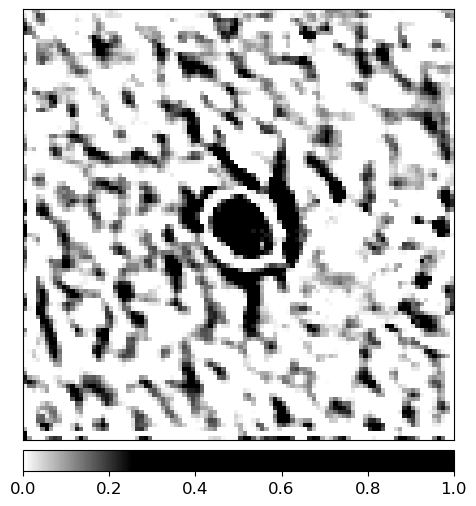

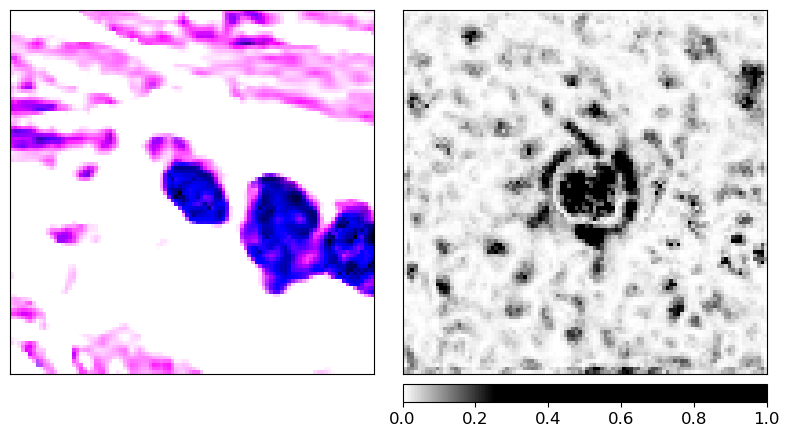

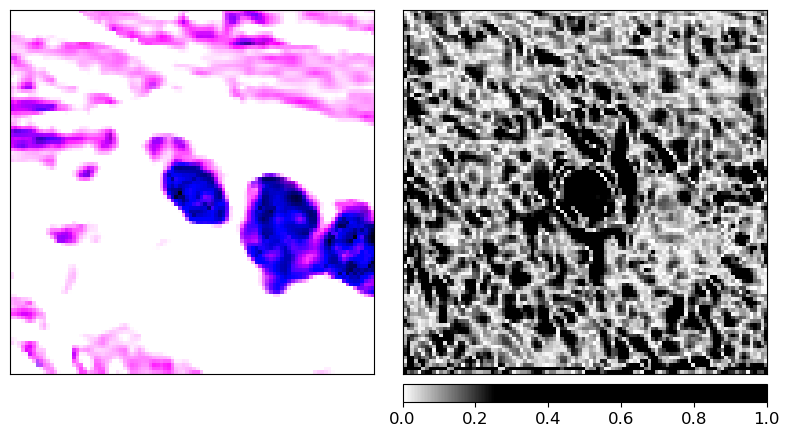

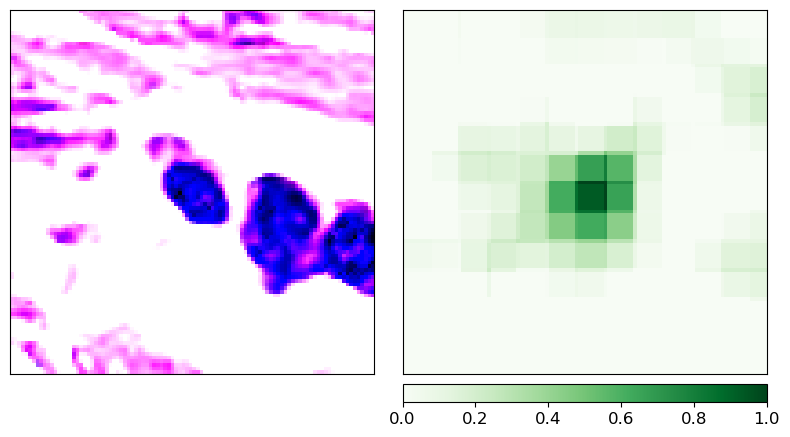

(3, 100, 100)
(3, 100, 100)


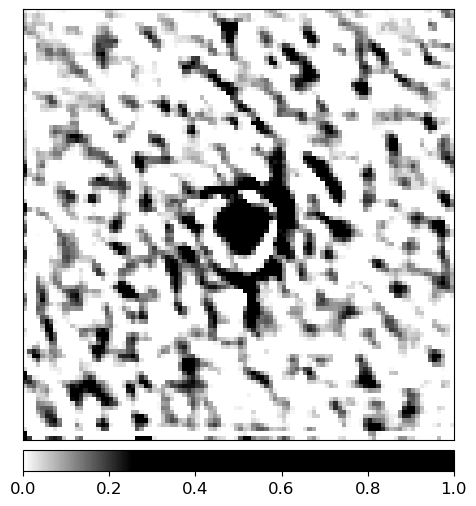

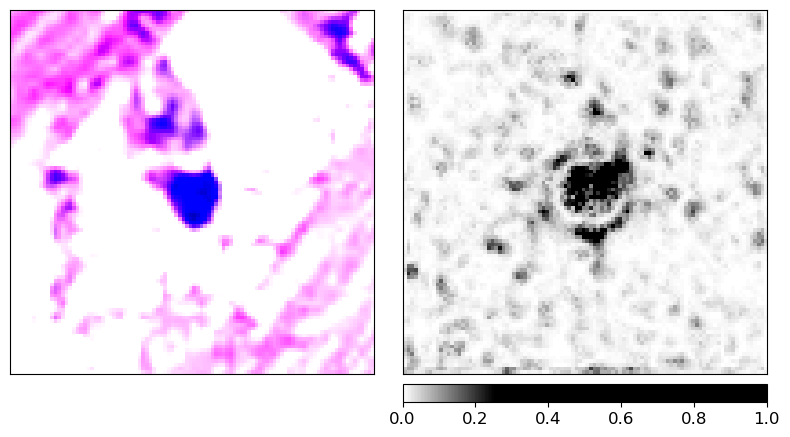

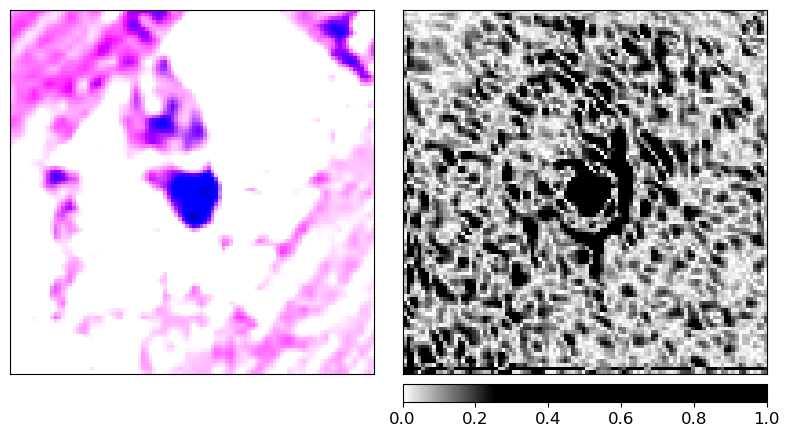

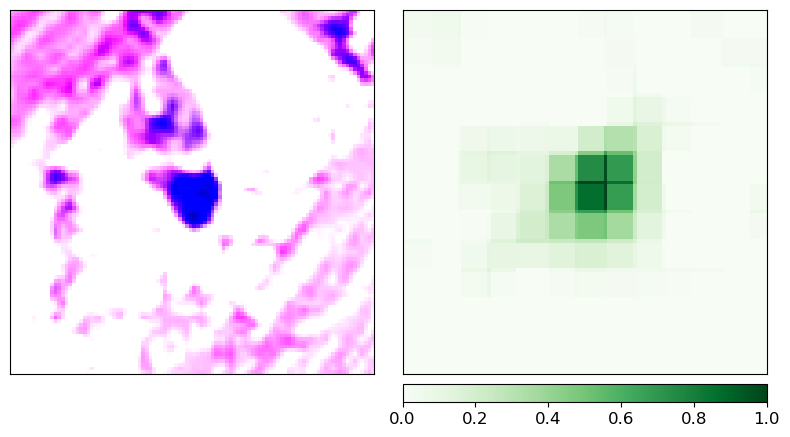

(3, 100, 100)
(3, 100, 100)


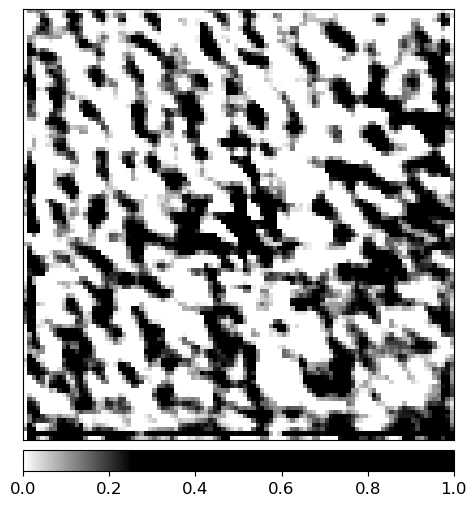

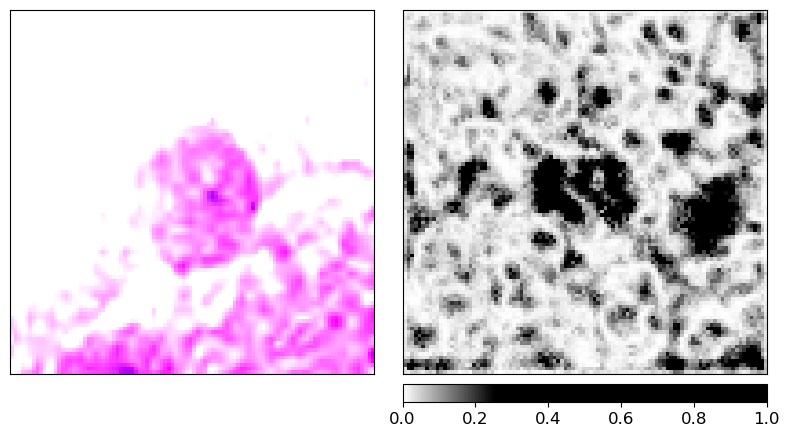

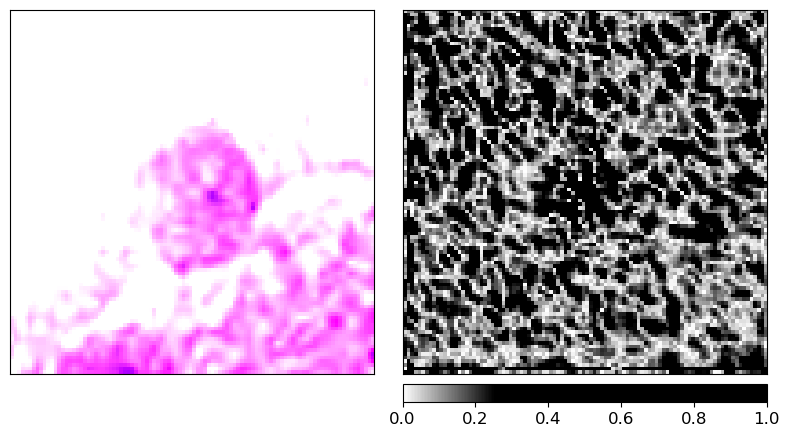

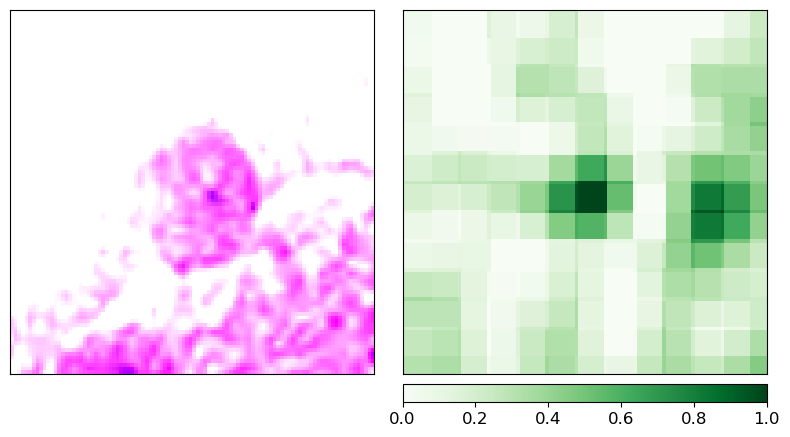

(3, 100, 100)
(3, 100, 100)


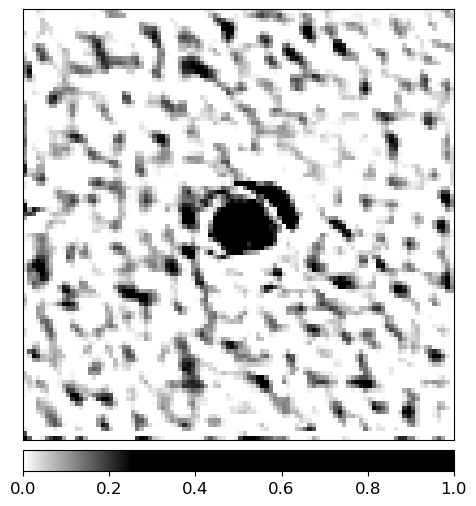

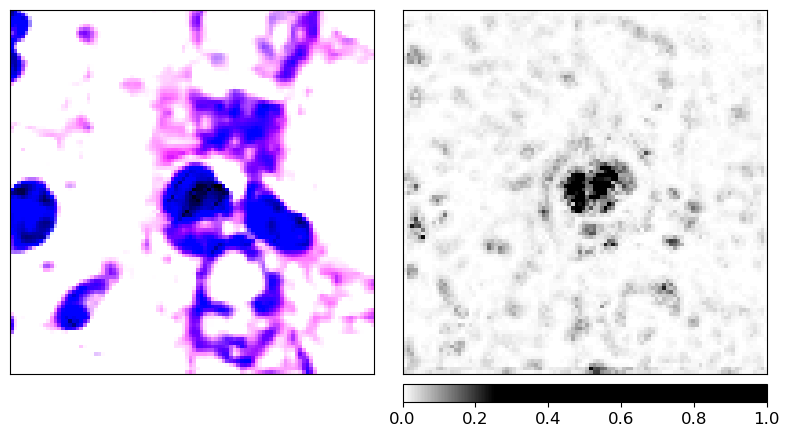

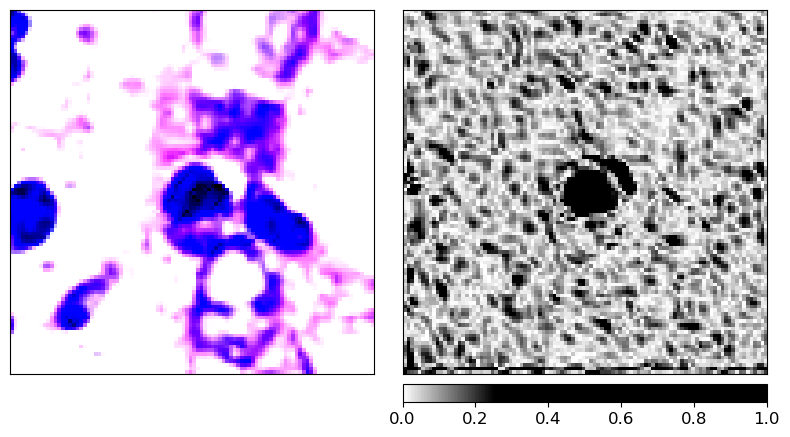

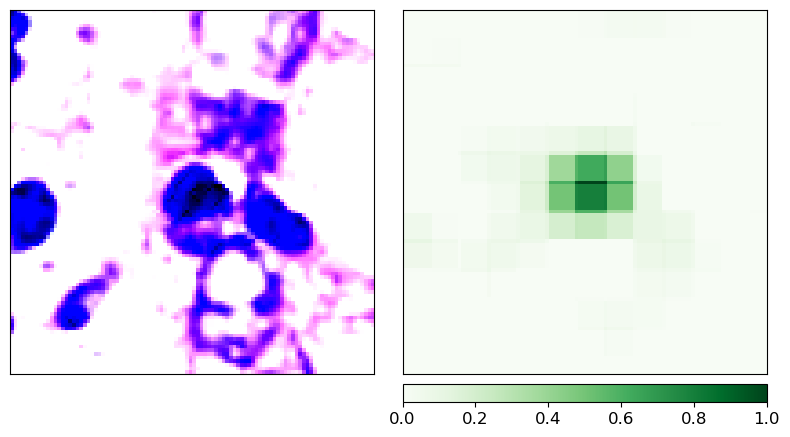

(3, 100, 100)
(3, 100, 100)


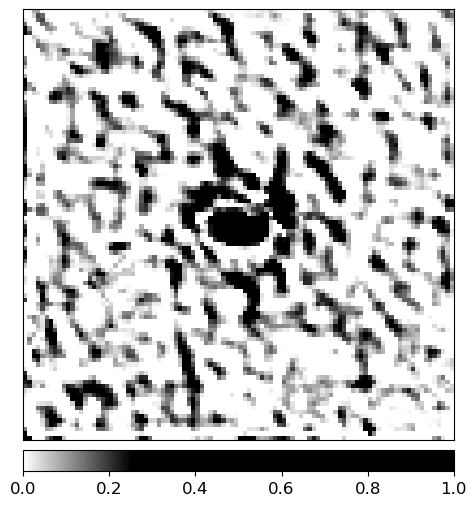

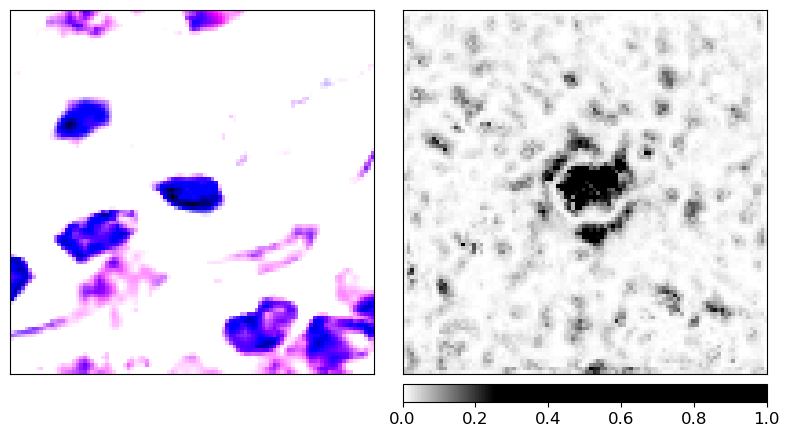

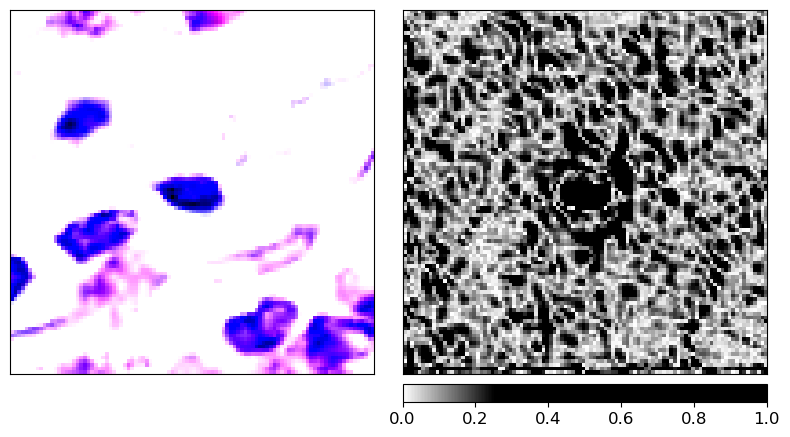

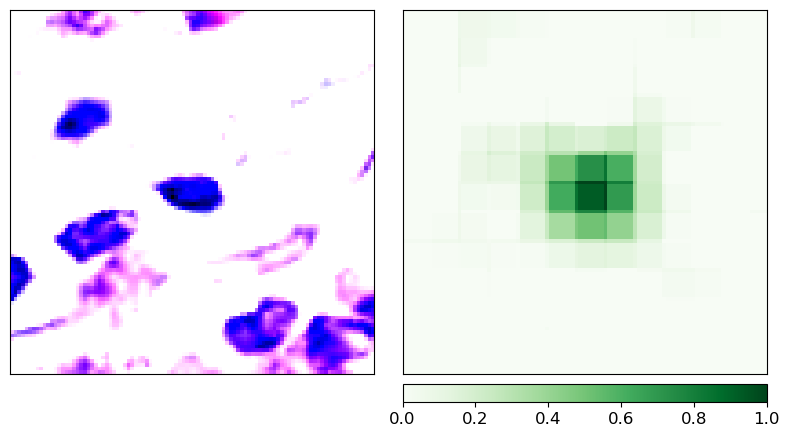

(3, 100, 100)
(3, 100, 100)


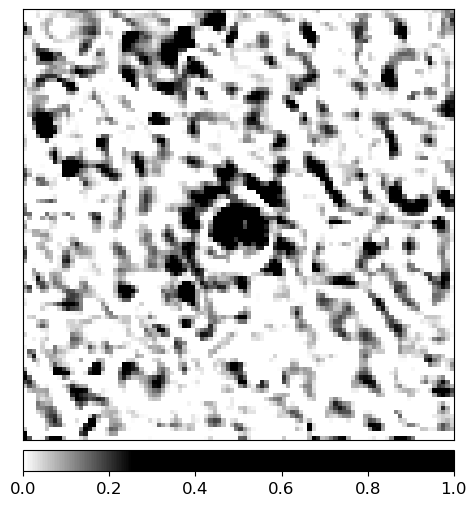

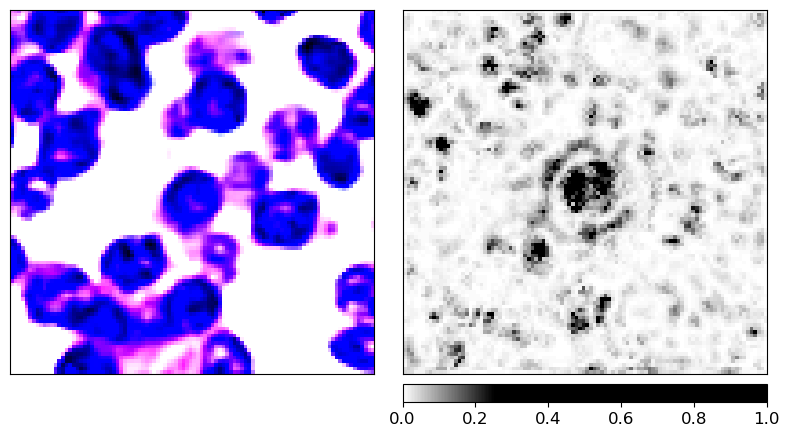

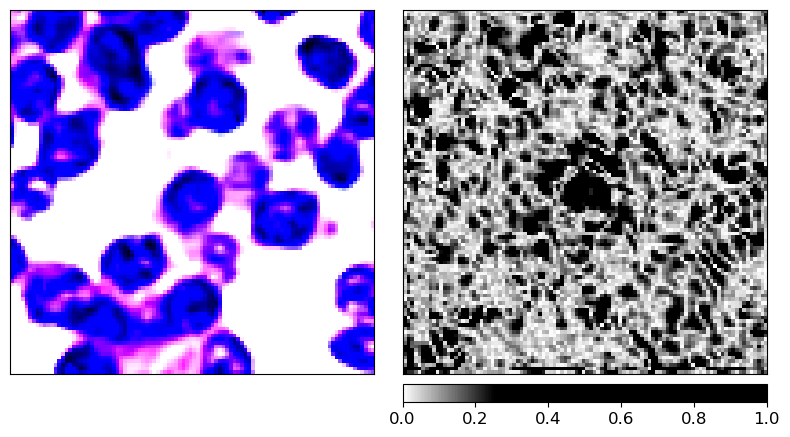

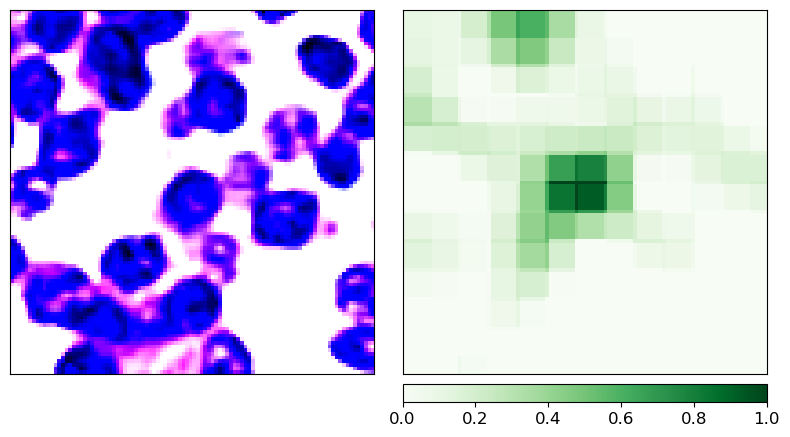

(3, 100, 100)
(3, 100, 100)


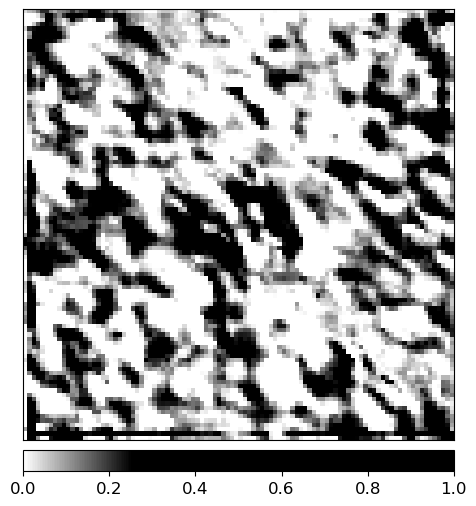

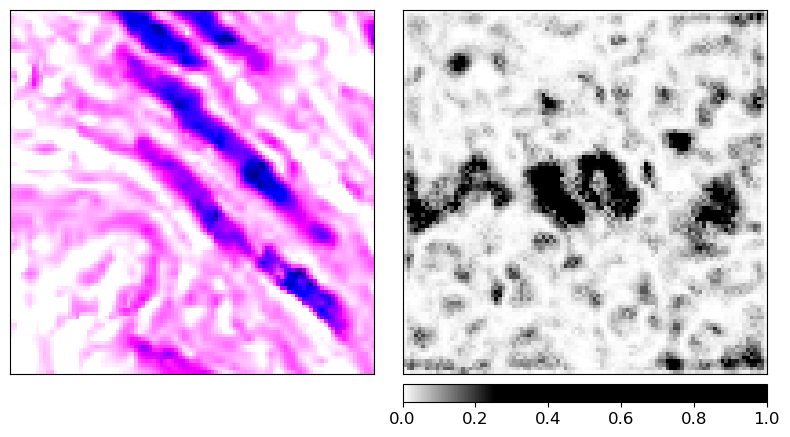

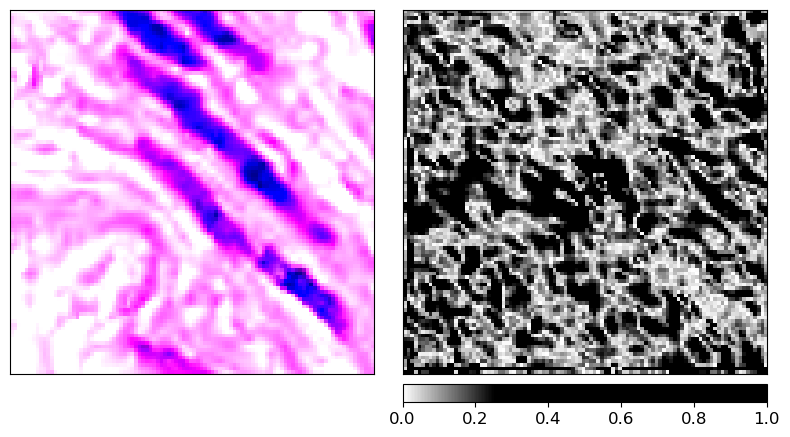

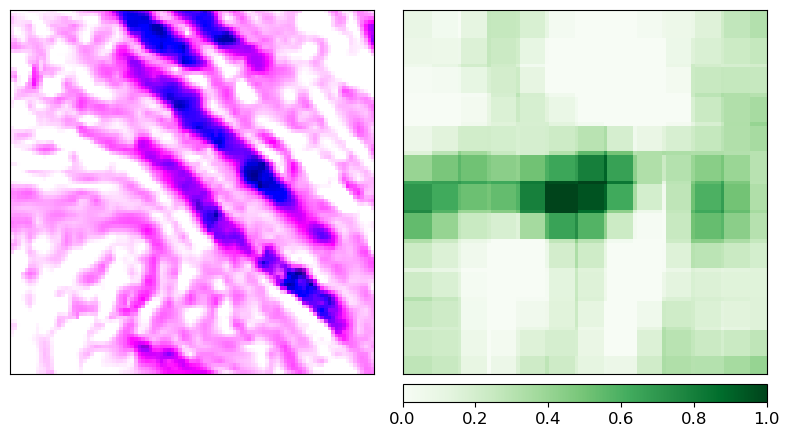

(3, 100, 100)
(3, 100, 100)


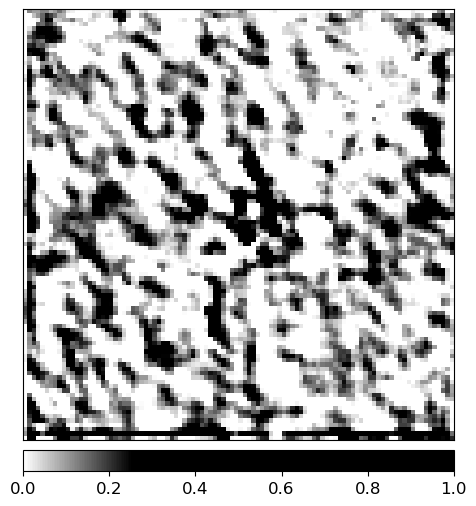

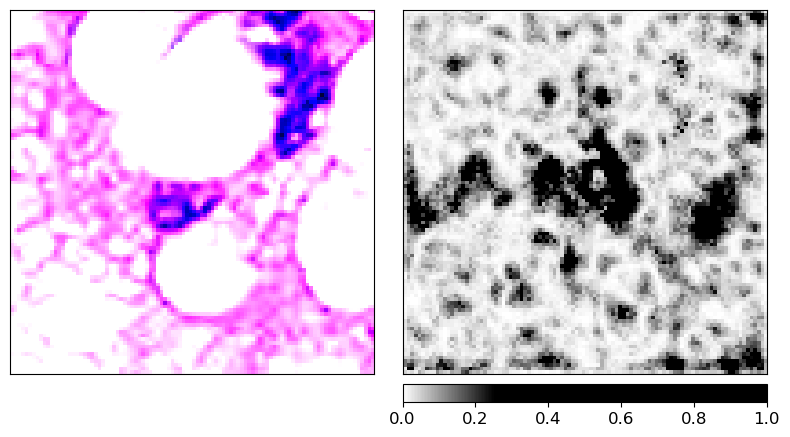

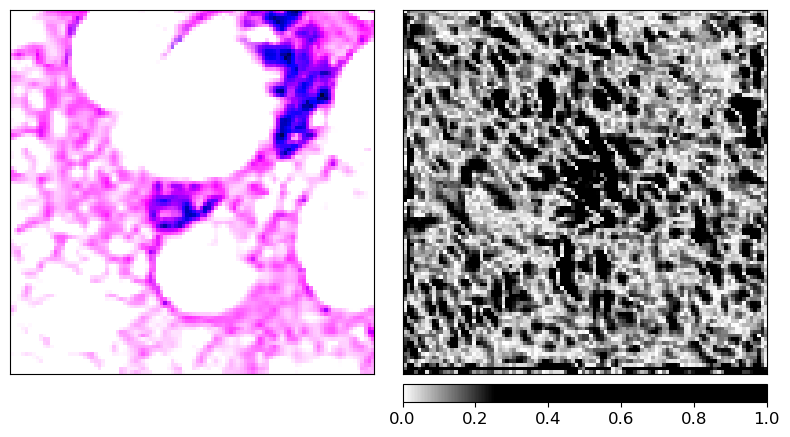

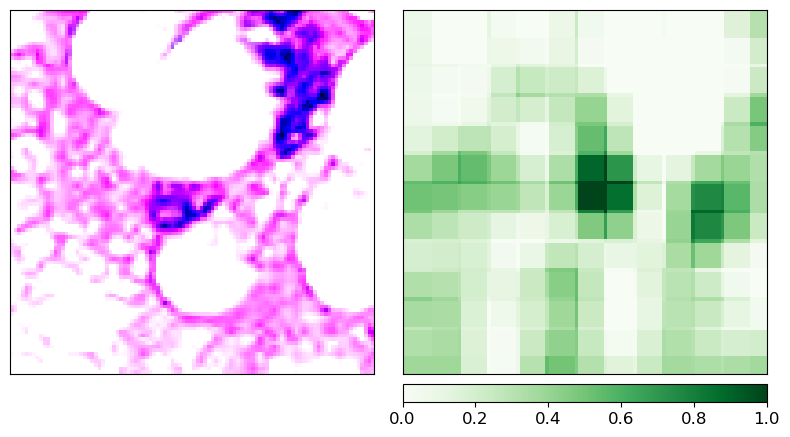

(3, 100, 100)
(3, 100, 100)


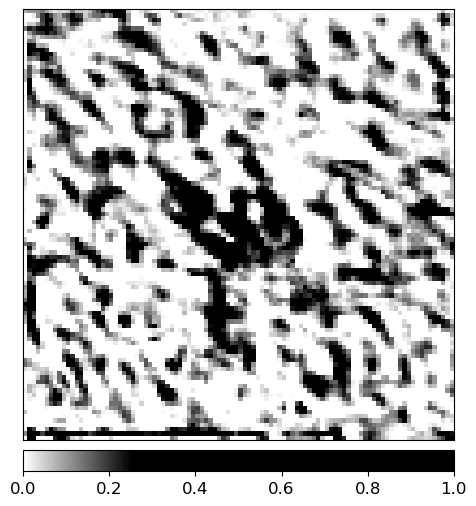

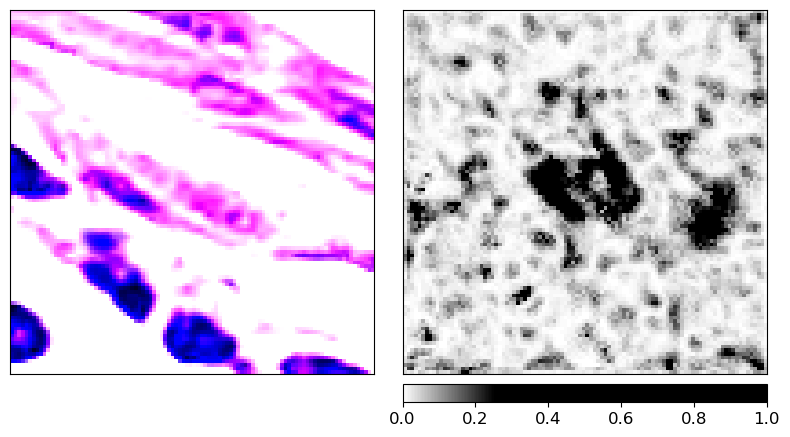

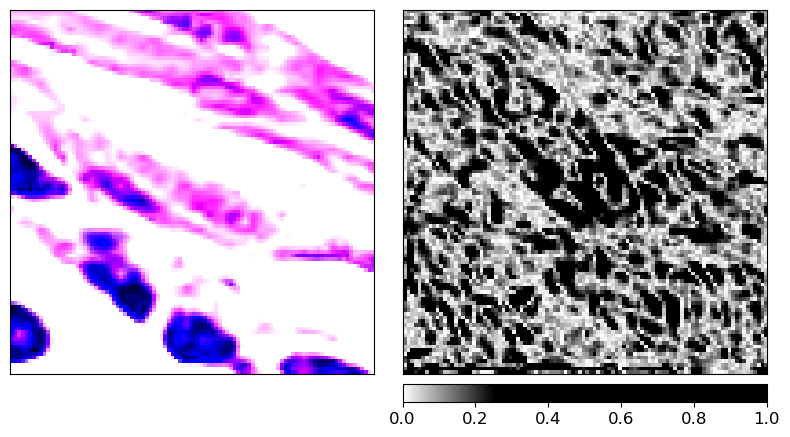

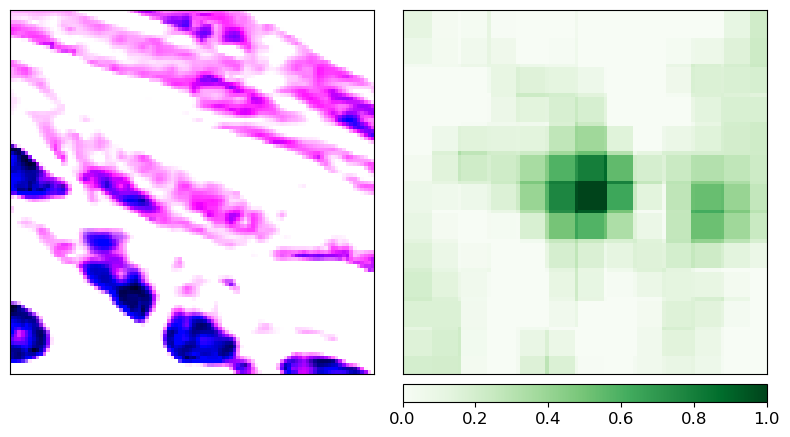

(3, 100, 100)
(3, 100, 100)


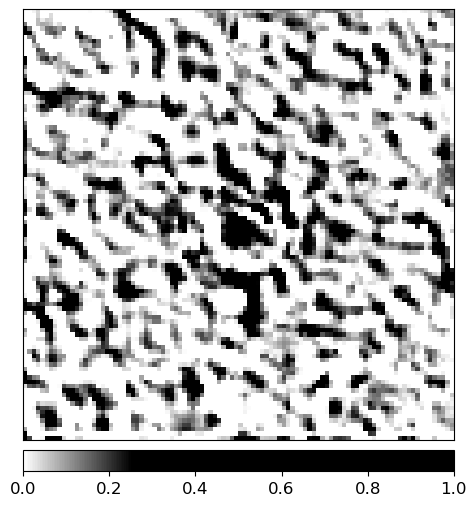

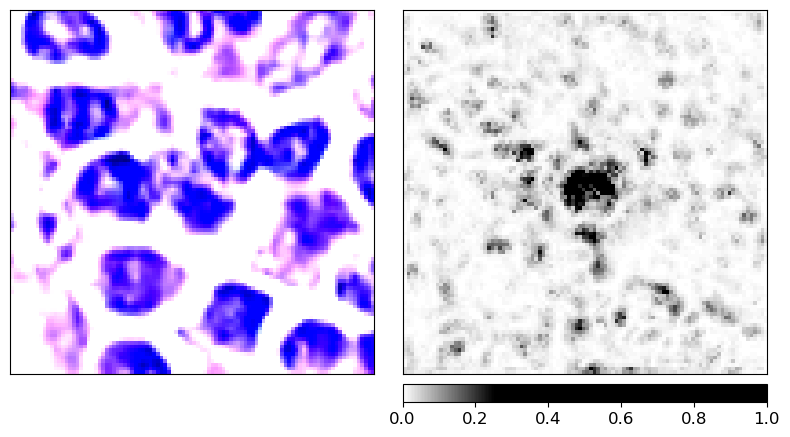

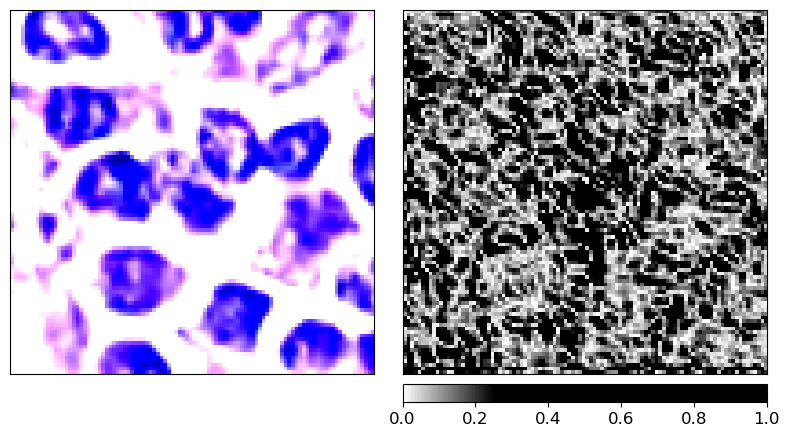

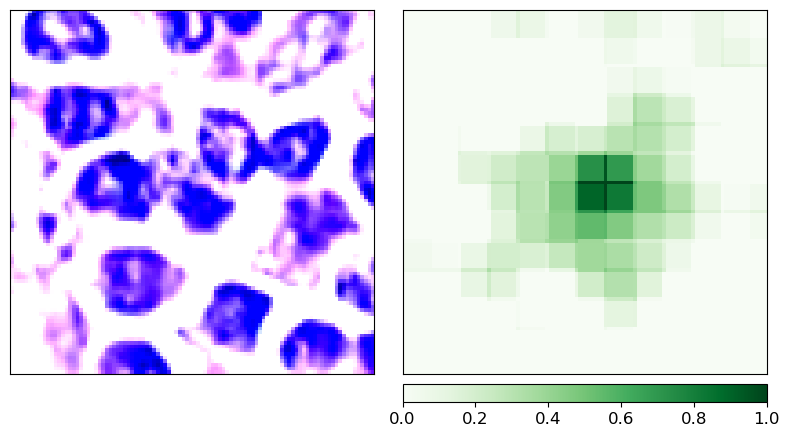

(3, 100, 100)
(3, 100, 100)


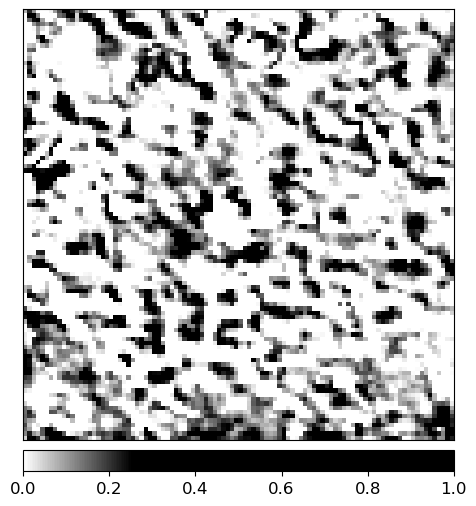

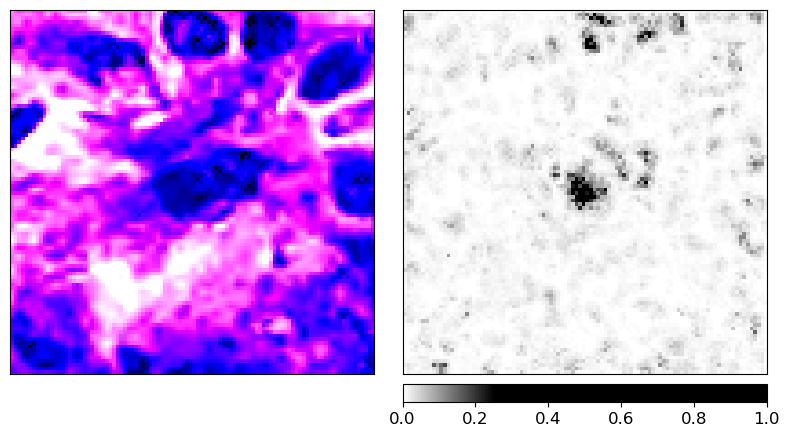

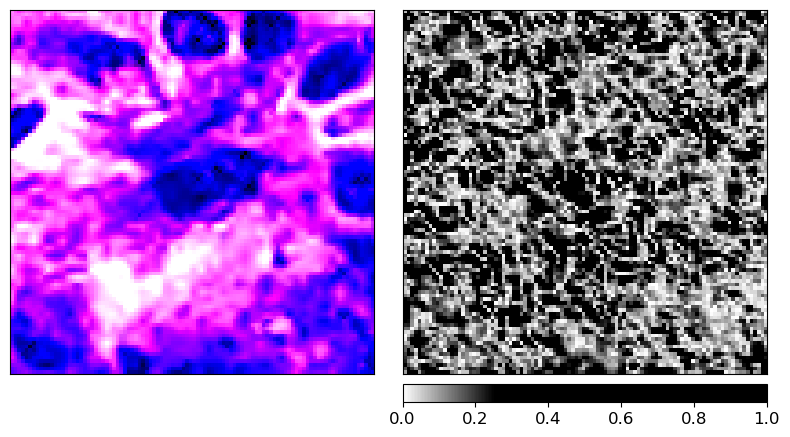

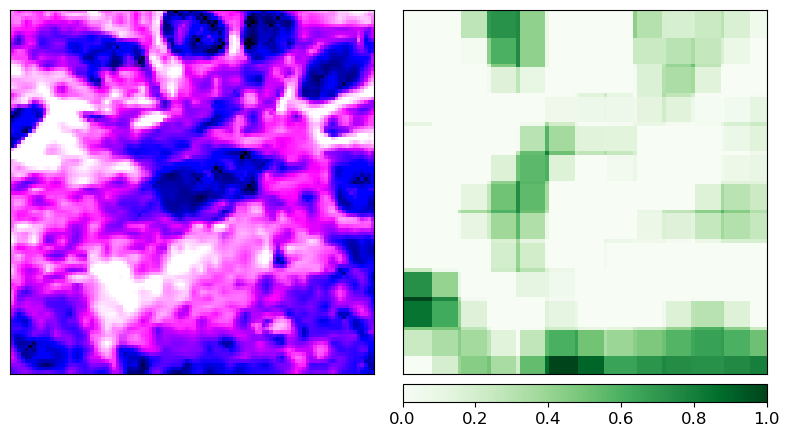

(3, 100, 100)
(3, 100, 100)


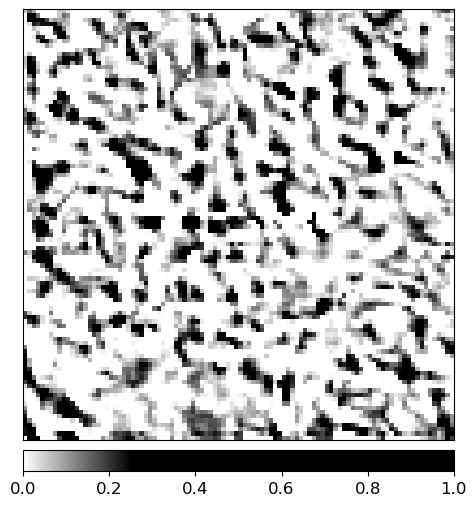

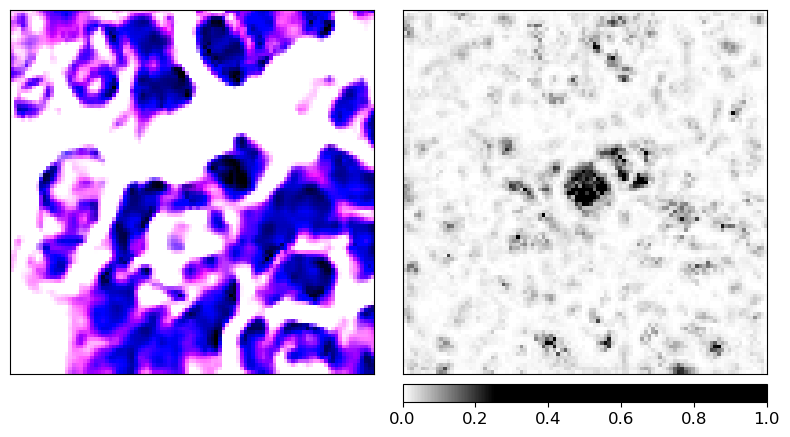

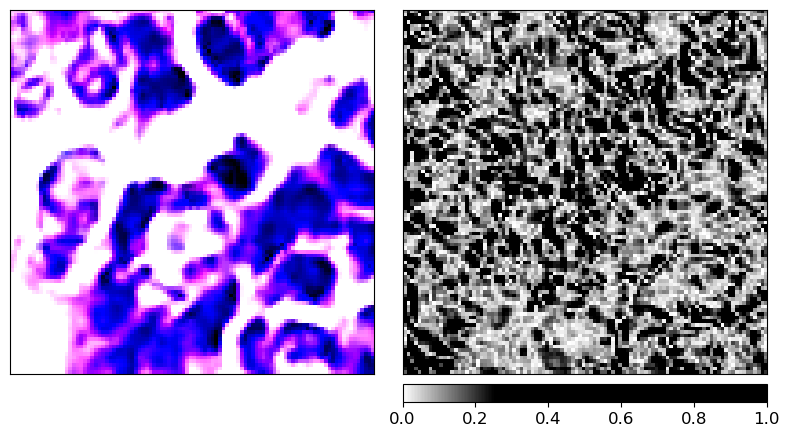

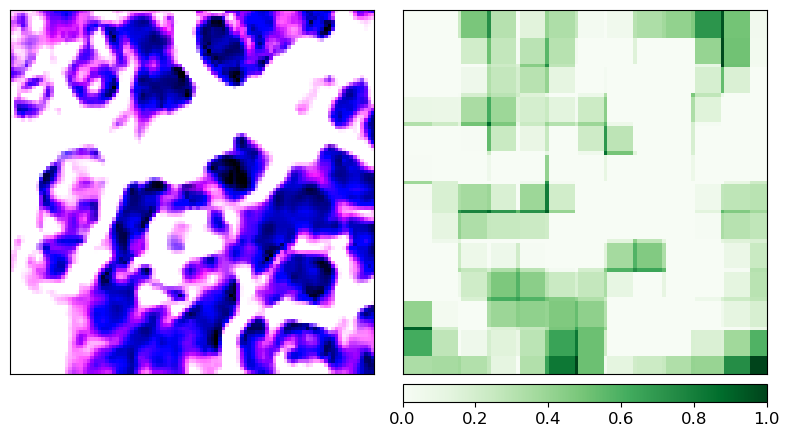

(3, 100, 100)
(3, 100, 100)


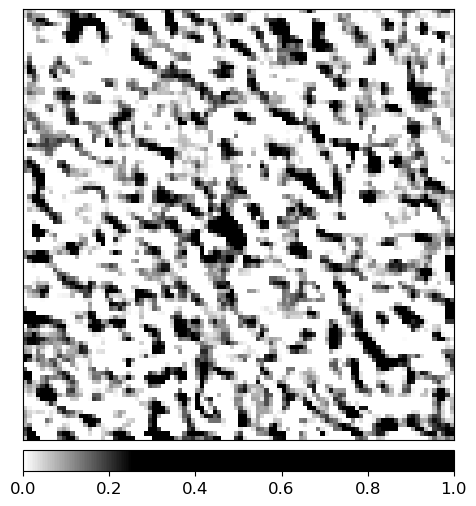

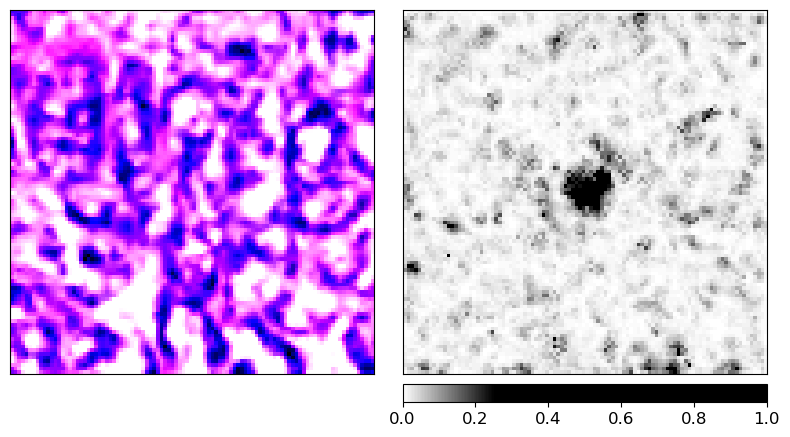

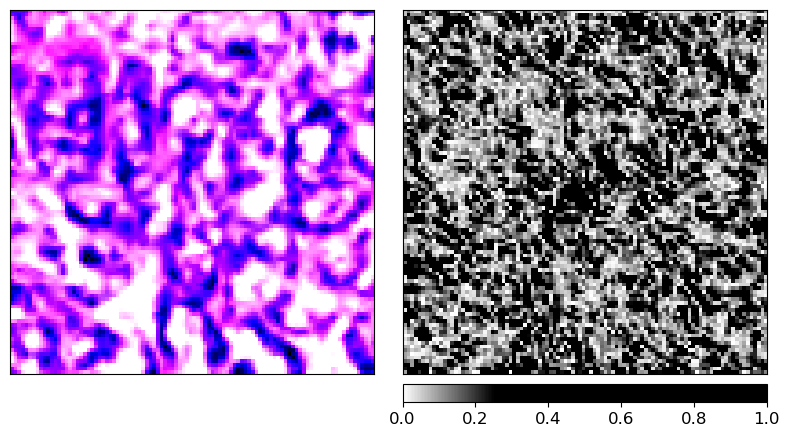

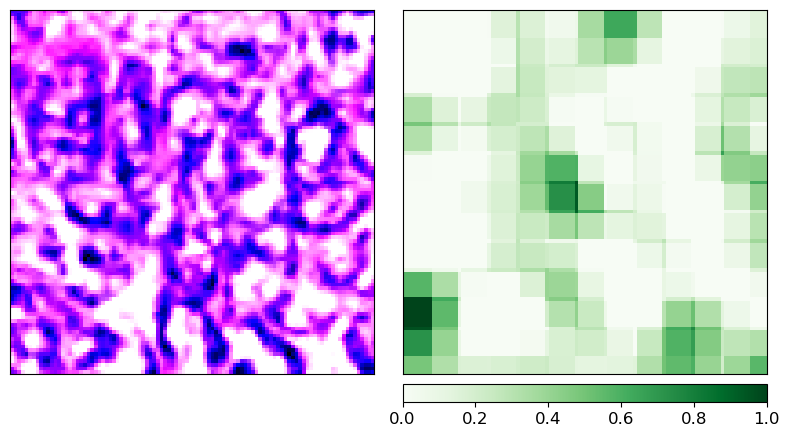

(3, 100, 100)
(3, 100, 100)


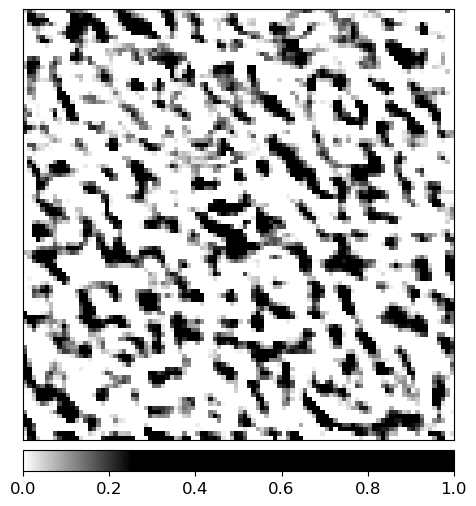

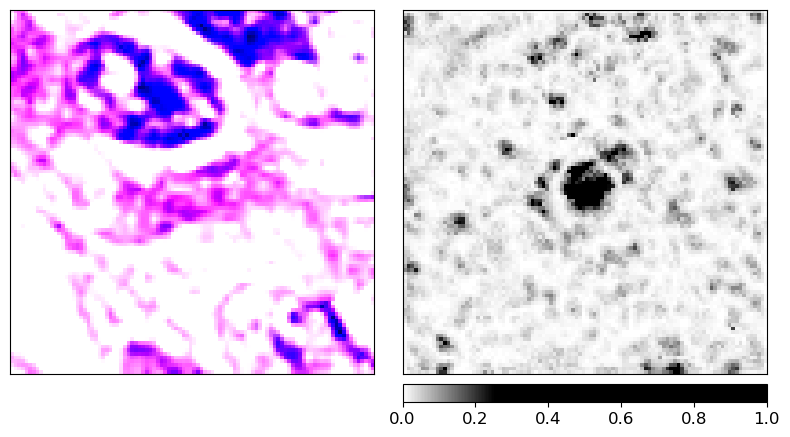

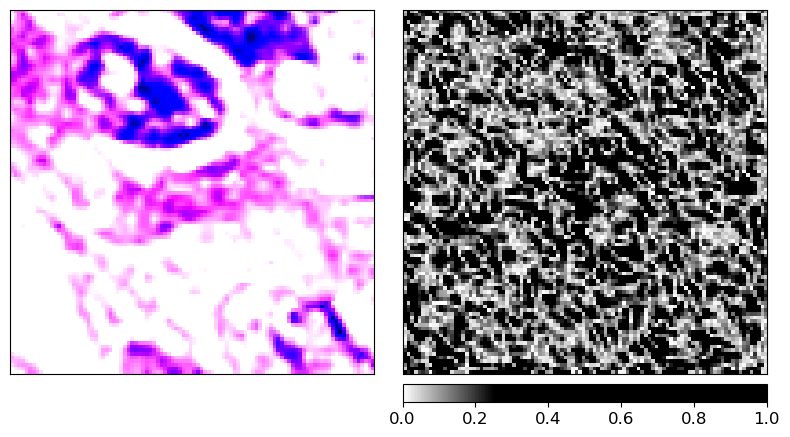

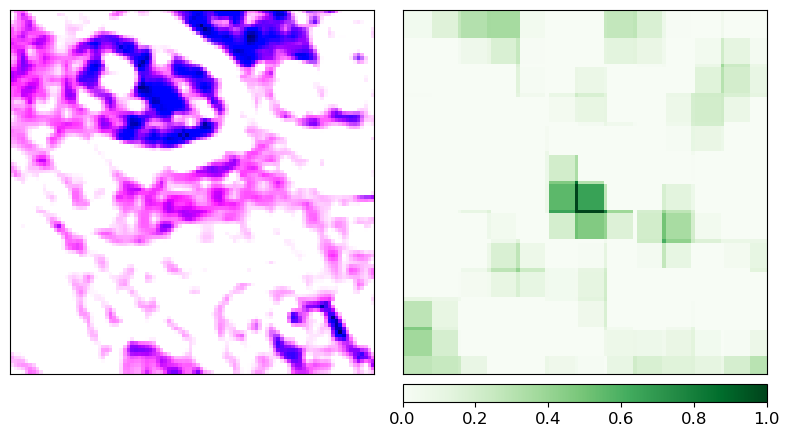

(3, 100, 100)
(3, 100, 100)


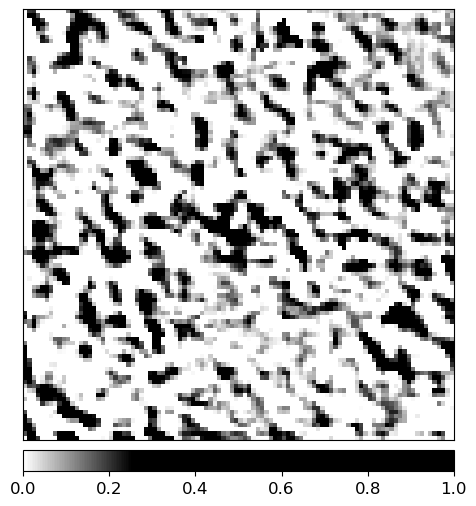

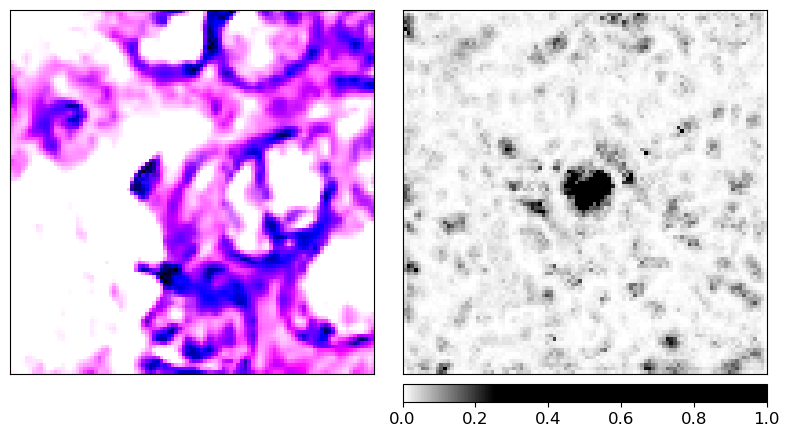

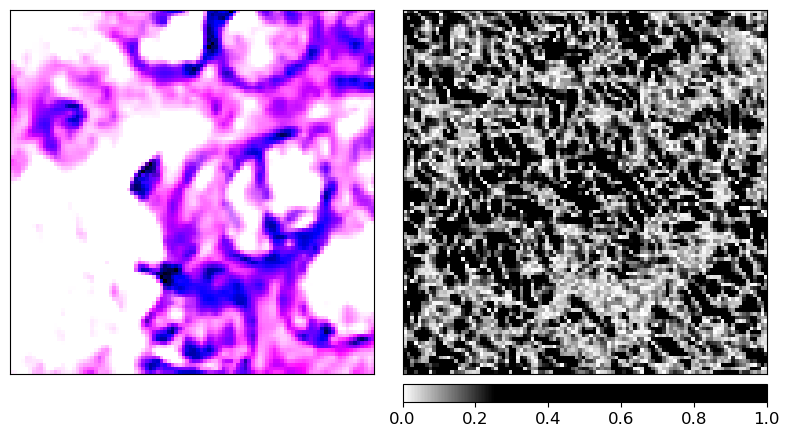

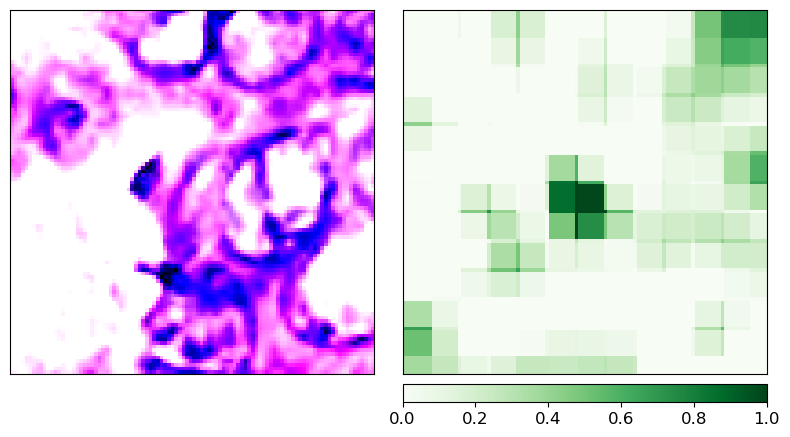

(3, 100, 100)
(3, 100, 100)


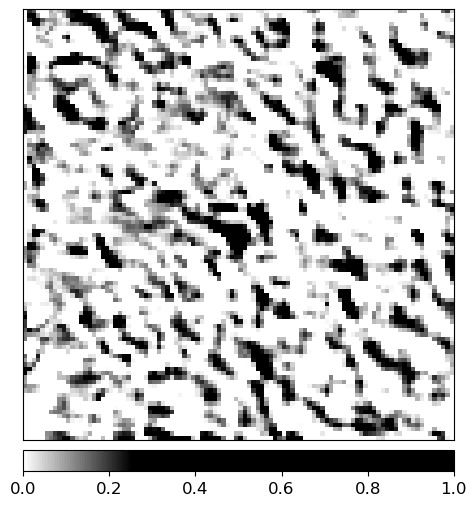

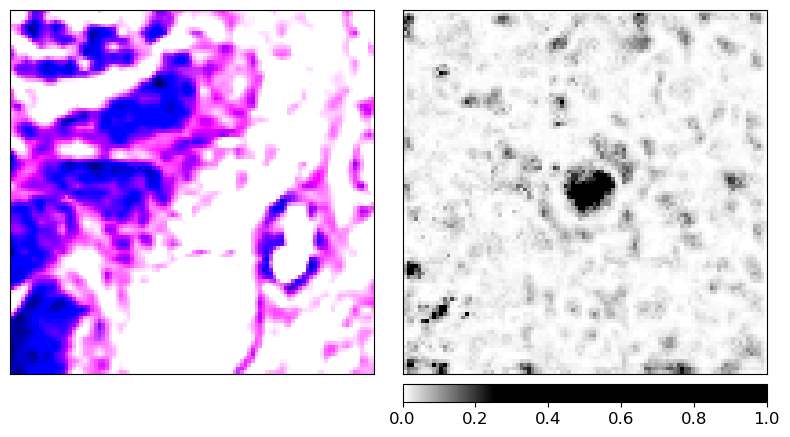

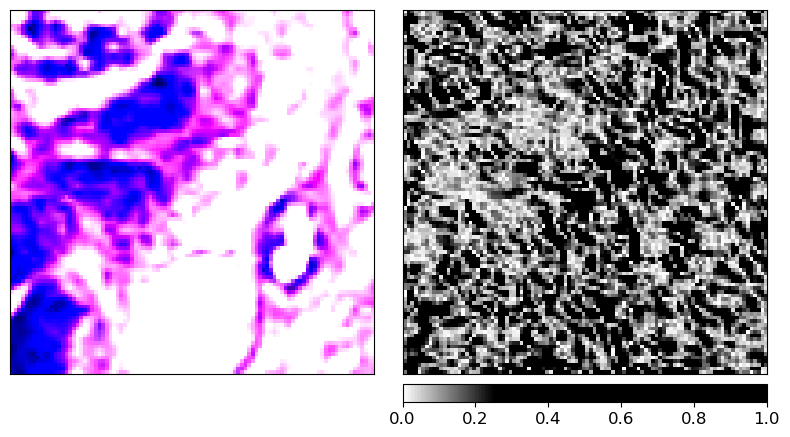

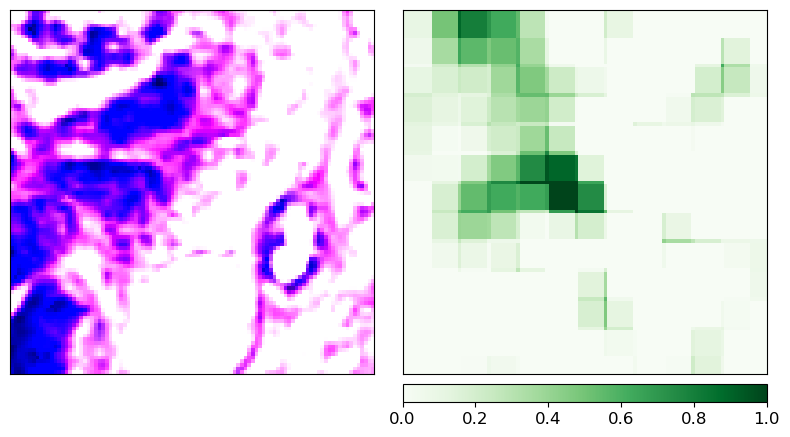

(3, 100, 100)
(3, 100, 100)


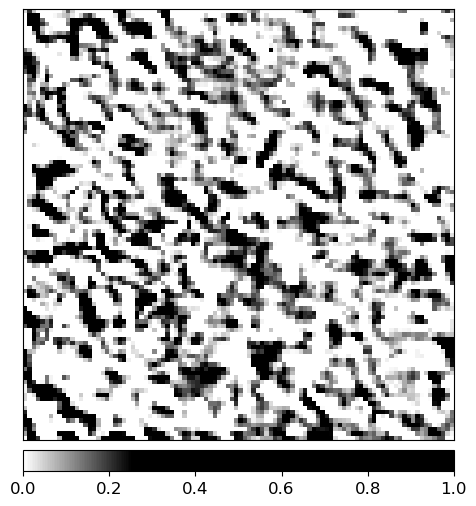

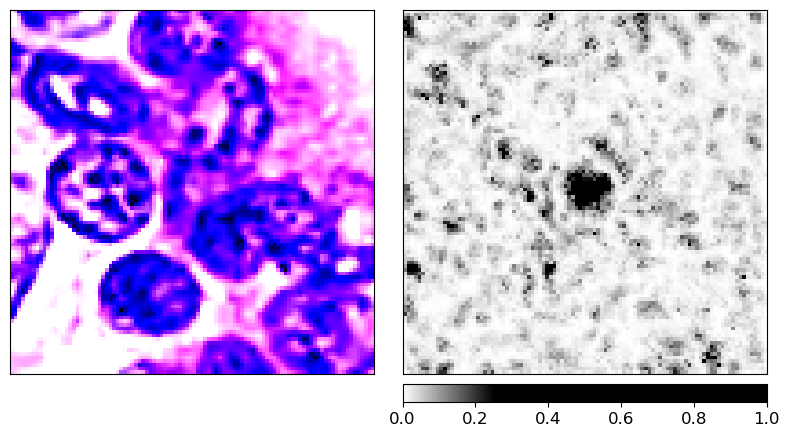

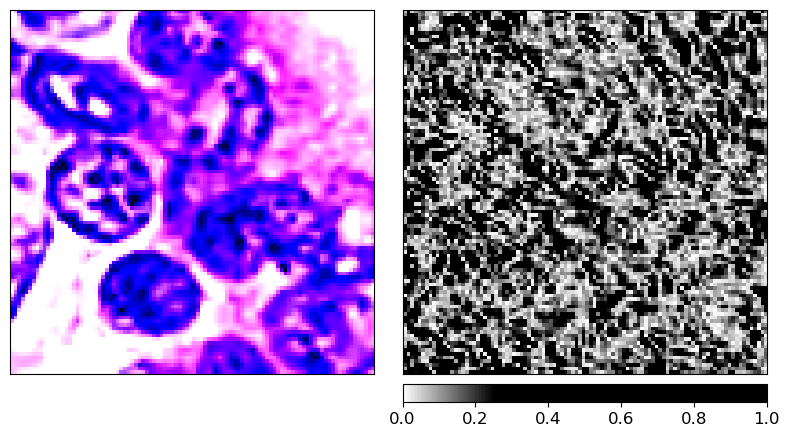

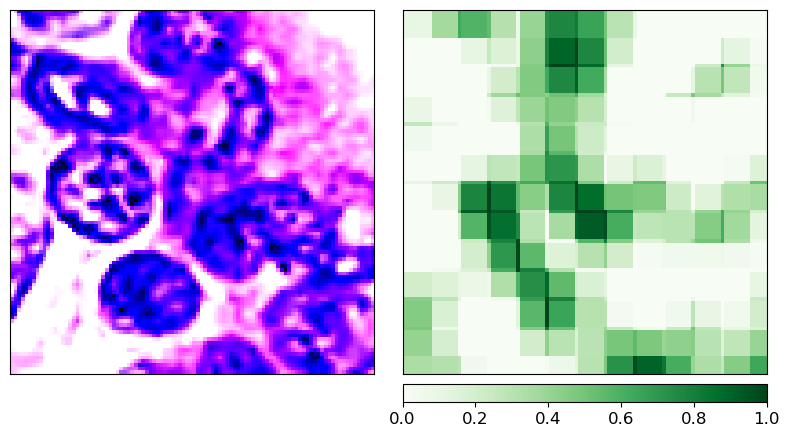

(3, 100, 100)
(3, 100, 100)


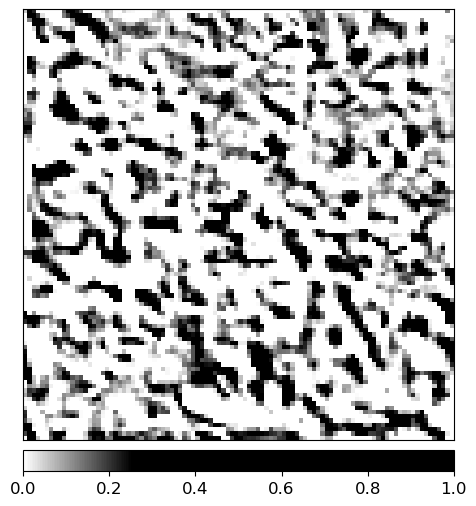

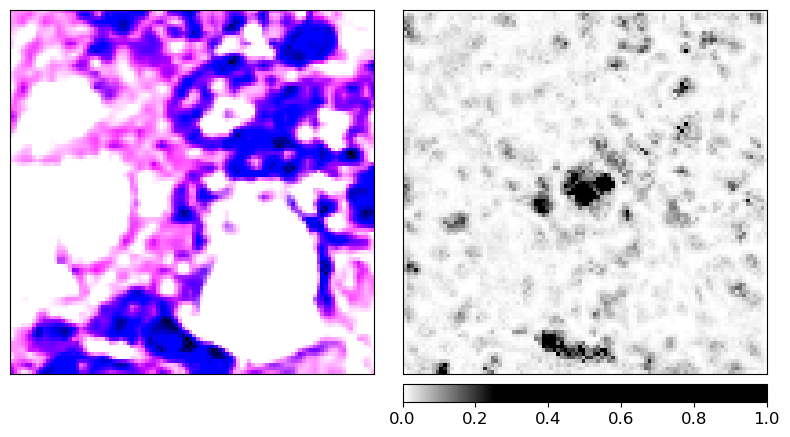

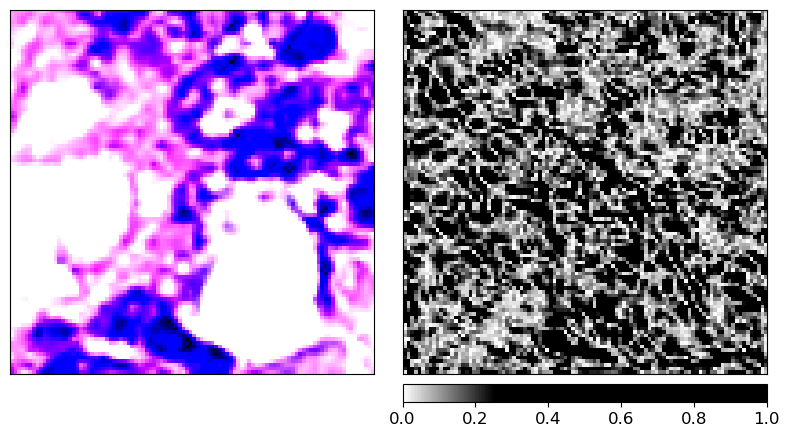

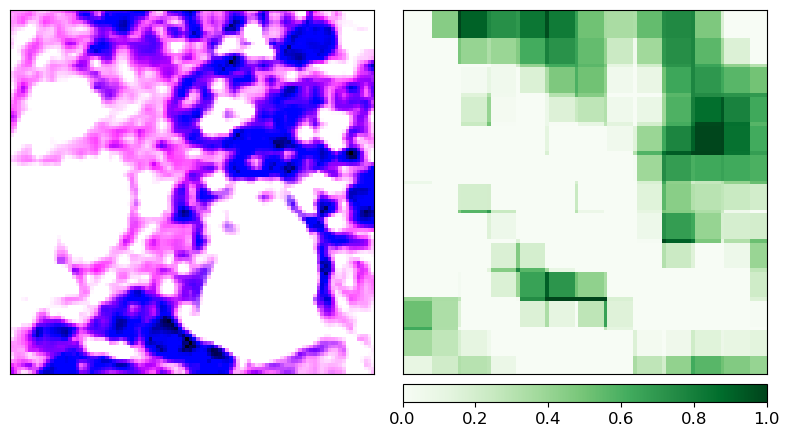

(3, 100, 100)
(3, 100, 100)


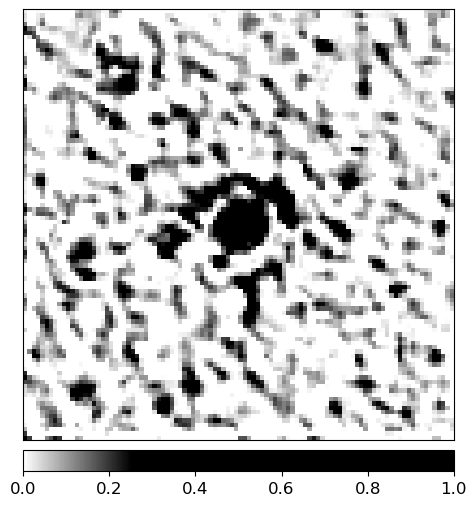

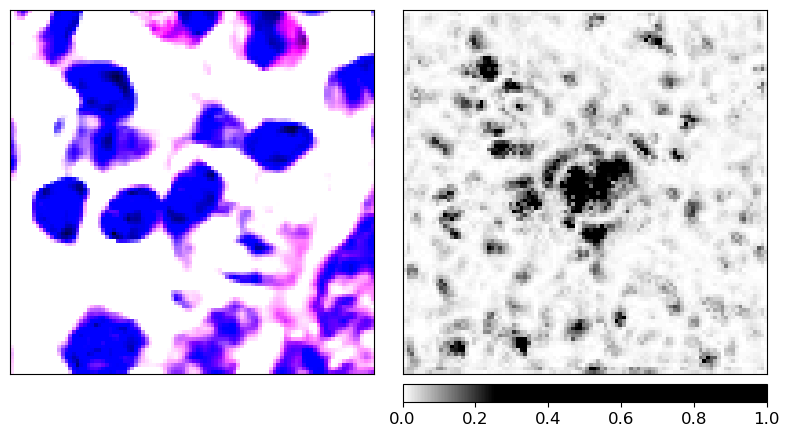

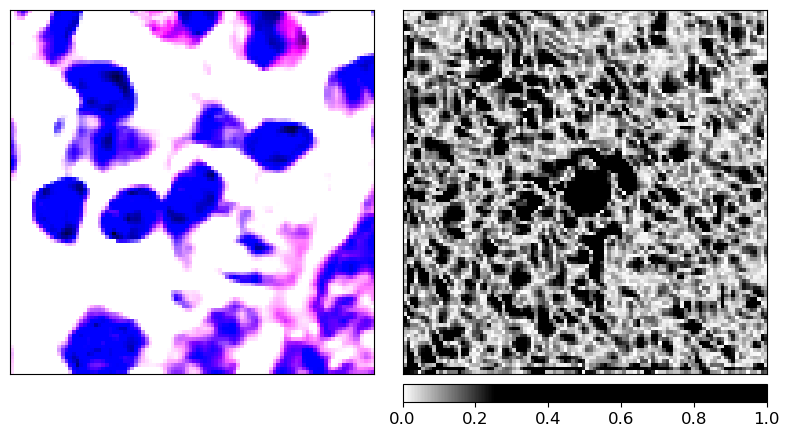

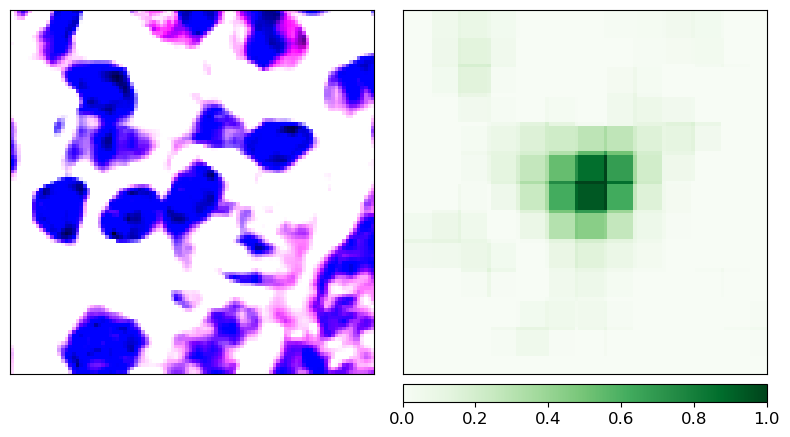

(3, 100, 100)
(3, 100, 100)


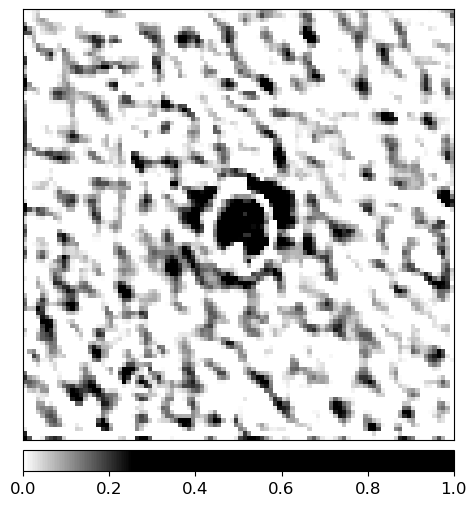

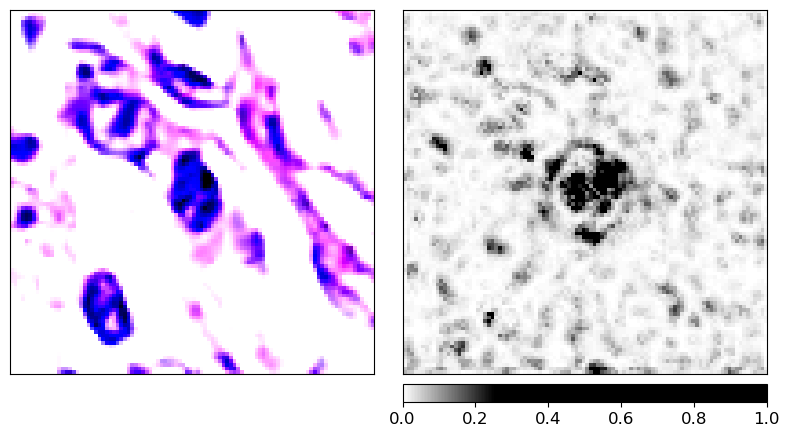

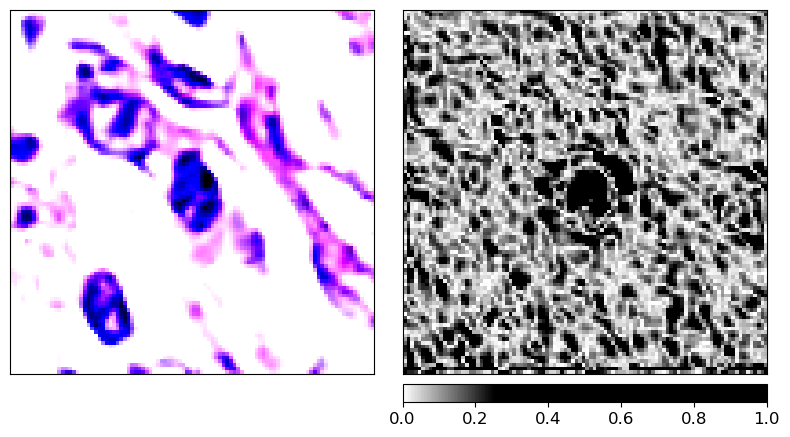

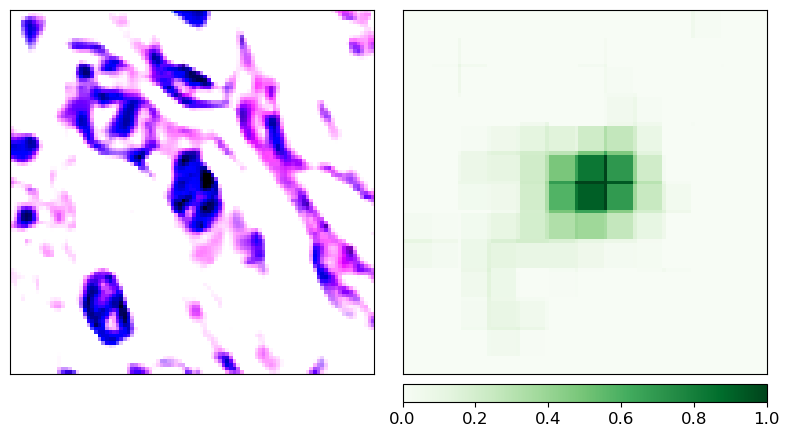

(3, 100, 100)
(3, 100, 100)


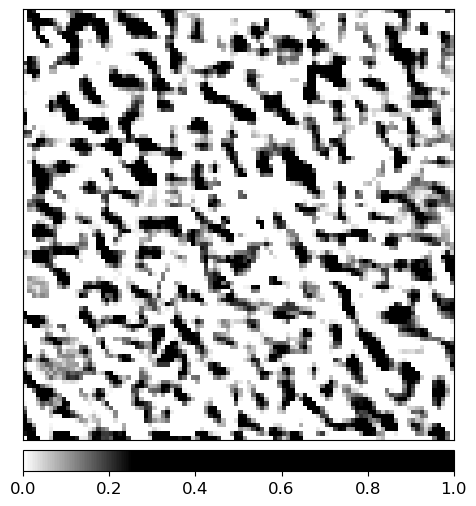

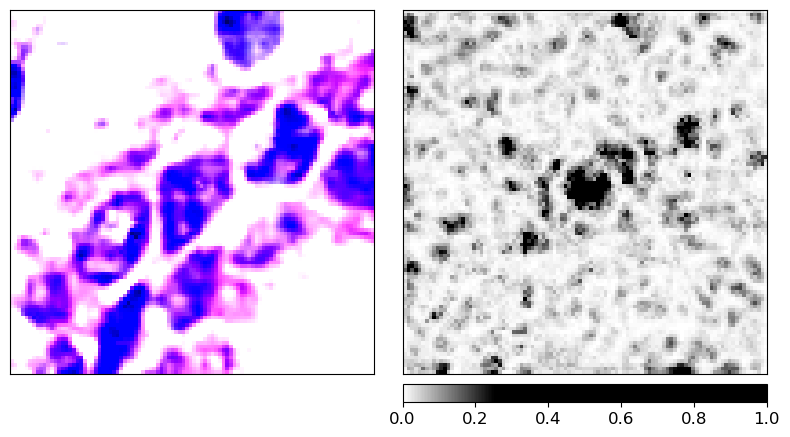

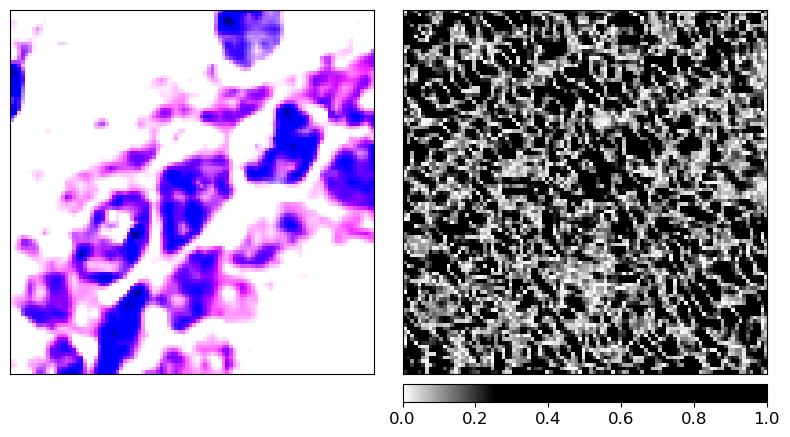

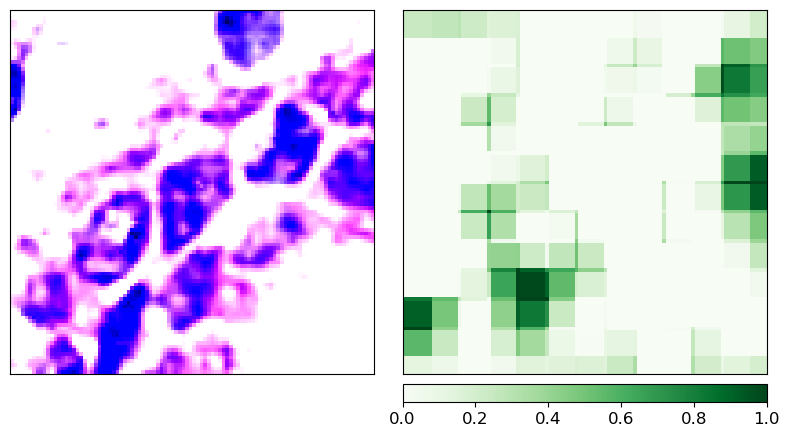

(3, 100, 100)
(3, 100, 100)


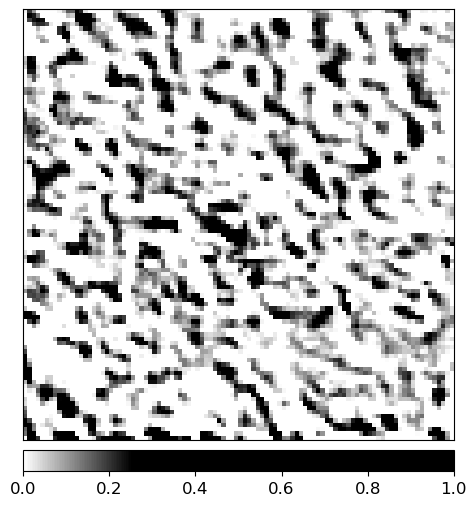

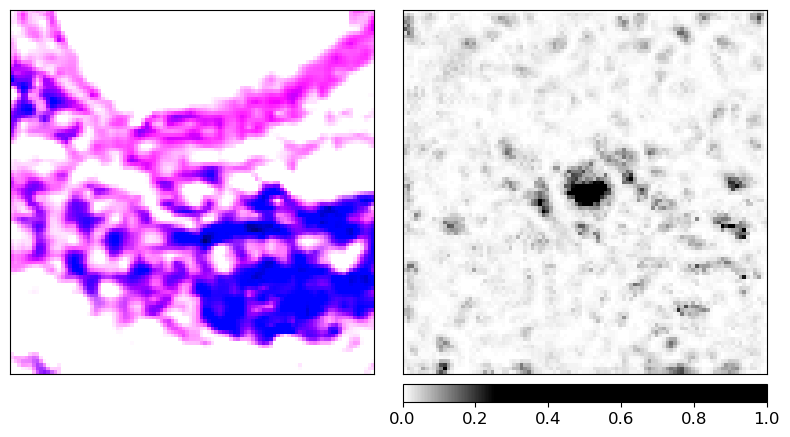

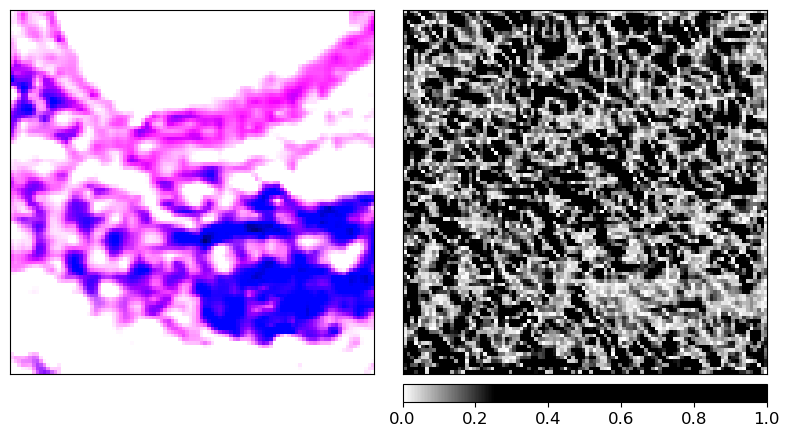

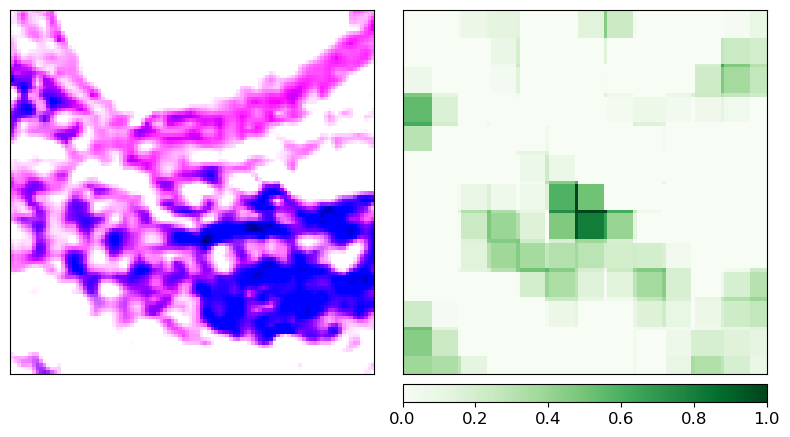

(3, 100, 100)
(3, 100, 100)


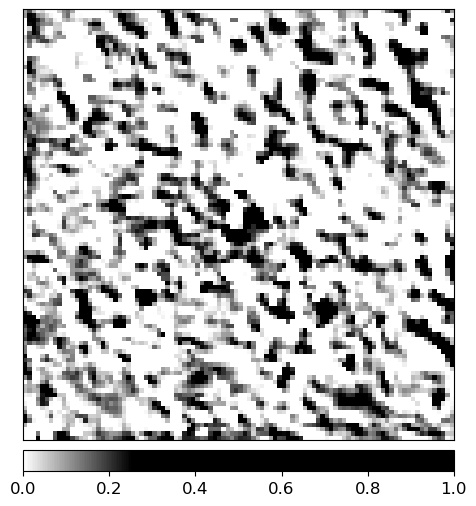

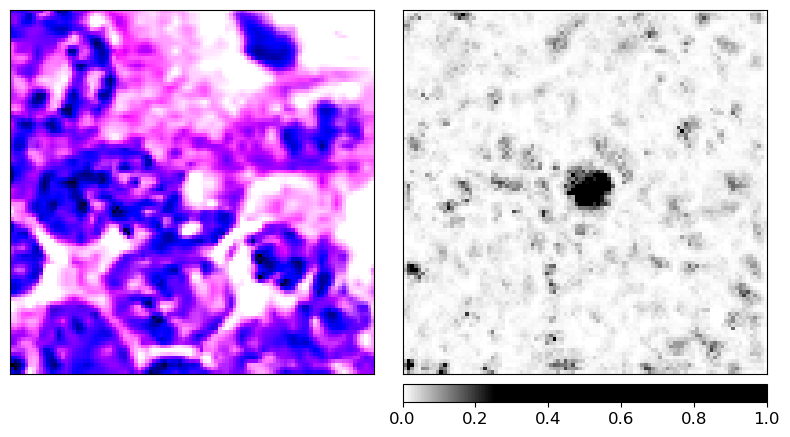

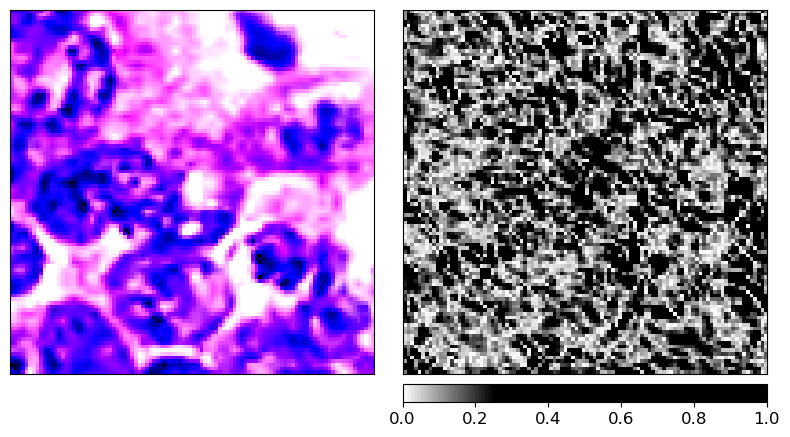

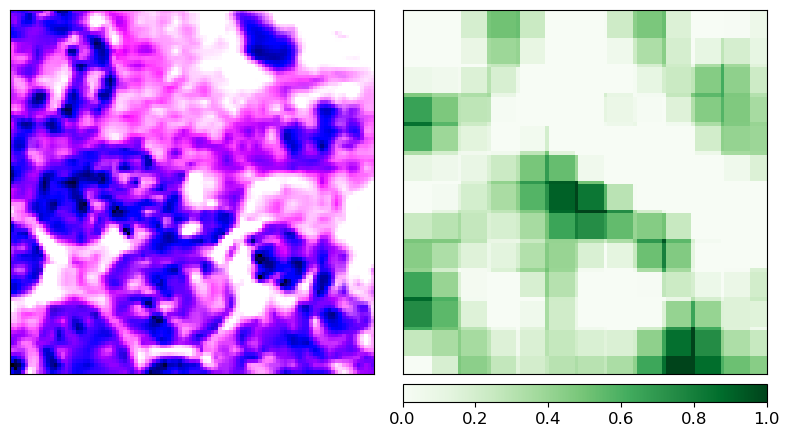

(3, 100, 100)
(3, 100, 100)


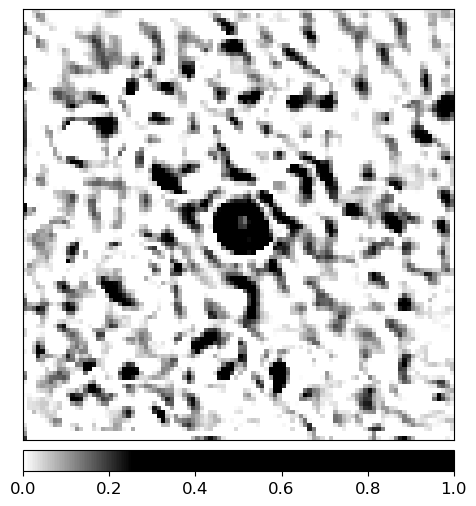

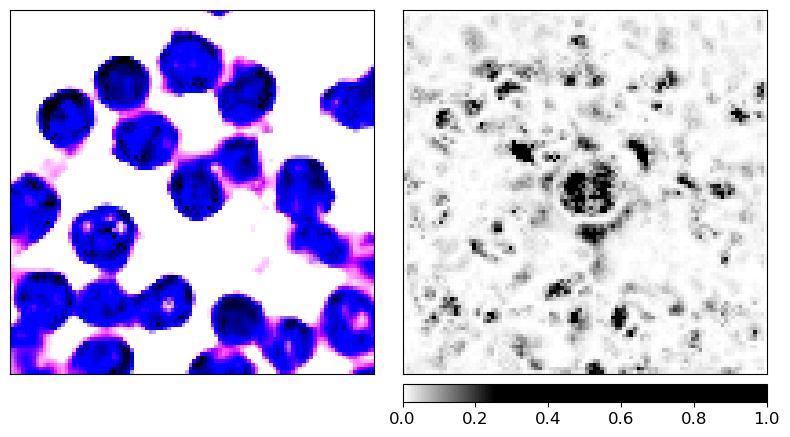

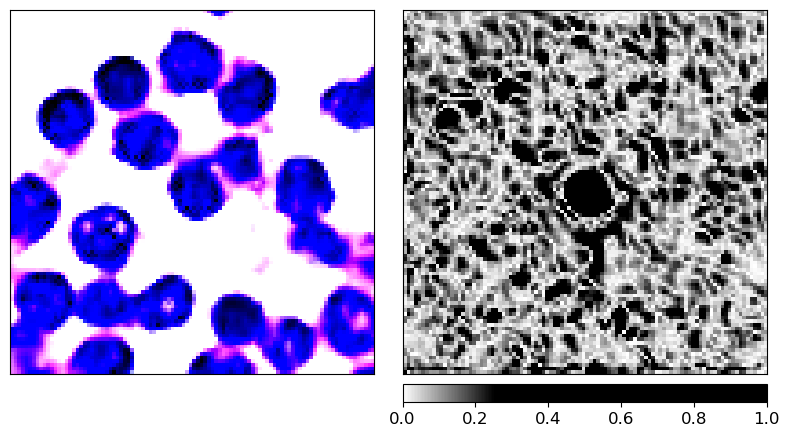

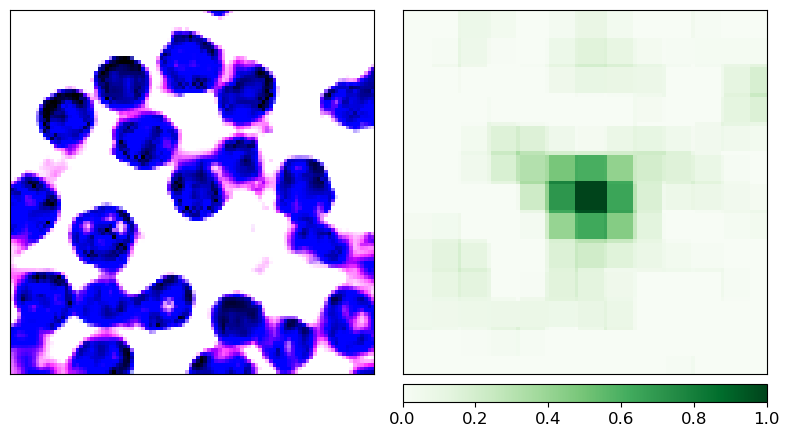

(3, 100, 100)
(3, 100, 100)


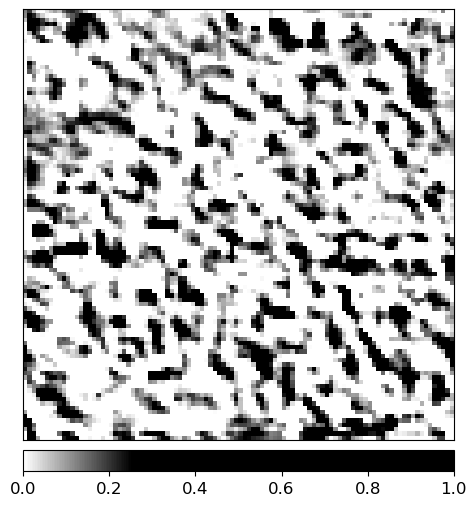

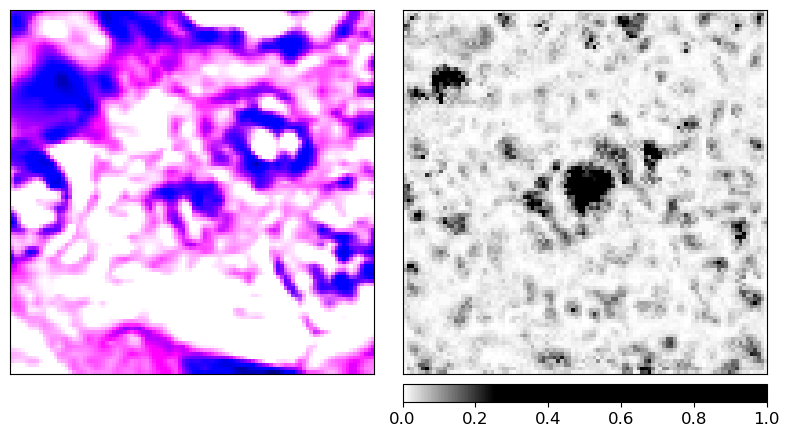

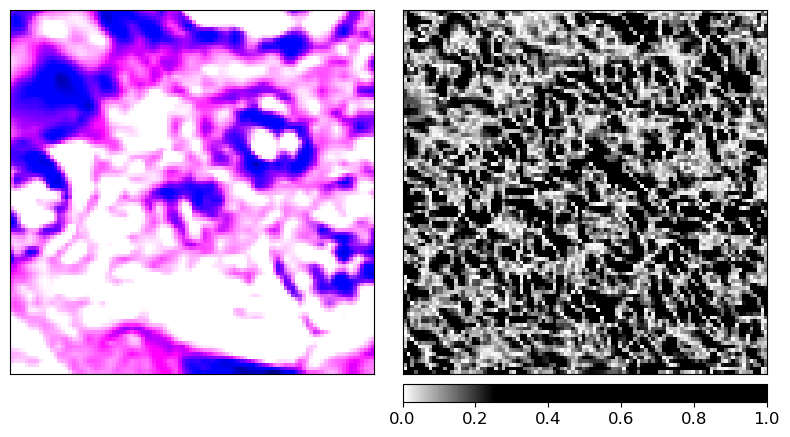

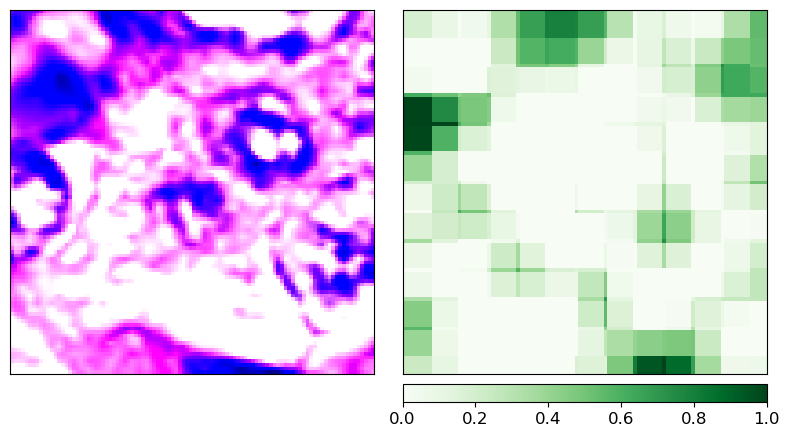

(3, 100, 100)
(3, 100, 100)


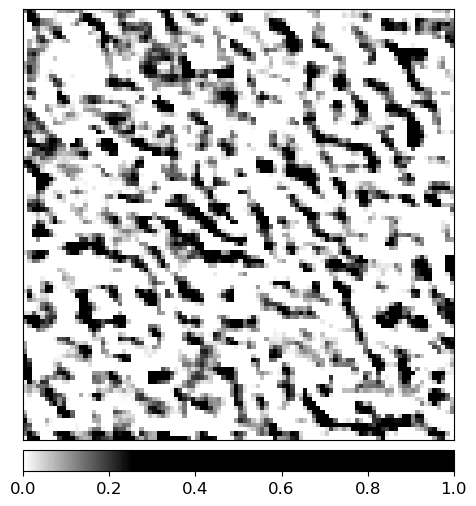

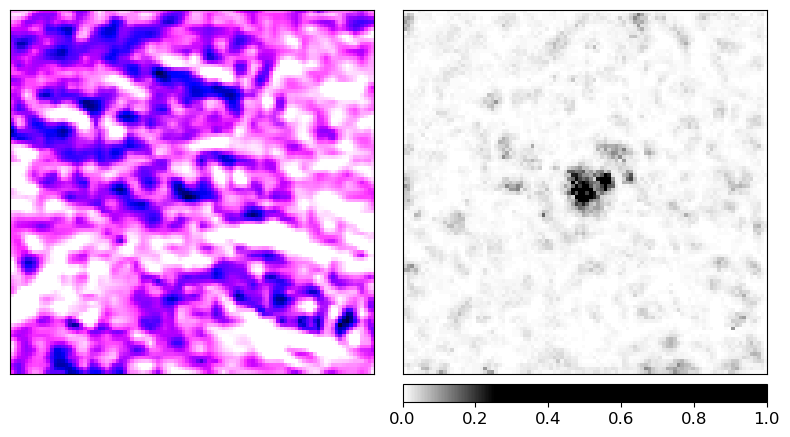

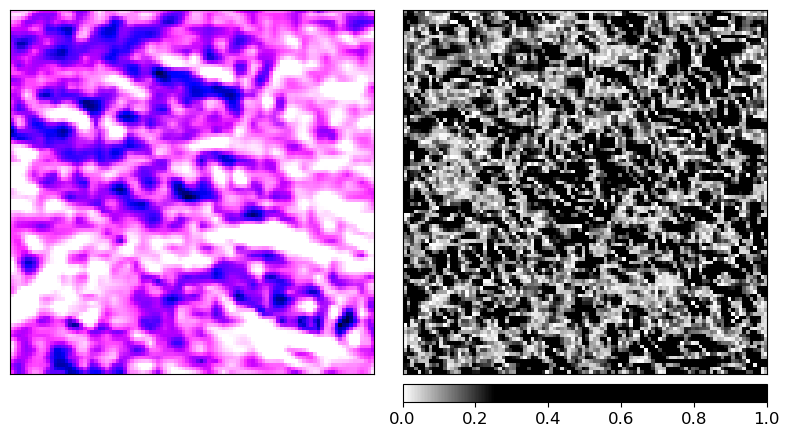

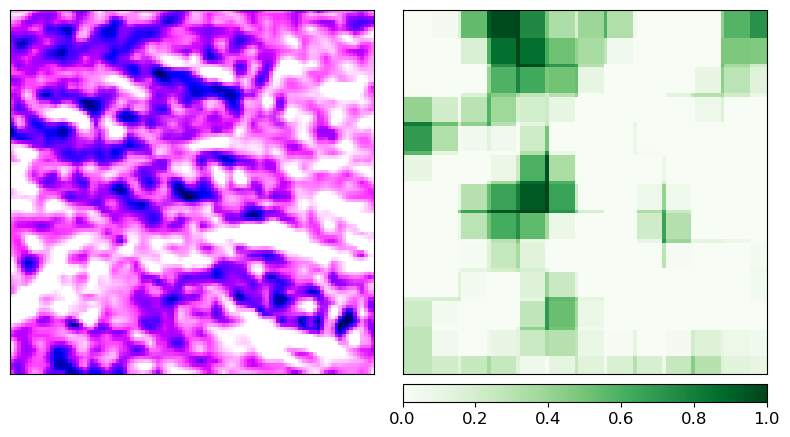

(3, 100, 100)
(3, 100, 100)


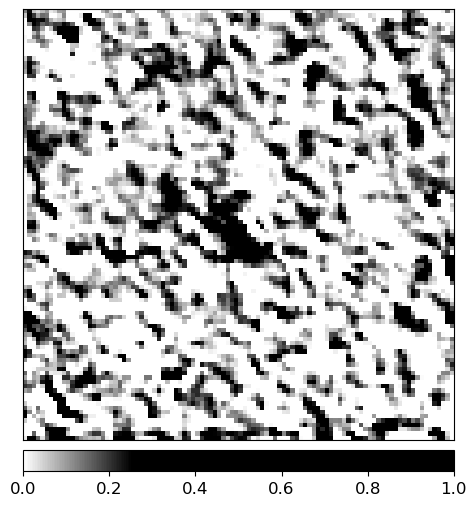

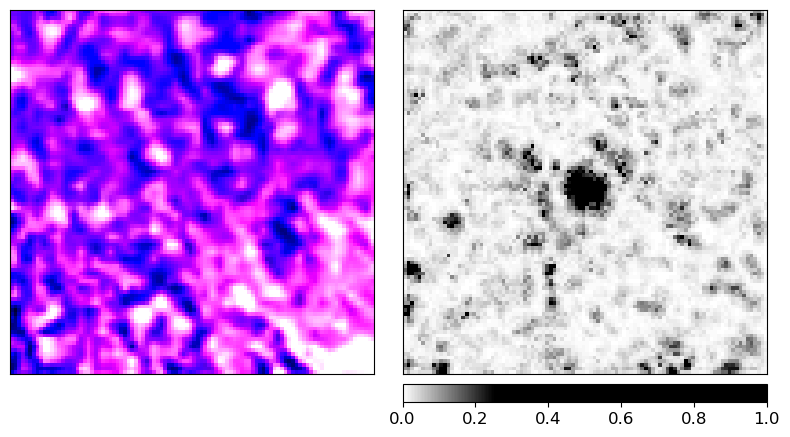

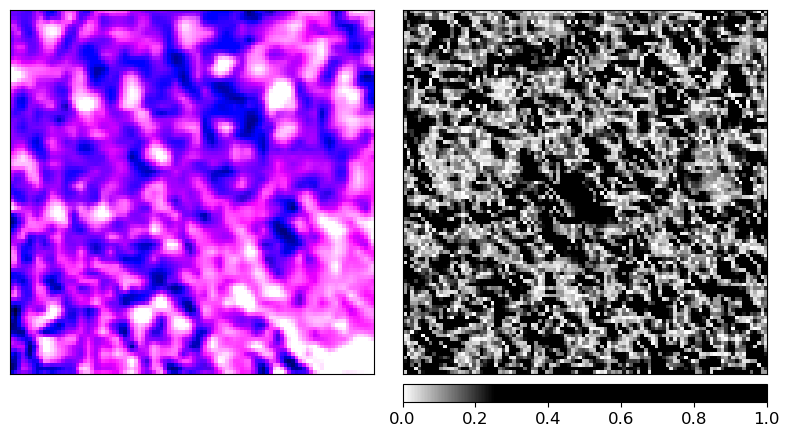

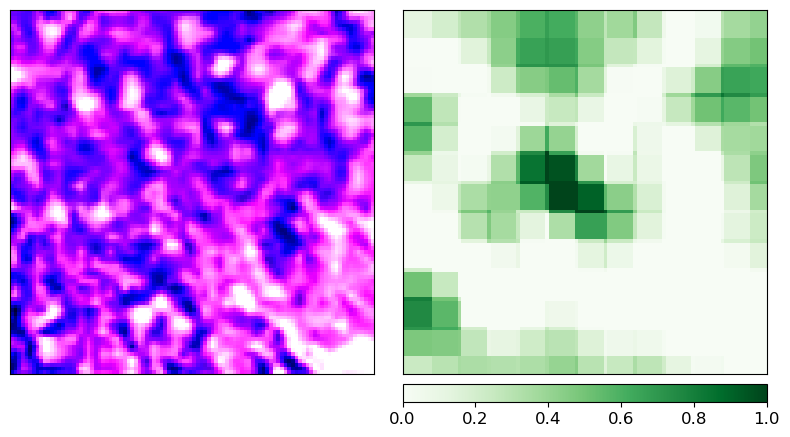

(3, 100, 100)
(3, 100, 100)


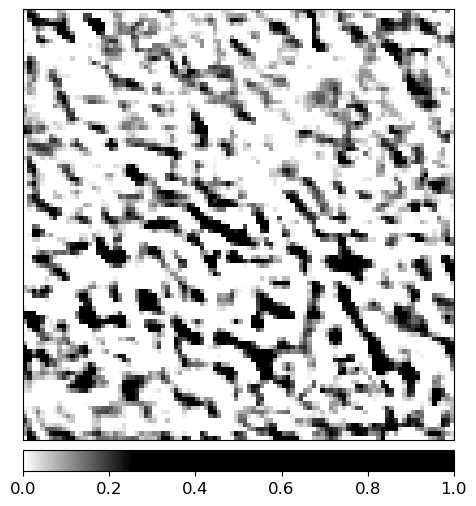

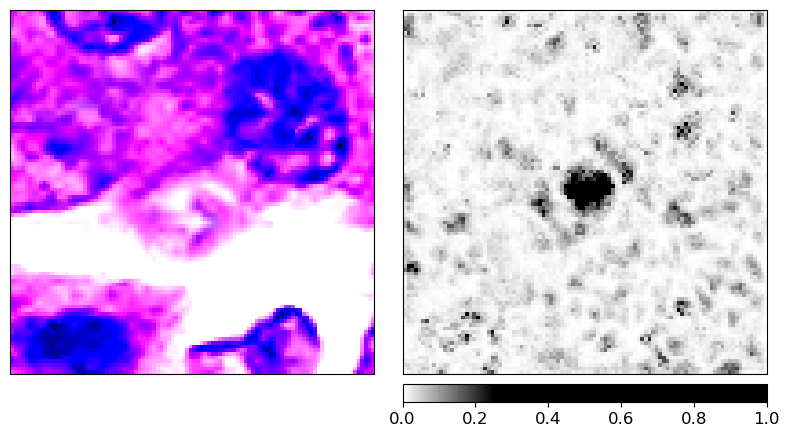

KeyboardInterrupt: 

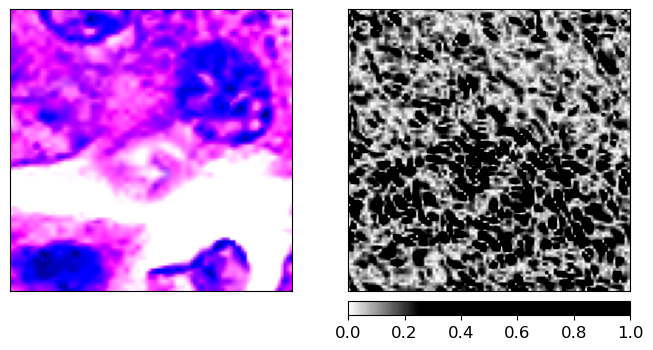

In [14]:
#Building the captum graphs on the test set
test_loader = DataLoader(test_set, batch_size=1, shuffle=False)
pred_scores = []
pred_label_in = []
with torch.no_grad():
    for inputs, labels in test_loader:
        inputs, labels = inputs.to(device), labels.to(device)
        output = model(inputs)
        output = F.softmax(output, dim=1)
        prediction_score, pred_label_idx = torch.max(model(inputs), dim=1)
        pred_scores.append(prediction_score)
        pred_label_in.append(pred_label_idx)
        integrated_gradients = IntegratedGradients(model)
        attributions_ig = integrated_gradients.attribute(inputs, target=pred_label_idx, n_steps=2)
        default_cmap = LinearSegmentedColormap.from_list('custom blue', 
                                                 [(0, '#ffffff'),
                                                  (0.25, '#000000'),
                                                  (1, '#000000')], N=256)
        
        print(attributions_ig.squeeze().cpu().detach().numpy().shape)
        print(inputs.squeeze().cpu().detach().numpy().shape)
        
        _ = viz.visualize_image_attr(np.transpose(attributions_ig.squeeze().cpu().detach().numpy(), (1,2,0)),
                             np.transpose(inputs.squeeze().cpu().detach().numpy(), (1,2,0)),
                             method='heat_map',
                             cmap=default_cmap,
                             show_colorbar=True,
                             sign='positive',
                             outlier_perc=1)
        
        noise_tunnel = NoiseTunnel(integrated_gradients)

        attributions_ig_nt = noise_tunnel.attribute(inputs, nt_samples=10, nt_type='smoothgrad_sq', target=pred_label_idx)
        _ = viz.visualize_image_attr_multiple(np.transpose(attributions_ig_nt.squeeze().cpu().detach().numpy(), (1,2,0)),
                                      np.transpose(inputs.squeeze().cpu().detach().numpy(), (1,2,0)),
                                      ["original_image", "heat_map"],
                                      ["all", "positive"],
                                      cmap=default_cmap,
                                      show_colorbar=True)
        torch.manual_seed(0)
        np.random.seed(0)

        gradient_shap = GradientShap(model)

        # Defining baseline distribution of images
        rand_img_dist = torch.cat([inputs * 0, inputs * 1])

        attributions_gs = gradient_shap.attribute(inputs,
                                          n_samples=50,
                                          stdevs=0.0001,
                                          baselines=rand_img_dist,
                                          target=pred_label_idx)
        _ = viz.visualize_image_attr_multiple(np.transpose(attributions_gs.squeeze().cpu().detach().numpy(), (1,2,0)),
                                      np.transpose(inputs.squeeze().cpu().detach().numpy(), (1,2,0)),
                                      ["original_image", "heat_map"],
                                      ["all", "absolute_value"],
                                      cmap=default_cmap,
                                      show_colorbar=True)
        occlusion = Occlusion(model)

        attributions_occ = occlusion.attribute(inputs,
                                       strides = (3, 8, 8),
                                       target=pred_label_idx,
                                       sliding_window_shapes=(3,15, 15),
                                       baselines=0)
        _ = viz.visualize_image_attr_multiple(np.transpose(attributions_occ.squeeze().cpu().detach().numpy(), (1,2,0)),
                                      np.transpose(inputs.squeeze().cpu().detach().numpy(), (1,2,0)),
                                      ["original_image", "heat_map"],
                                      ["all", "positive"],
                                      show_colorbar=True,
                                      outlier_perc=2,
                                     )


Running the entire test set on captum crashed the code, hence I stopped the captum process after a few outputs

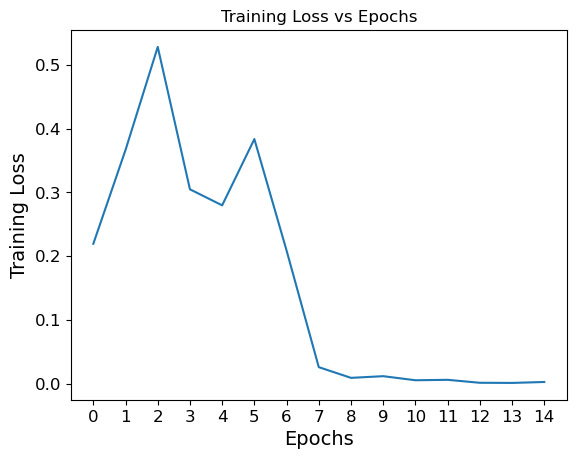

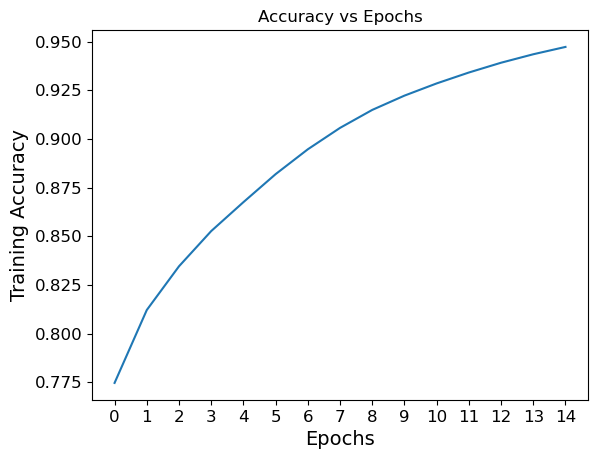

In [15]:
epochs = range(0, 15)

# Plotting the graph for trainign accuracy and loss
plt.plot(epochs, train_losses)
plt.title('Training Loss vs Epochs')
plt.xlabel('Epochs')
plt.ylabel('Training Loss')
plt.xticks(epochs)
plt.show()

plt.plot(epochs, train_acc)
plt.title('Accuracy vs Epochs')
plt.xlabel('Epochs')
plt.ylabel('Training Accuracy')
plt.xticks(epochs)
plt.show()

In [16]:
#converting the tensors back to labels
num = []
for i in range(len(predi)):
    for j in range(len(predi[i])):
        number = predi[i][j].item()
        num.append(number)

In [17]:
#inserting the labels inside the document of example.csv
doc = pd.read_csv("/kaggle/input/deep-learning-for-msc-2022-23/example.csv")
doc['Label'] = num

In [18]:
doc.head

<bound method NDFrame.head of        Filename  Label
0     10001.png      3
1     10002.png      3
2     10003.png      2
3     10004.png      3
4     10005.png      3
...         ...    ...
5036  15037.png      1
5037  15038.png      1
5038  15039.png      0
5039  15040.png      2
5040  15041.png      3

[5041 rows x 2 columns]>

In [19]:
#saving the csv for custom
doc.to_csv("Custom_without_tuning.csv", index=False)

# Pre Trained Model without Tuning

In [11]:
#defining the pretrained model and freezing the layers 
num_classes = 4
model = models.resnet18(pretrained = True)

for parameter in model.parameters():
    parameter.requires_grad = False

num_ftrs = model.fc.in_features
model.fc = nn.Linear(num_ftrs, num_classes) 

In [12]:
# Setting the criterion and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(model.parameters(), lr=0.001)

In [13]:
# splitting into training and validation for batch size 8
train_loader_1 = DataLoader(train_data, batch_size=16, shuffle=True)
val_loader = DataLoader(val_data, batch_size=16, shuffle=False)
test_loader = DataLoader(test_set, batch_size=16, shuffle=False)

In [14]:
# Training the model for 10 epochs
num_epochs = 10
model.to(device)
model.train()
total = 0
correct = 0
train_acc = []
train_losses = []

for epoch in range(num_epochs):
    for inputs, labels in train_loader_1:
        inputs, labels = inputs.to(device), labels.to(device)
        

        optimizer.zero_grad()

        outputs = model(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()
    train_acc.append(correct / total)
        
    train_losses.append(loss.item())

    print('Epoch [{}/{}], Loss: {:.4f}'.format(epoch+1, num_epochs, loss.item()))

Epoch [1/10], Loss: 0.6038
Epoch [2/10], Loss: 0.9246
Epoch [3/10], Loss: 0.2400
Epoch [4/10], Loss: 0.6876
Epoch [5/10], Loss: 0.7965
Epoch [6/10], Loss: 0.5719
Epoch [7/10], Loss: 0.4539
Epoch [8/10], Loss: 0.5182
Epoch [9/10], Loss: 0.6002
Epoch [10/10], Loss: 0.2890


In [17]:
predi = []
y_true = []
y_pred = []

# Evaluating the model on the validation set and building the confusion matrix
model.eval()
with torch.no_grad():
    correct = 0
    total = 0
    for inputs, labels in val_loader:
        inputs, labels = inputs.to(device), labels.to(device)

        outputs = model(inputs)
        _, predicted = torch.max(outputs.data, 1)
        predi.append(predicted)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()
        y_pred += predicted.cpu().numpy().tolist()
        y_true += labels.cpu().numpy().tolist()


    cm = confusion_matrix(y_true, y_pred)
    print(cm)

    print('Accuracy on the test set: {} '.format( correct / total))

[[ 68  62   2  24]
 [ 27 629  12  23]
 [  1   5 118  19]
 [ 11  43  29 439]]
Accuracy on the test set: 0.8293650793650794 


In [18]:
predi = []
y_true = []
y_pred = []

# Evaluating the model on the test set and building the confusion matrix
model.eval()
with torch.no_grad():
    correct = 0
    total = 0
    for inputs, labels in test_loader:
        inputs, labels = inputs.to(device), labels.to(device)

        outputs = model(inputs)
        _, predicted = torch.max(outputs.data, 1)
        predi.append(predicted)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()
        y_pred += predicted.cpu().numpy().tolist()
        y_true += labels.cpu().numpy().tolist()


    cm = confusion_matrix(y_true, y_pred)
    print(cm)

    print('Accuracy on the test set: {} '.format( correct / total))

[[ 306 2590  459 1686]
 [   0    0    0    0]
 [   0    0    0    0]
 [   0    0    0    0]]
Accuracy on the test set: 0.06070224161872644 


(3, 100, 100)
(3, 100, 100)


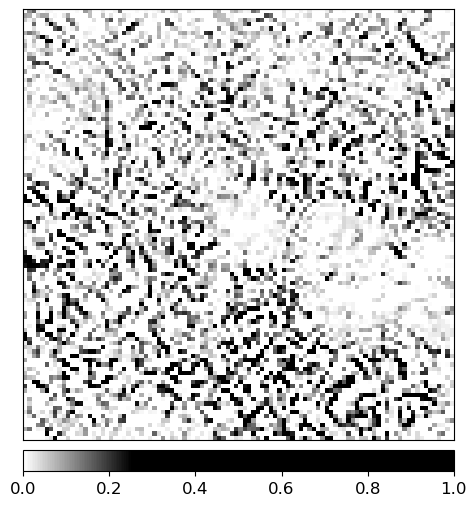

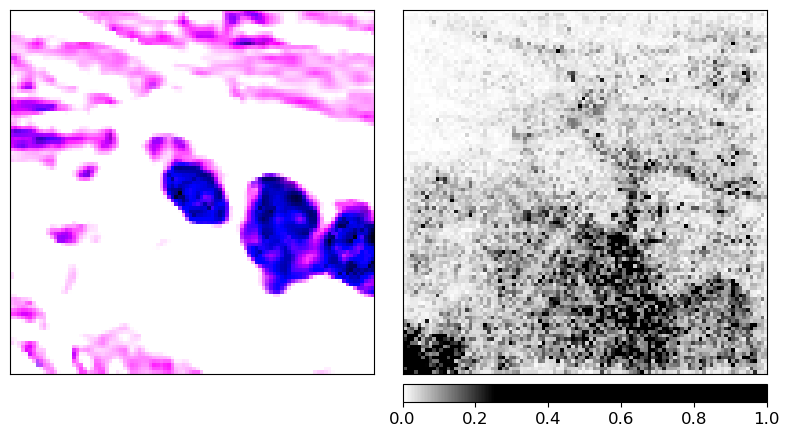

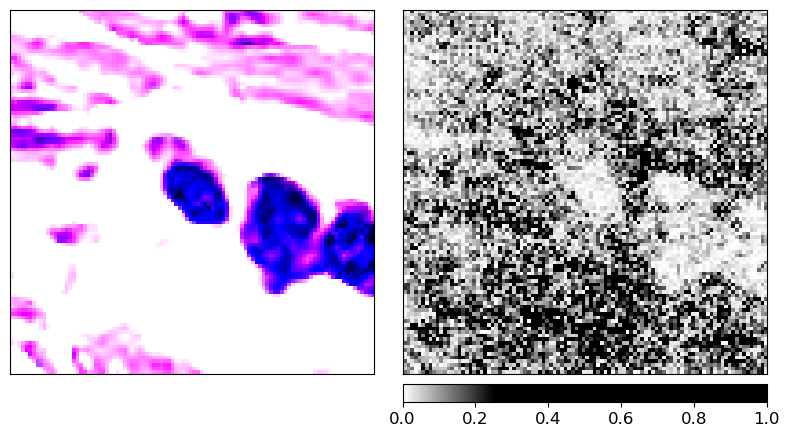

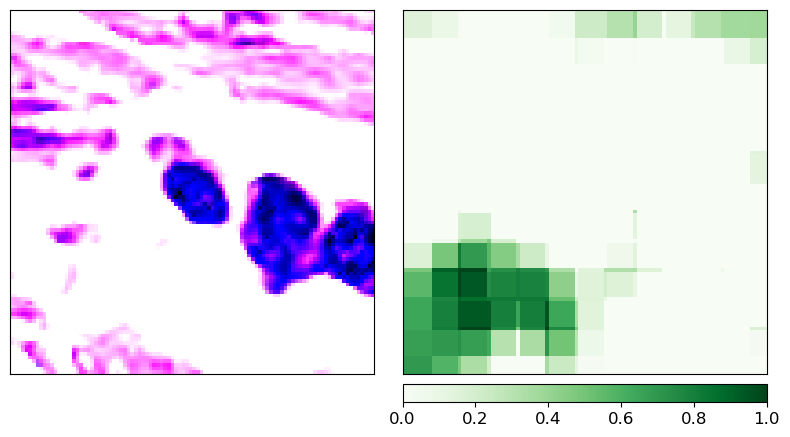

(3, 100, 100)
(3, 100, 100)


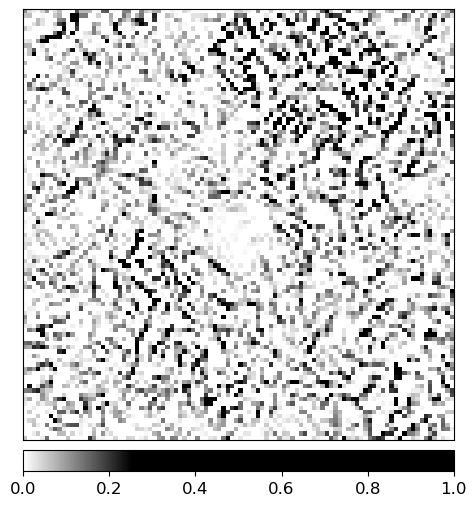

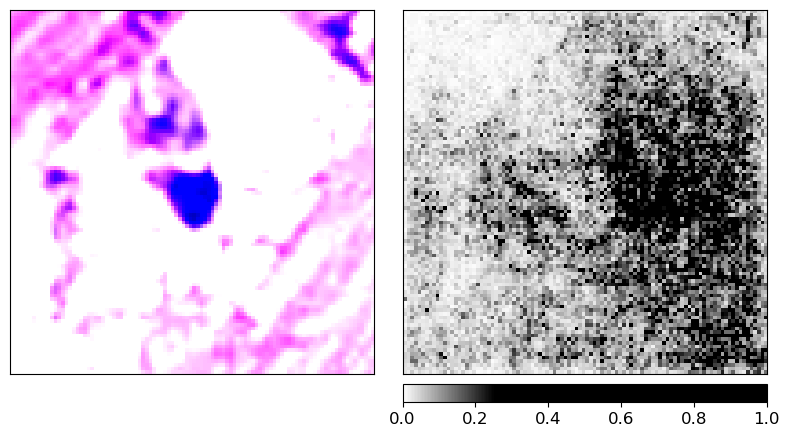

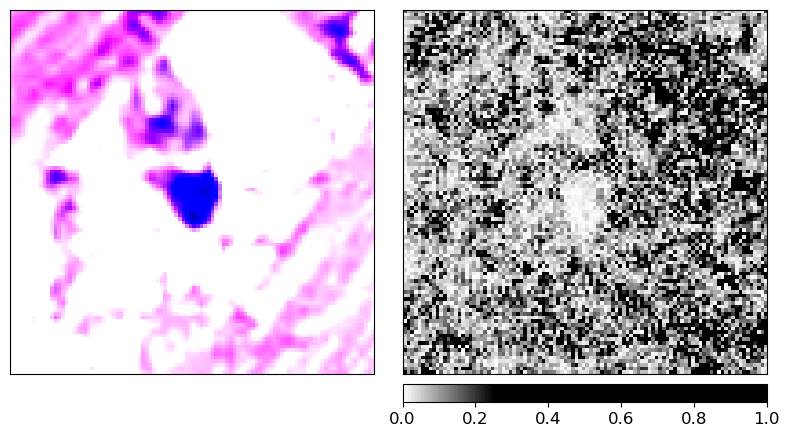

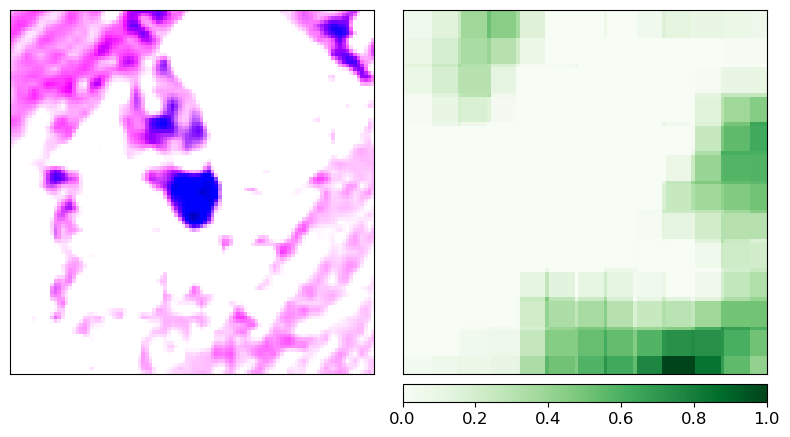

(3, 100, 100)
(3, 100, 100)


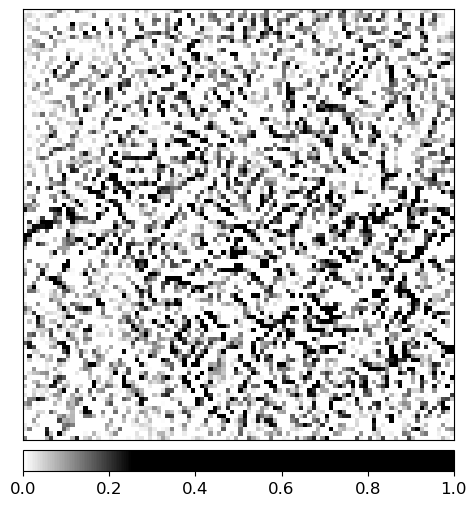

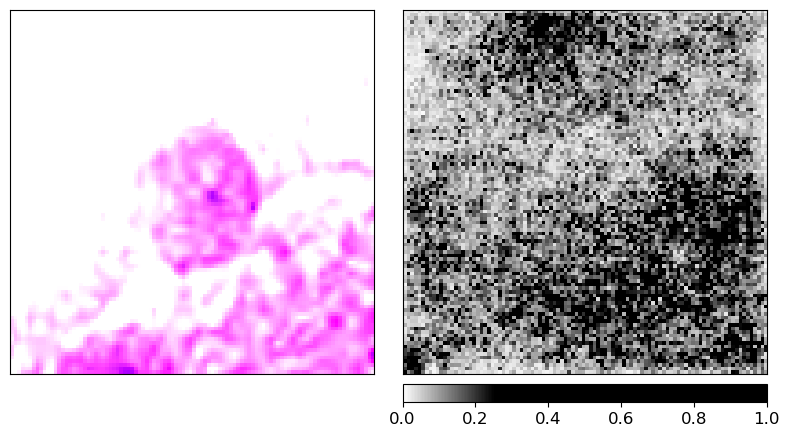

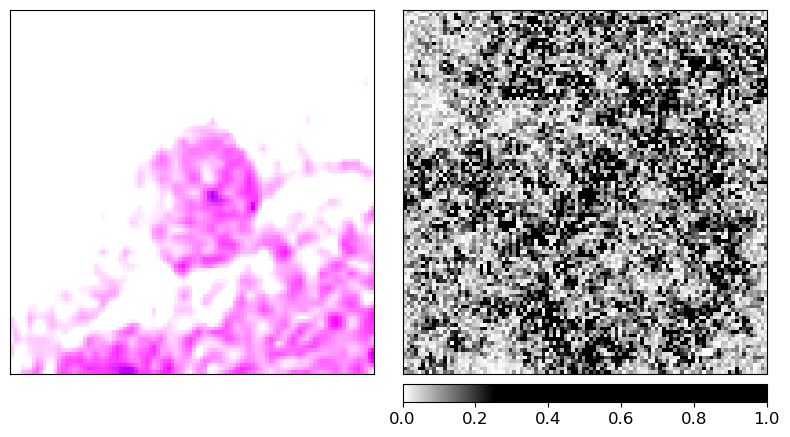

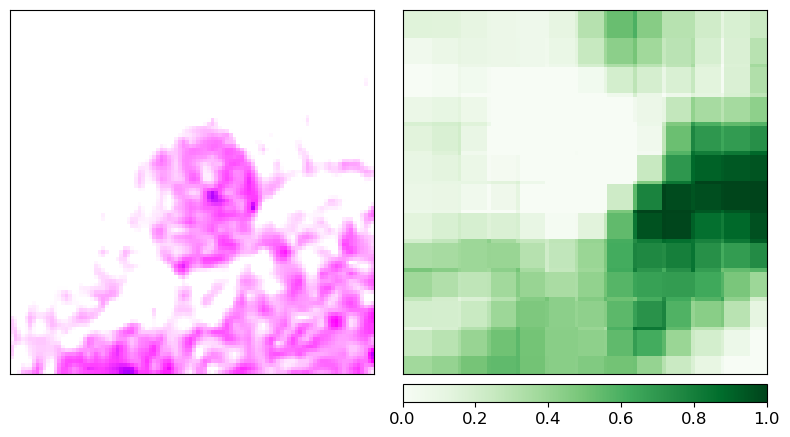

(3, 100, 100)
(3, 100, 100)


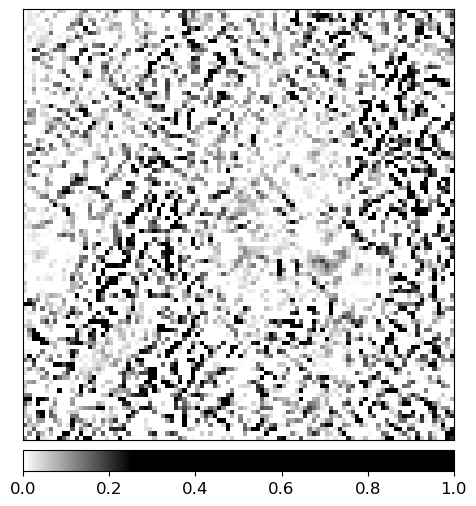

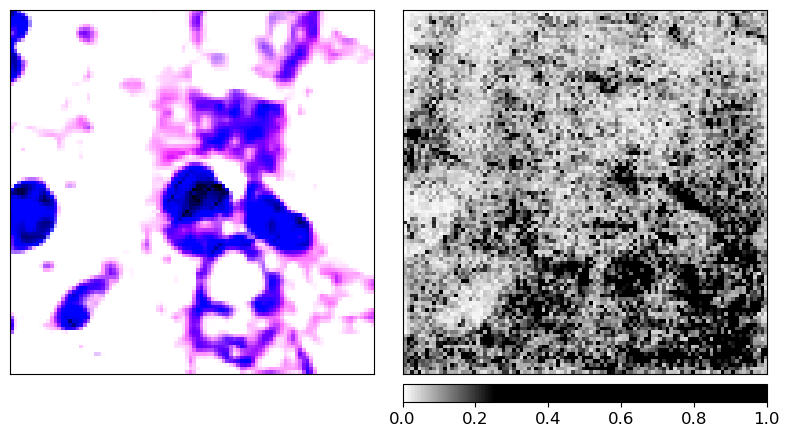

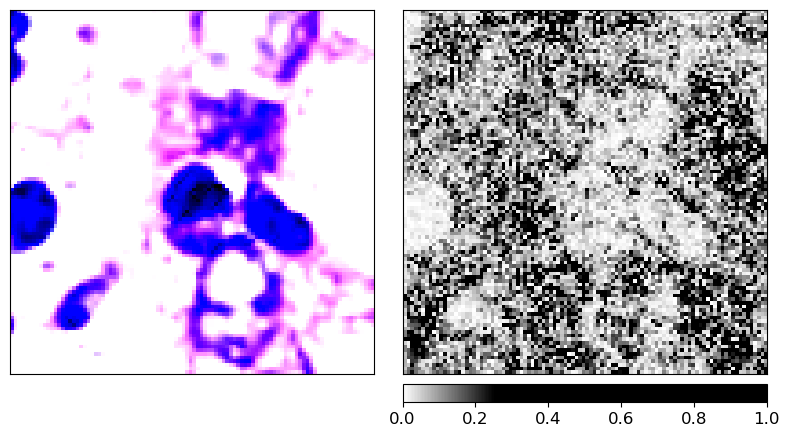

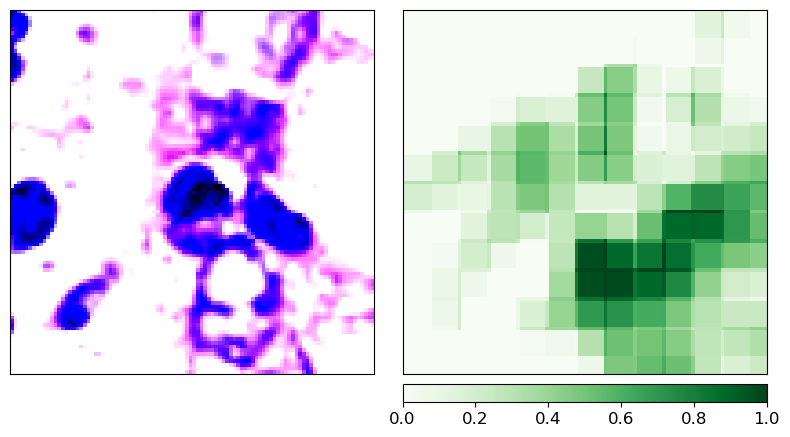

(3, 100, 100)
(3, 100, 100)


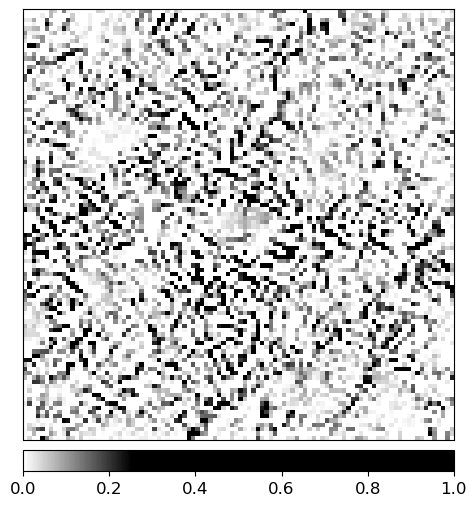

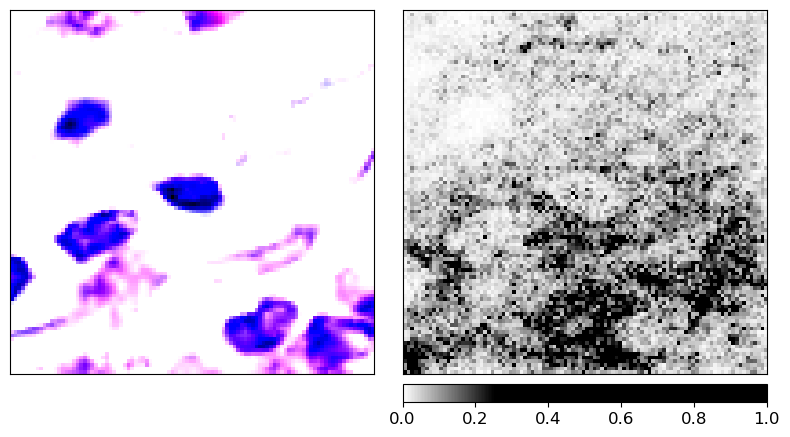

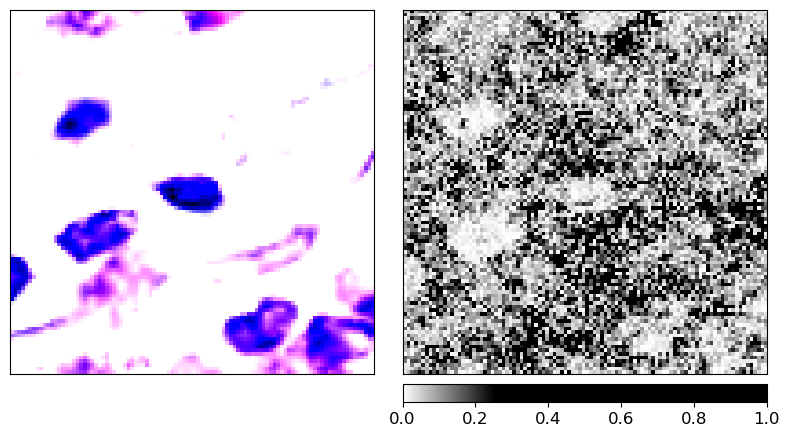

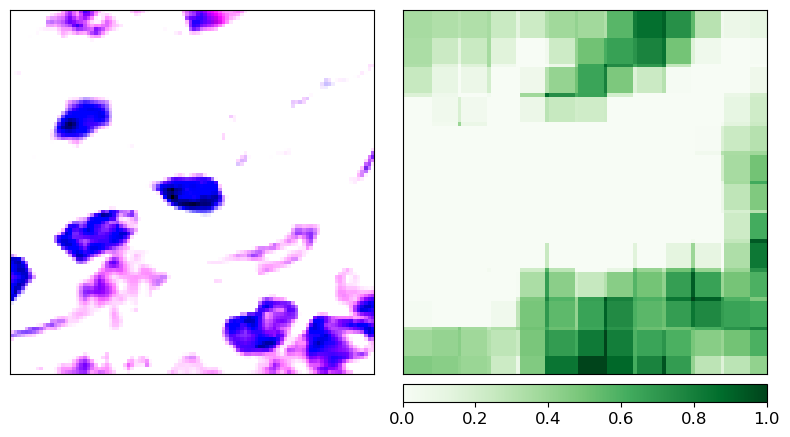

(3, 100, 100)
(3, 100, 100)


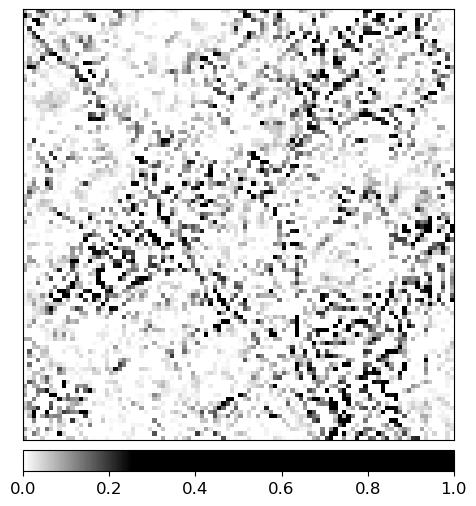

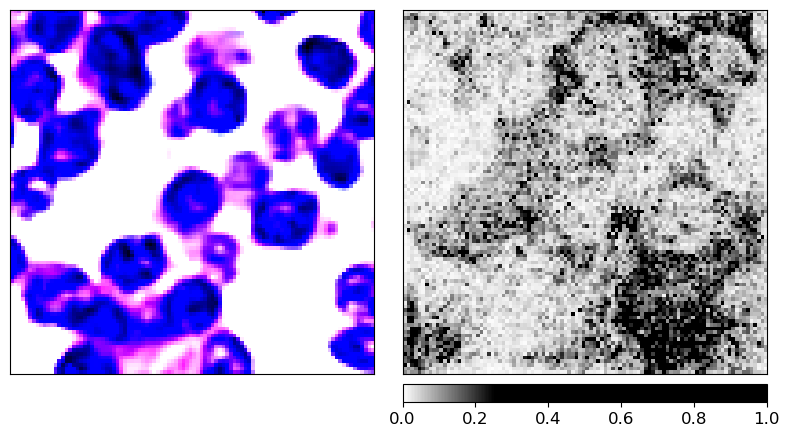

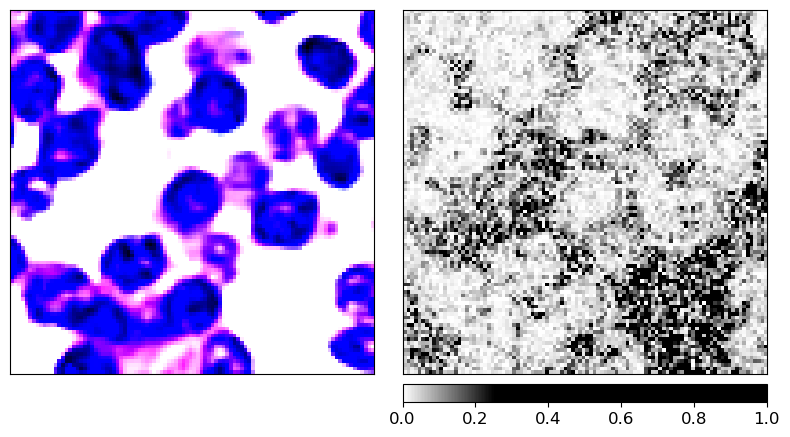

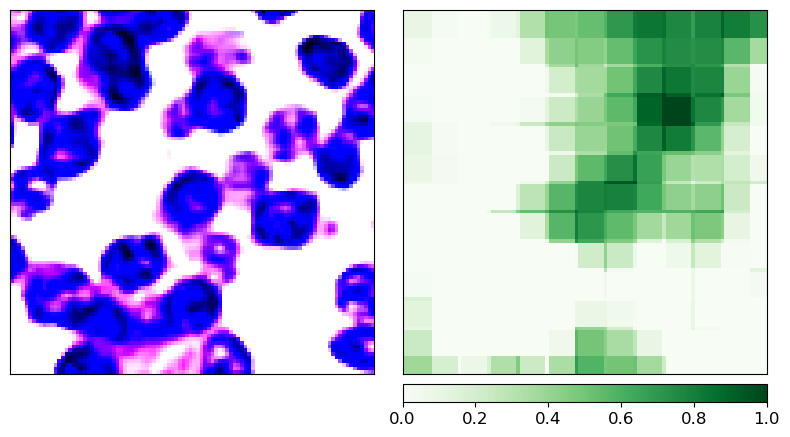

(3, 100, 100)
(3, 100, 100)


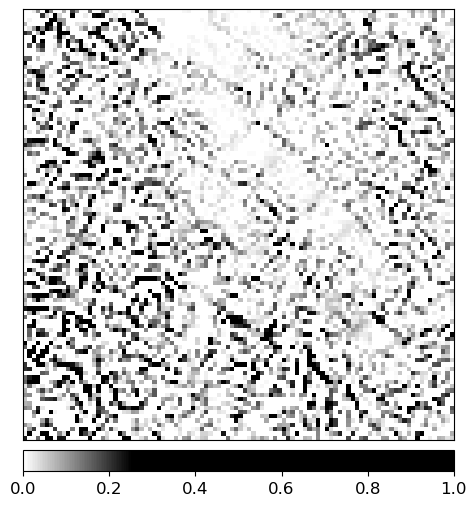

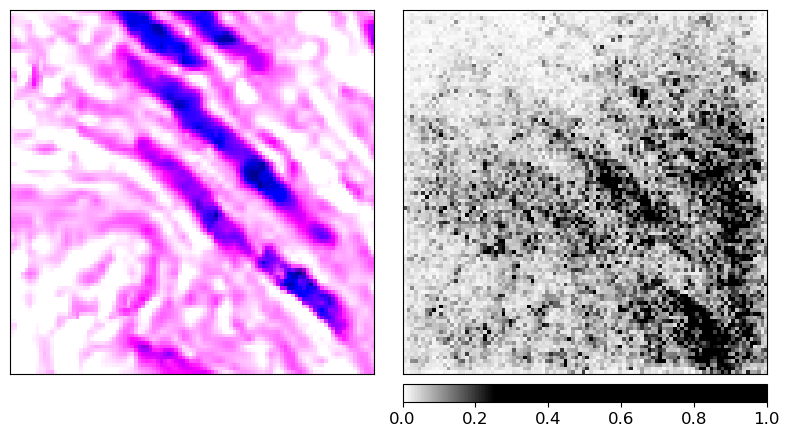

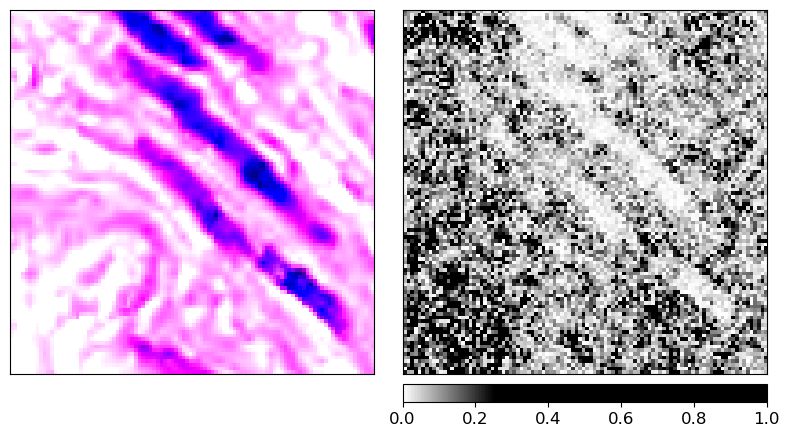

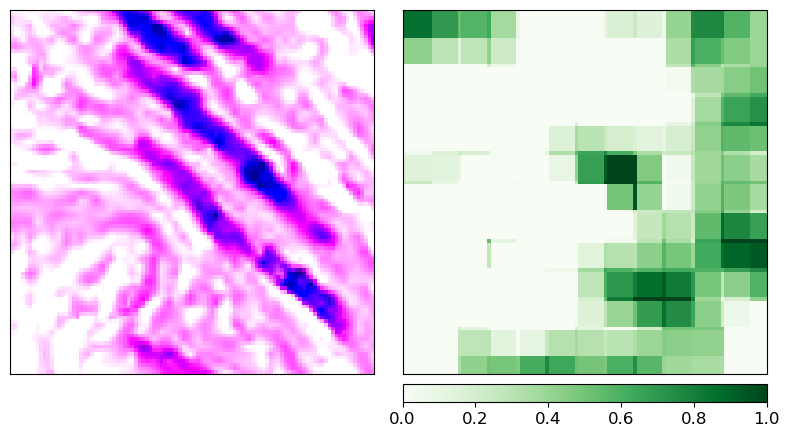

(3, 100, 100)
(3, 100, 100)


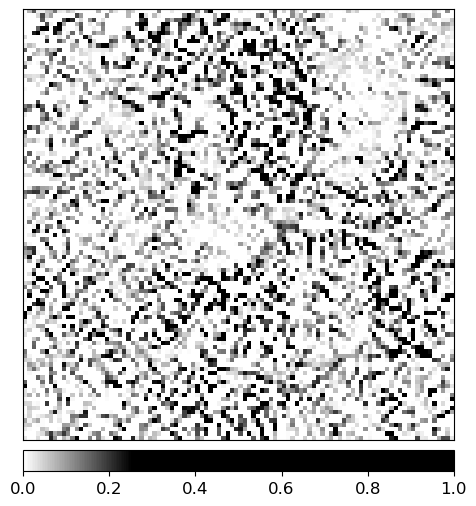

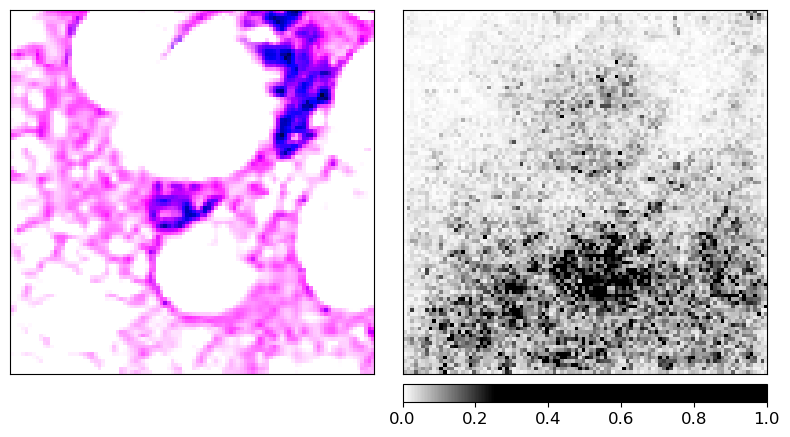

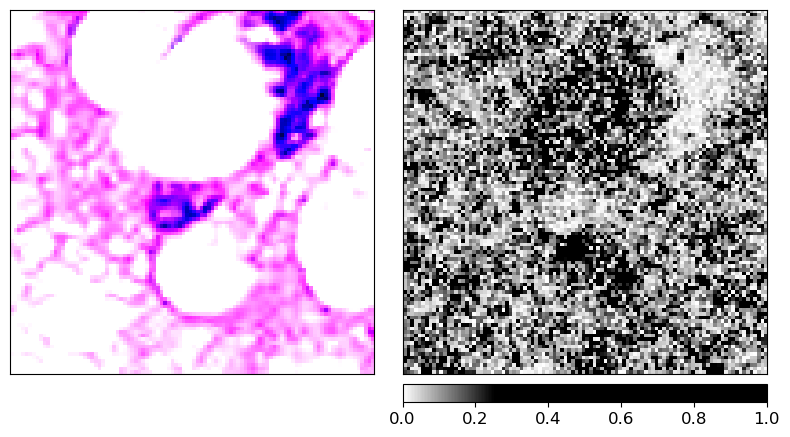

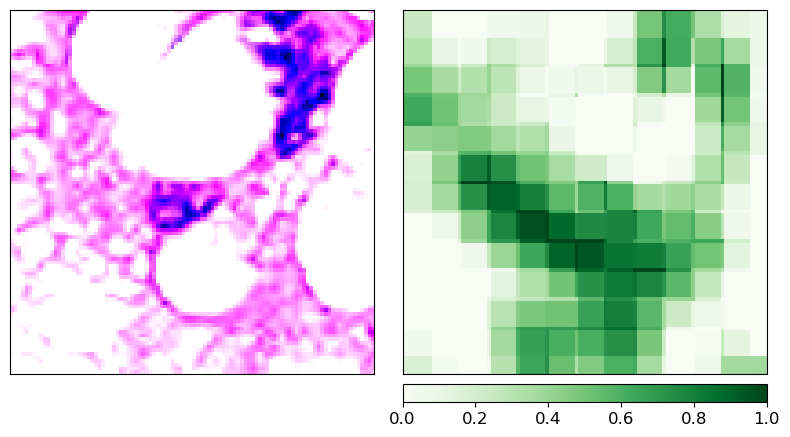

(3, 100, 100)
(3, 100, 100)


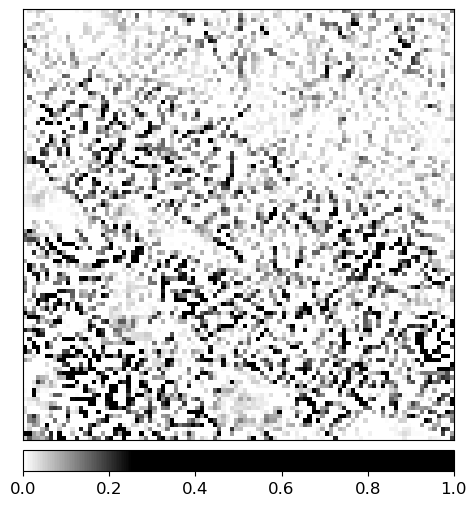

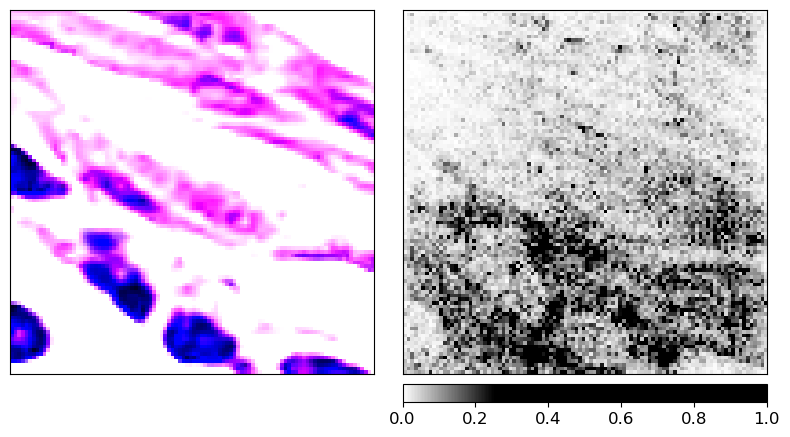

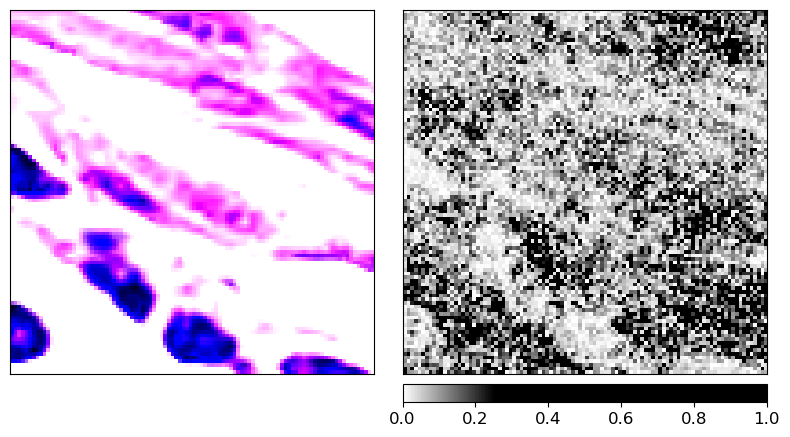

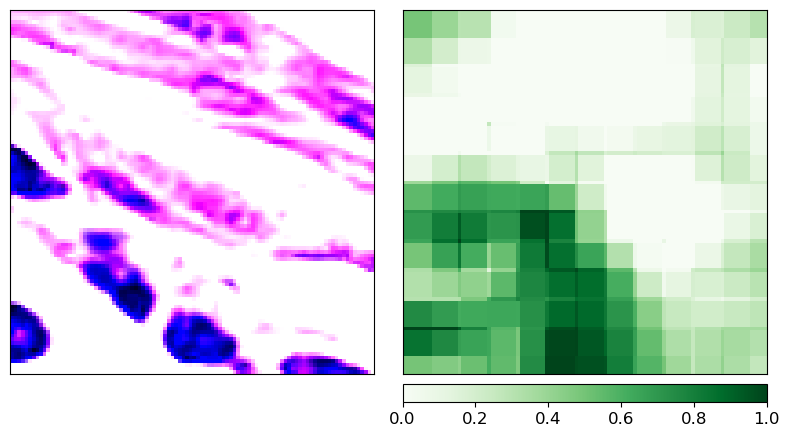

(3, 100, 100)
(3, 100, 100)


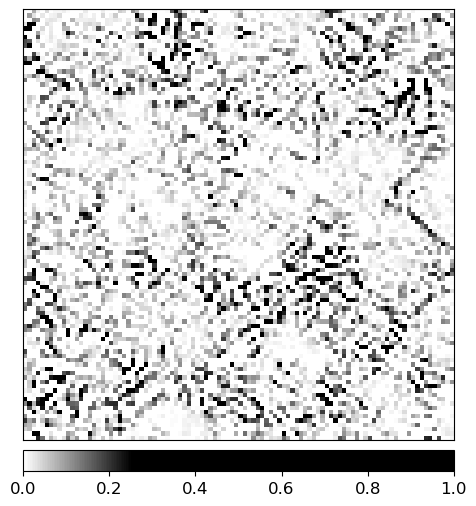

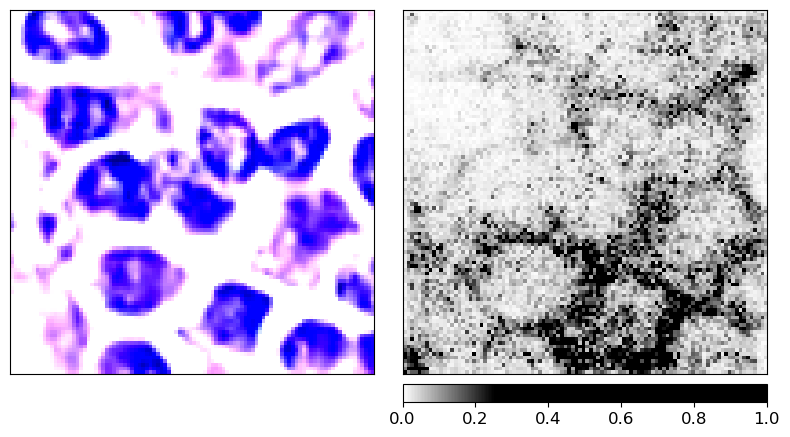

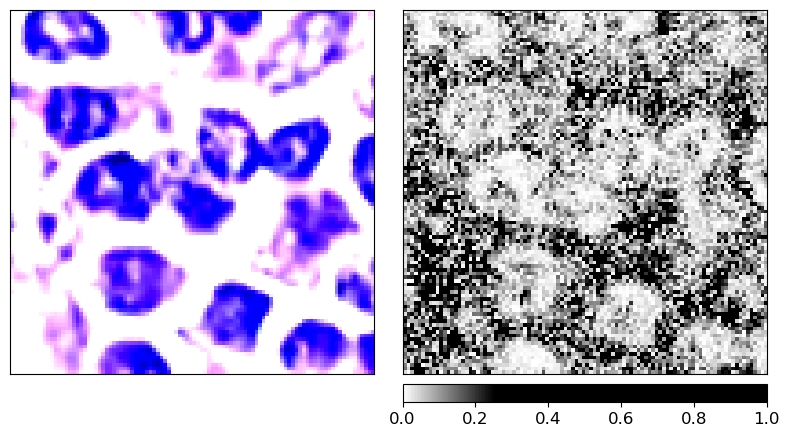

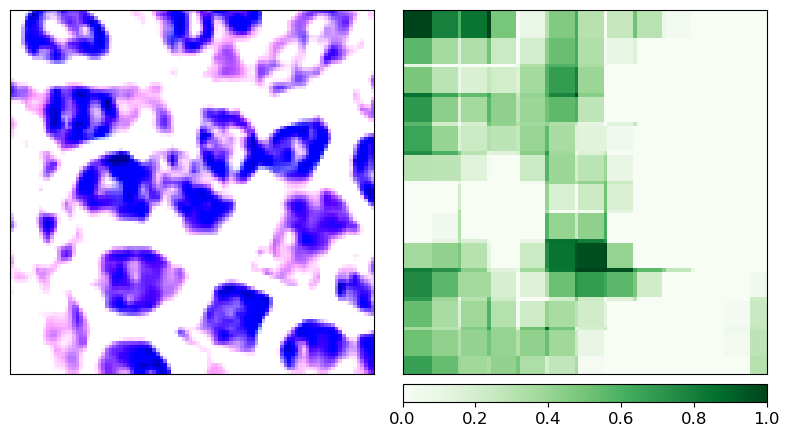

(3, 100, 100)
(3, 100, 100)


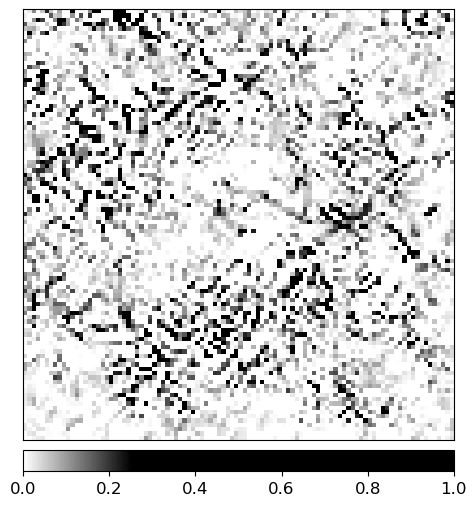

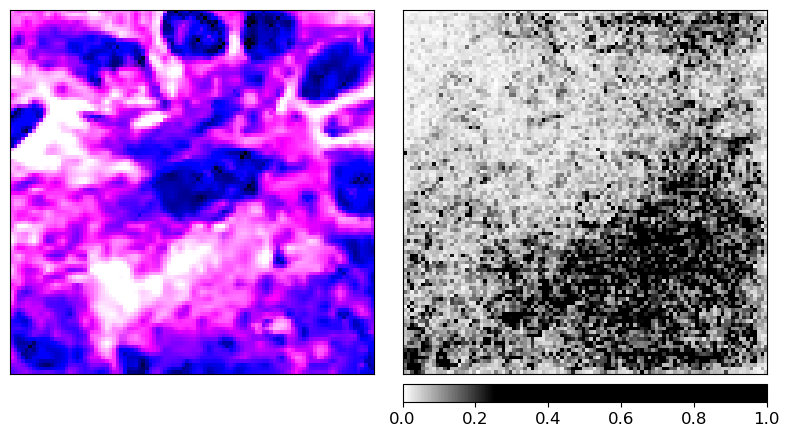

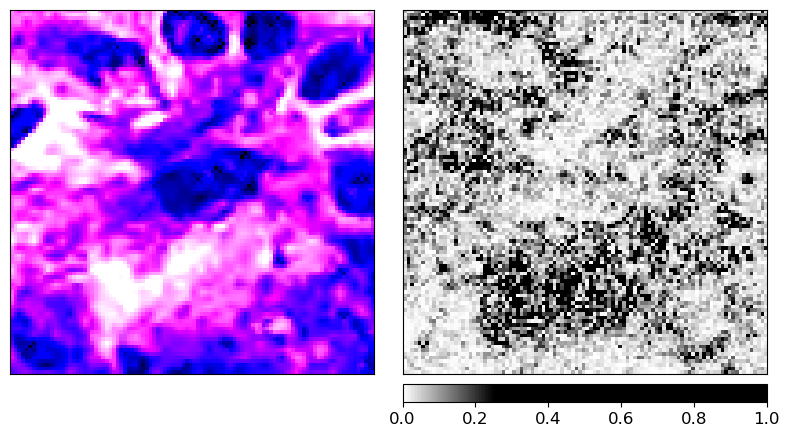

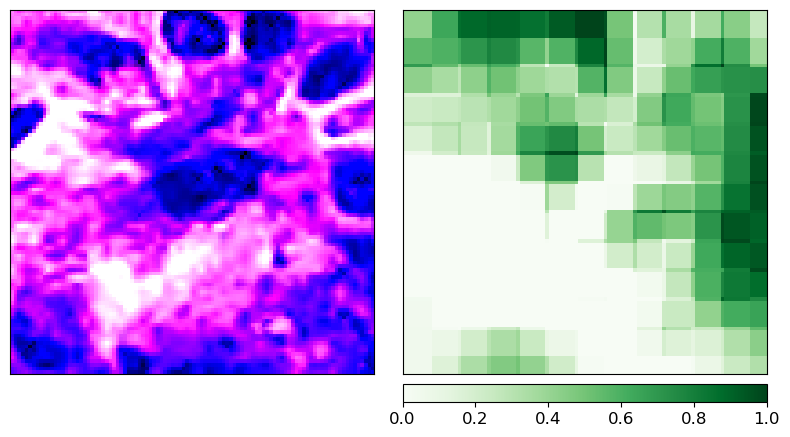

(3, 100, 100)
(3, 100, 100)


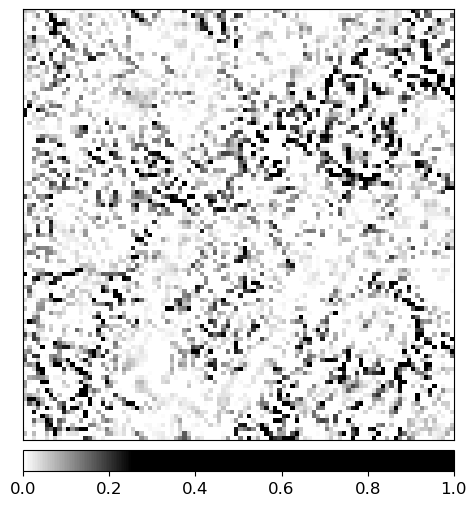

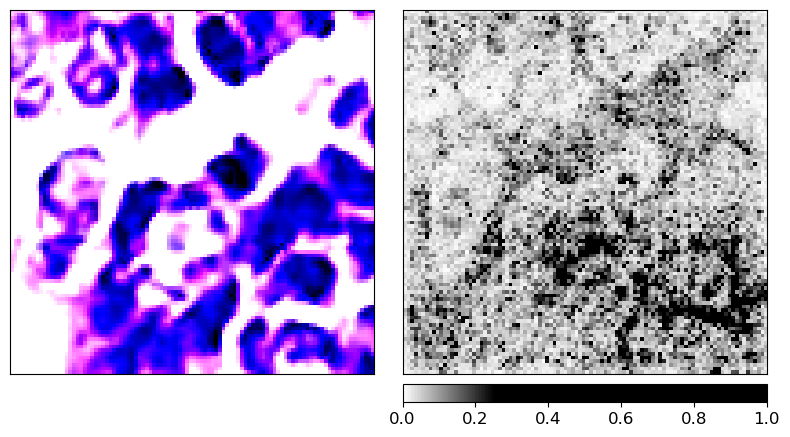

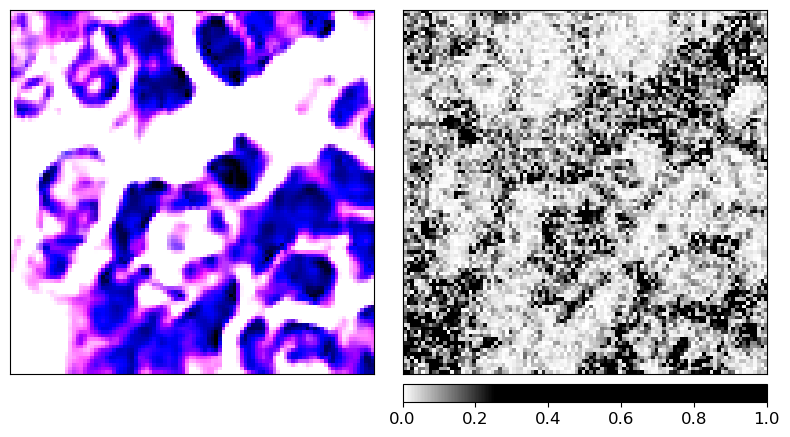

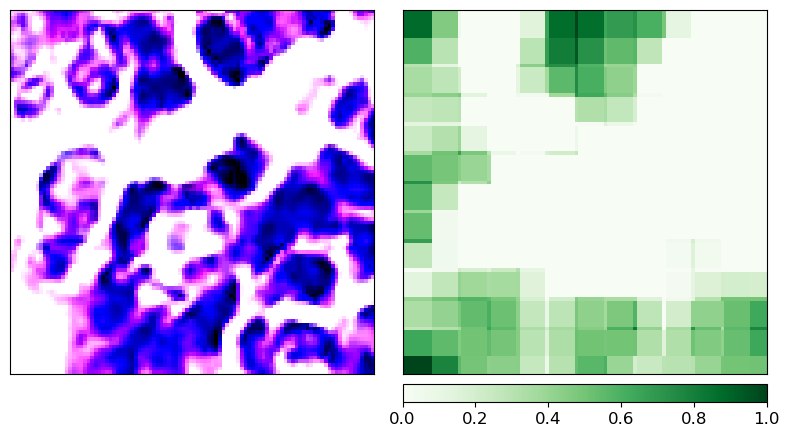

(3, 100, 100)
(3, 100, 100)


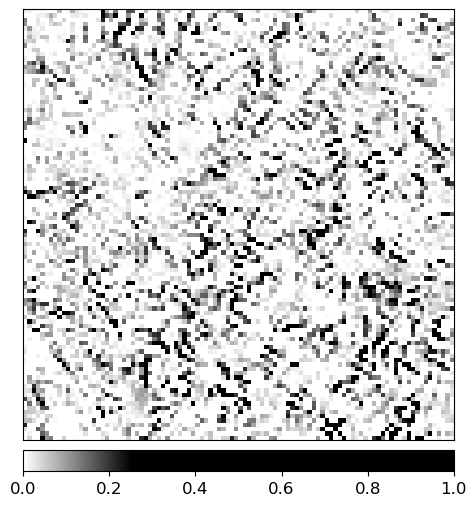

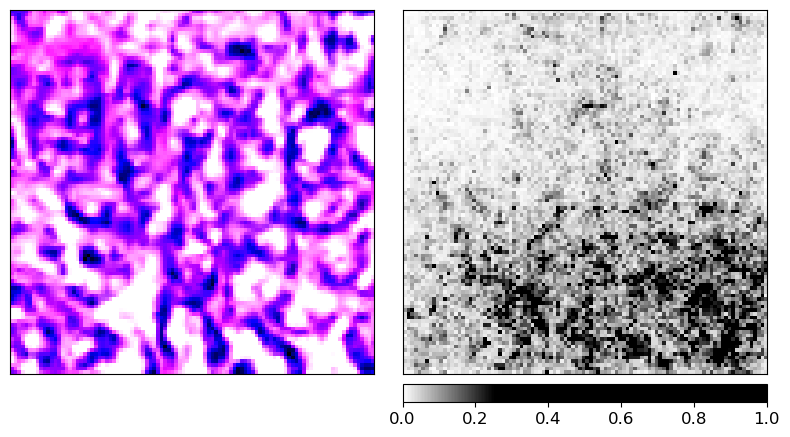

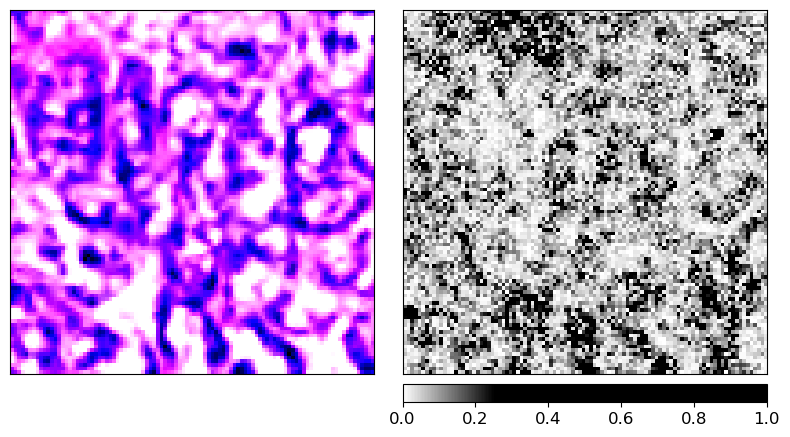

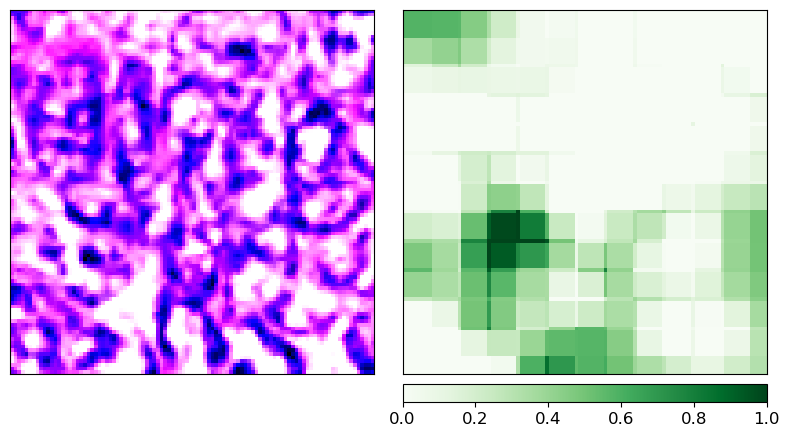

(3, 100, 100)
(3, 100, 100)


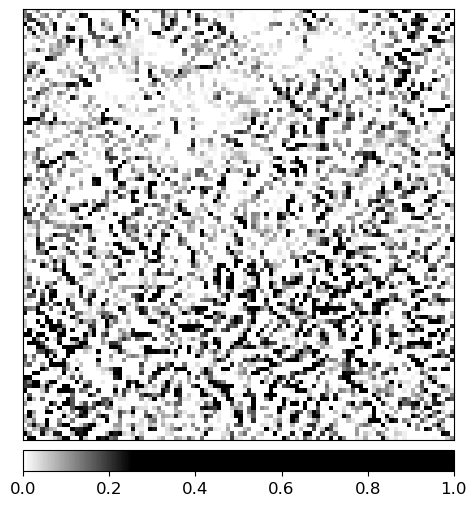

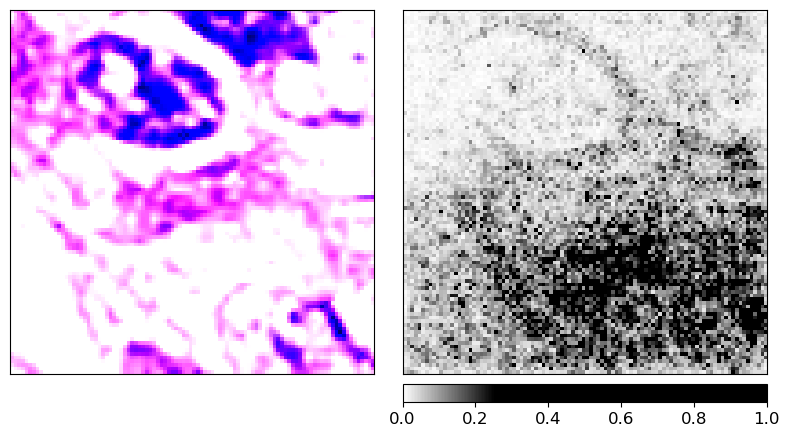

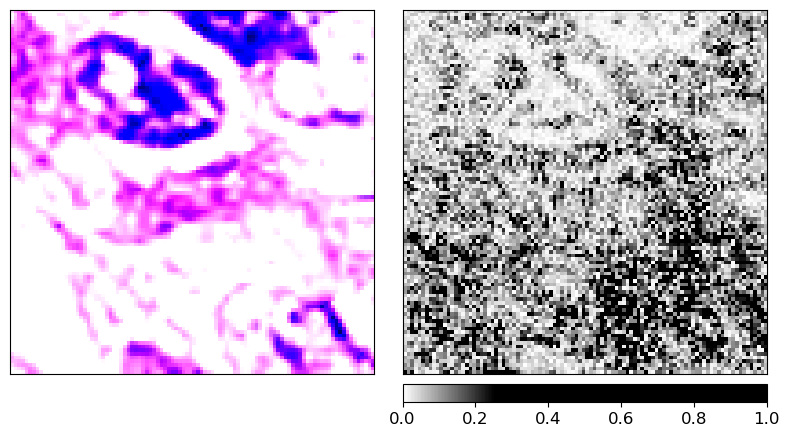

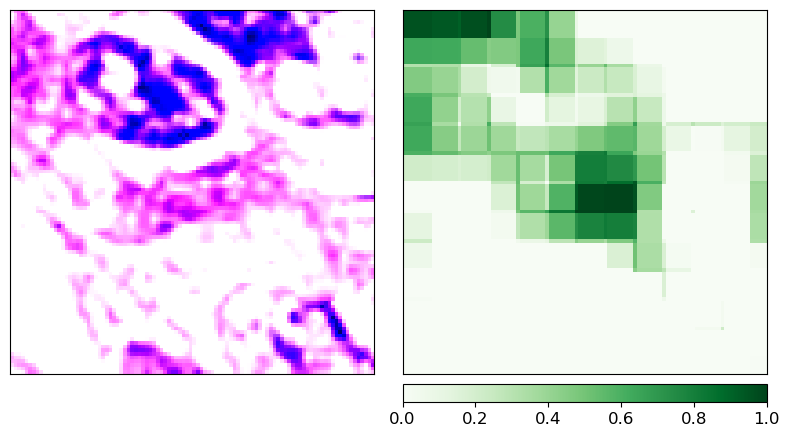

(3, 100, 100)
(3, 100, 100)


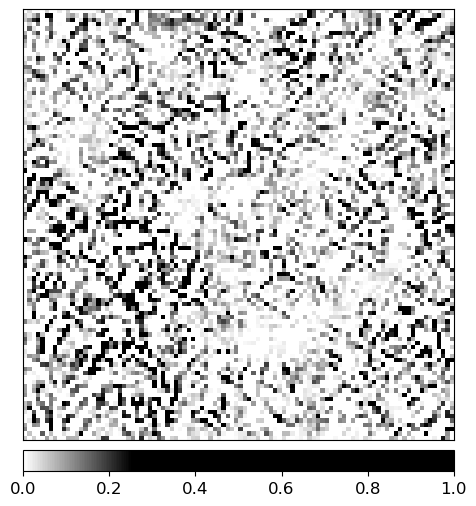

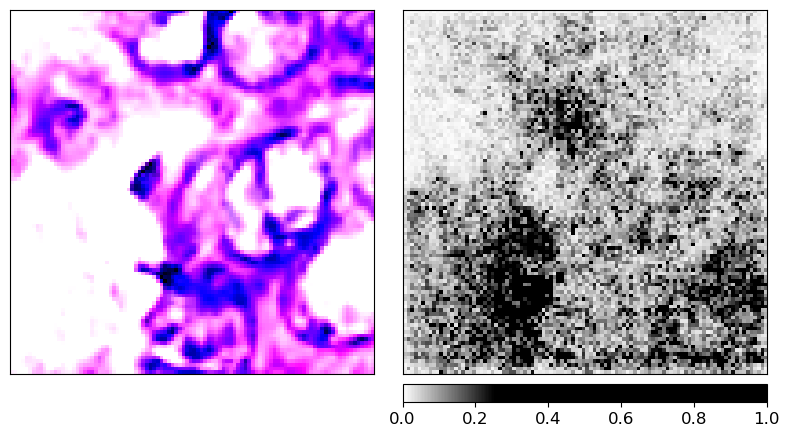

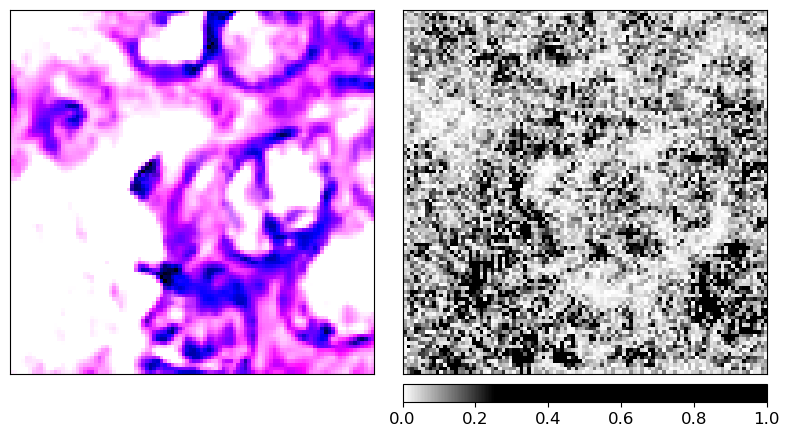

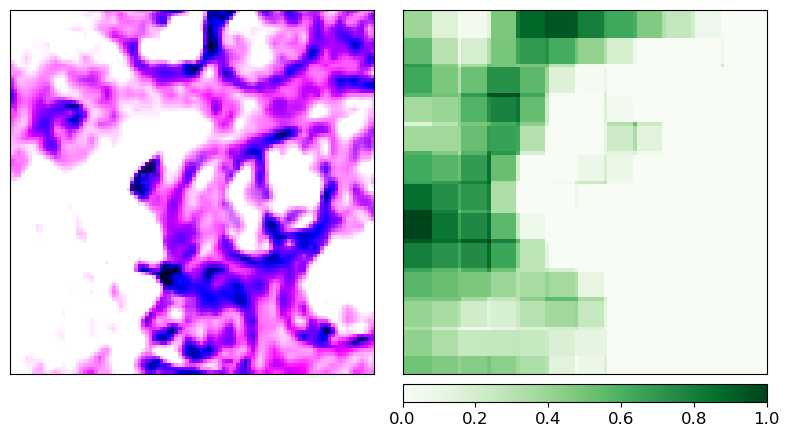

(3, 100, 100)
(3, 100, 100)


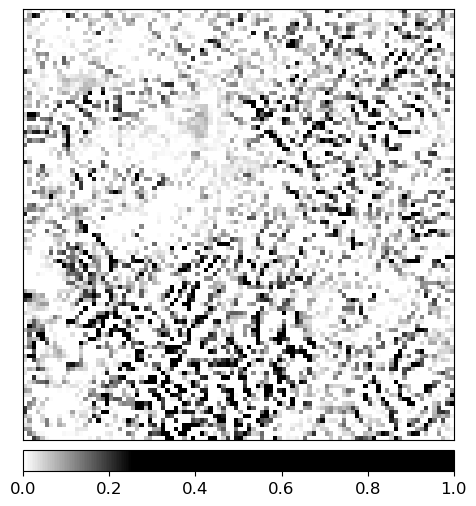

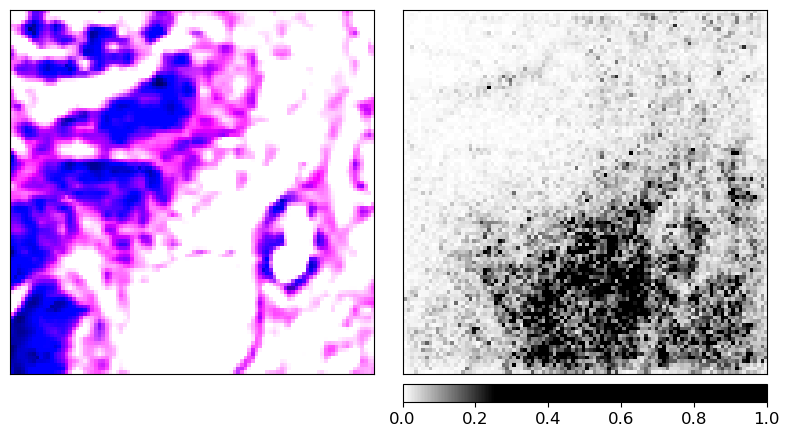

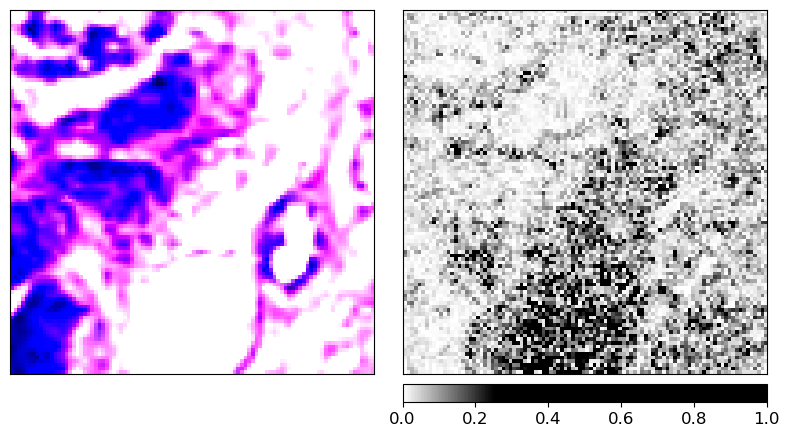

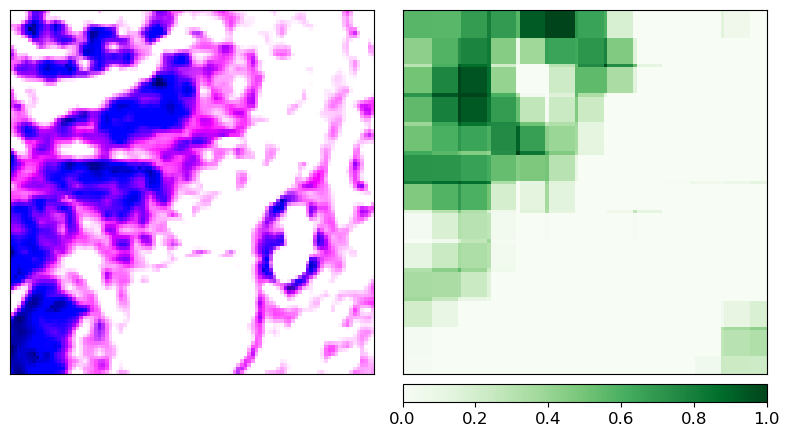

(3, 100, 100)
(3, 100, 100)


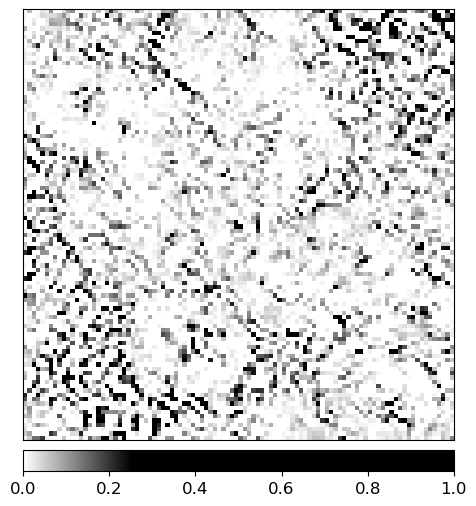

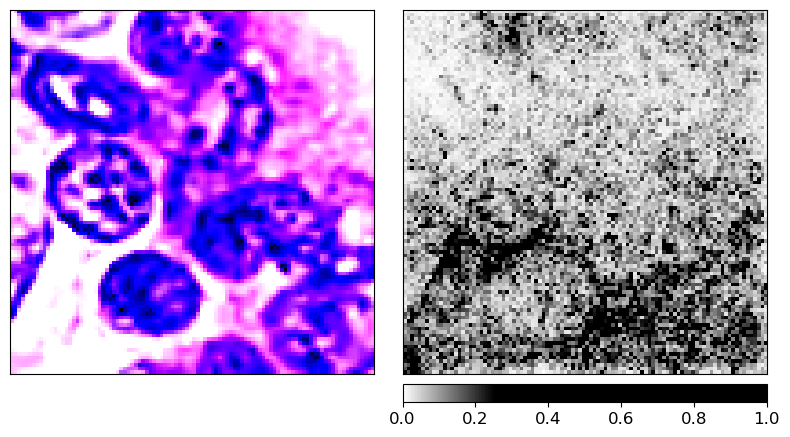

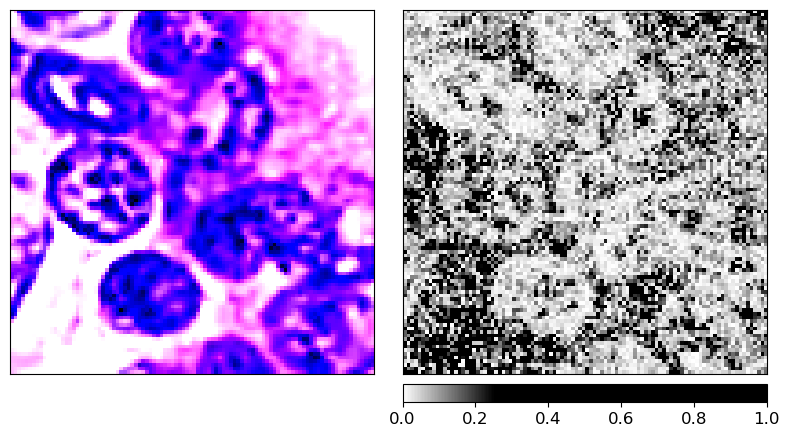

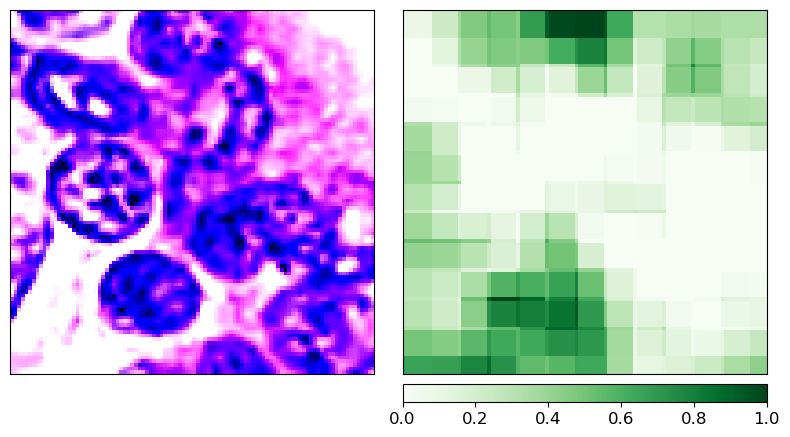

(3, 100, 100)
(3, 100, 100)


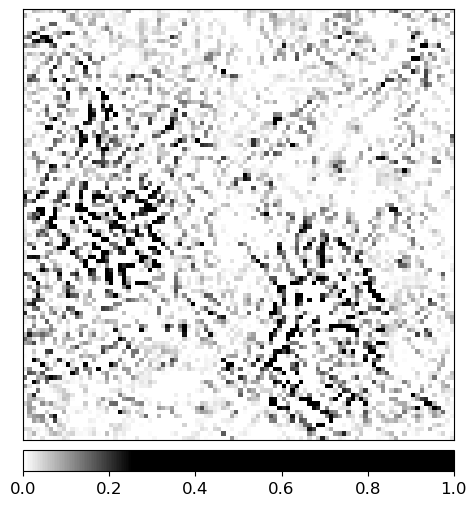

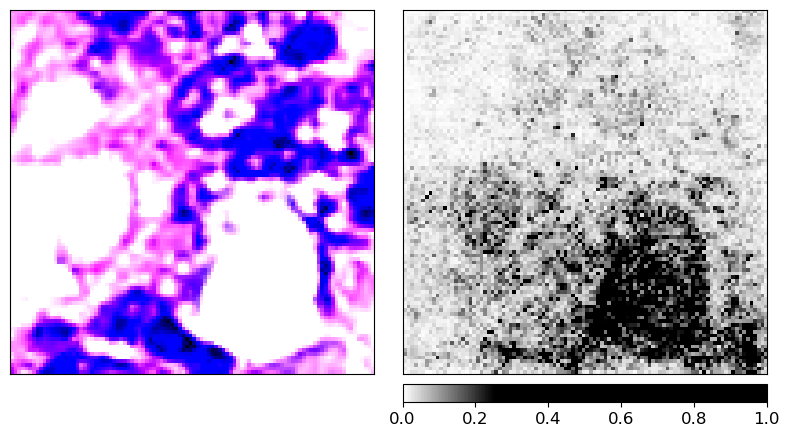

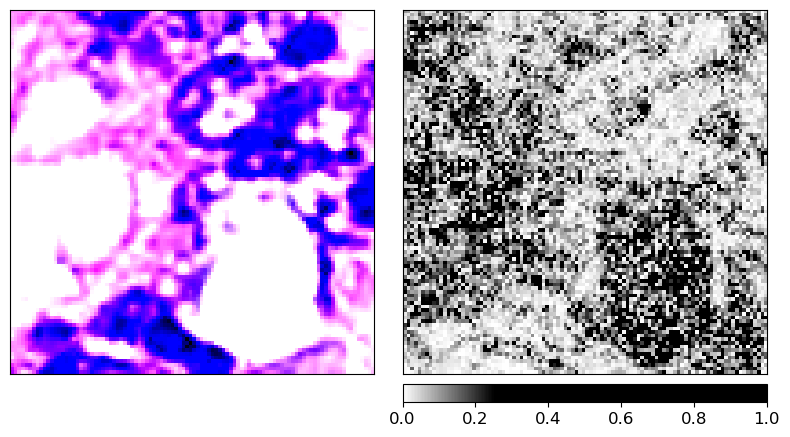

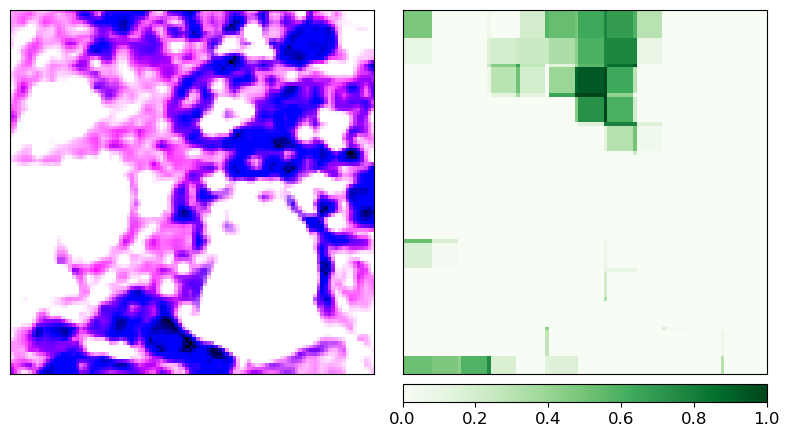

(3, 100, 100)
(3, 100, 100)


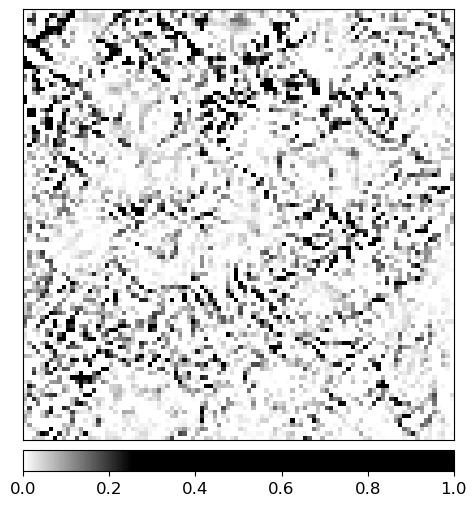

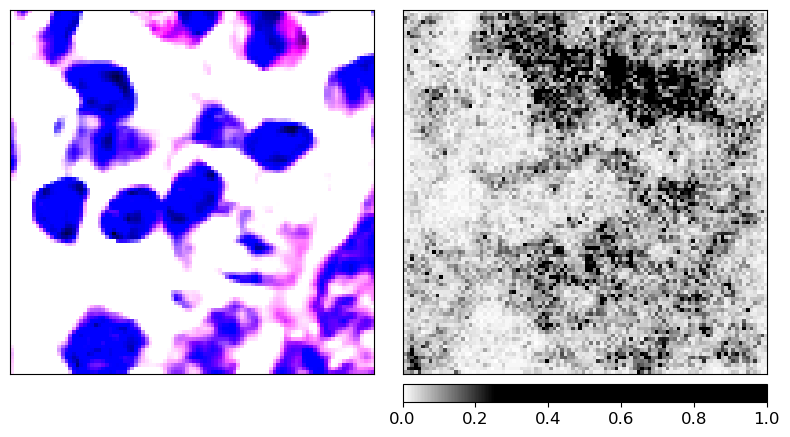

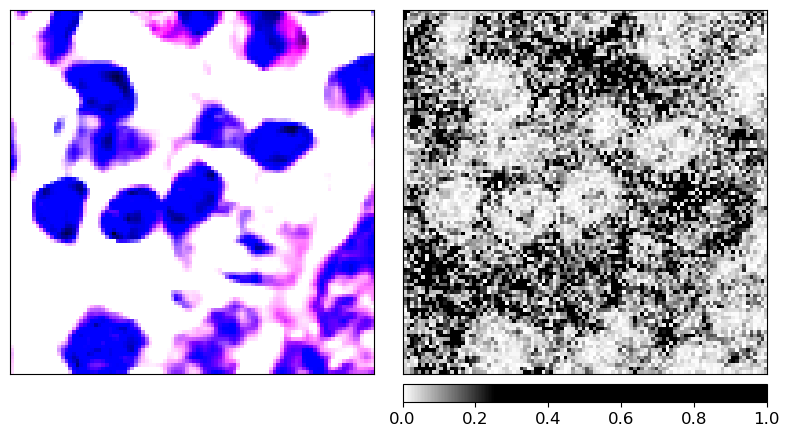

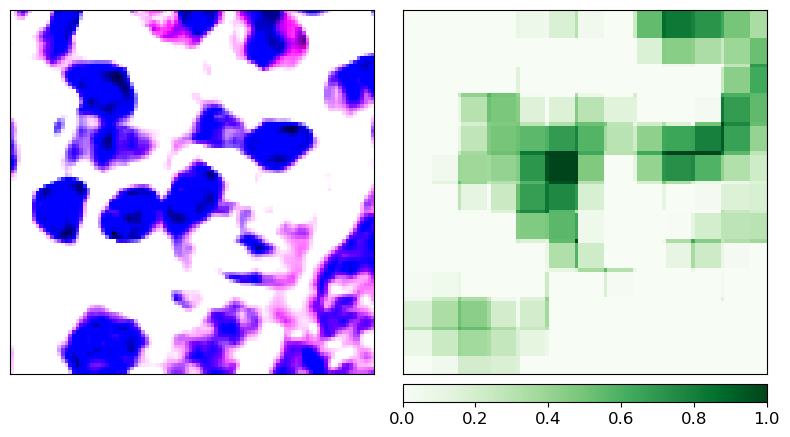

(3, 100, 100)
(3, 100, 100)


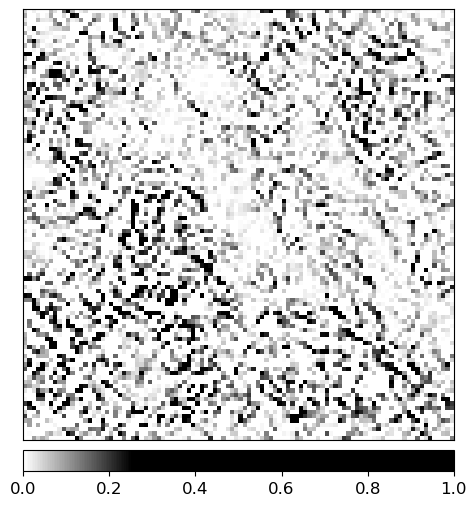

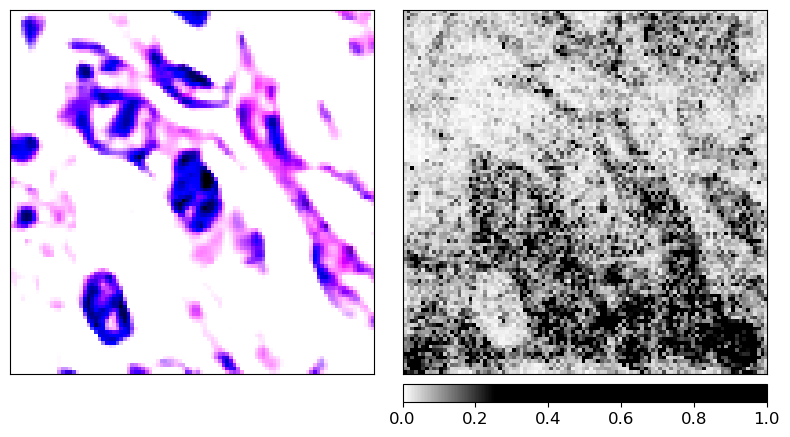

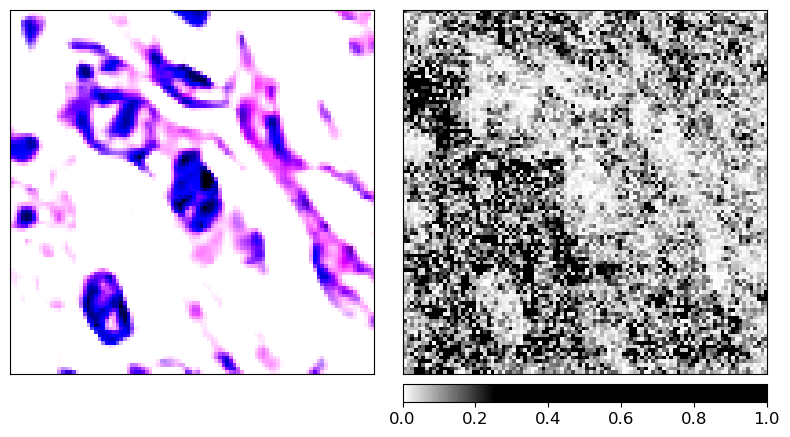

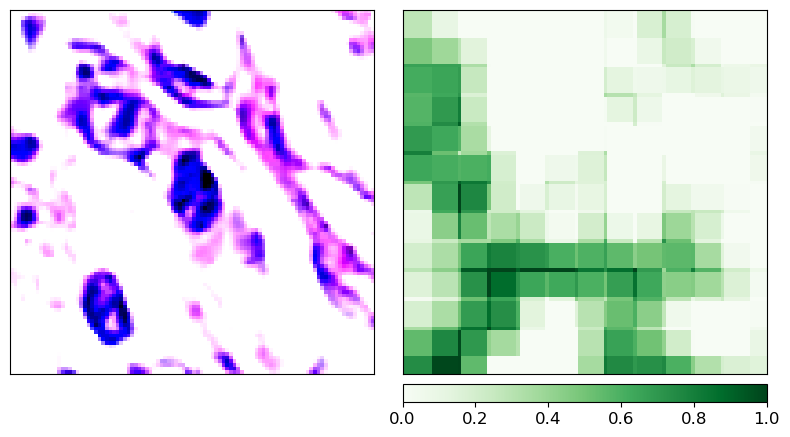

(3, 100, 100)
(3, 100, 100)


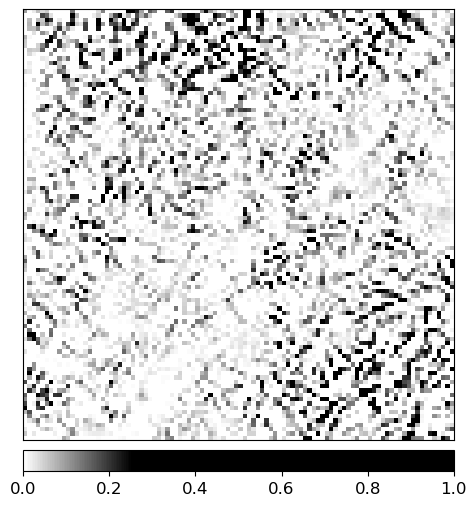

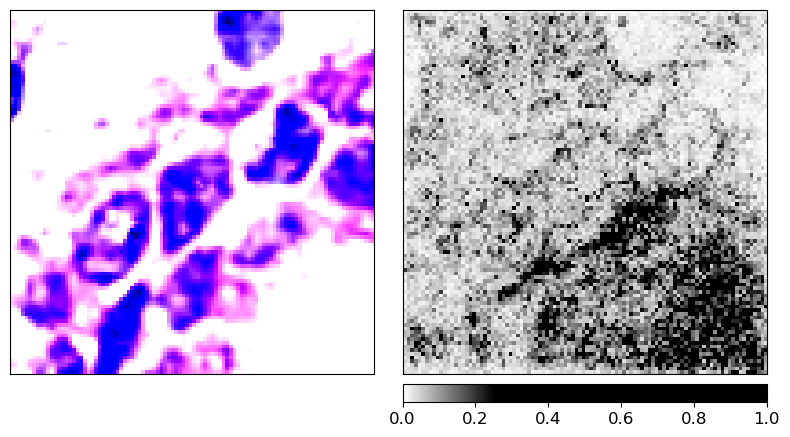

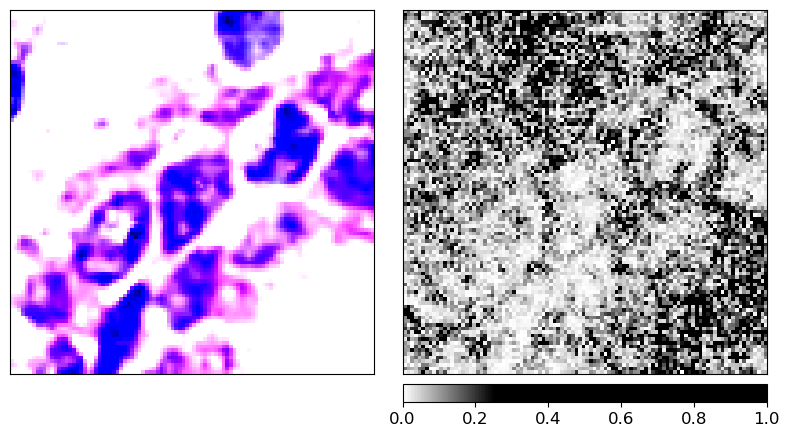

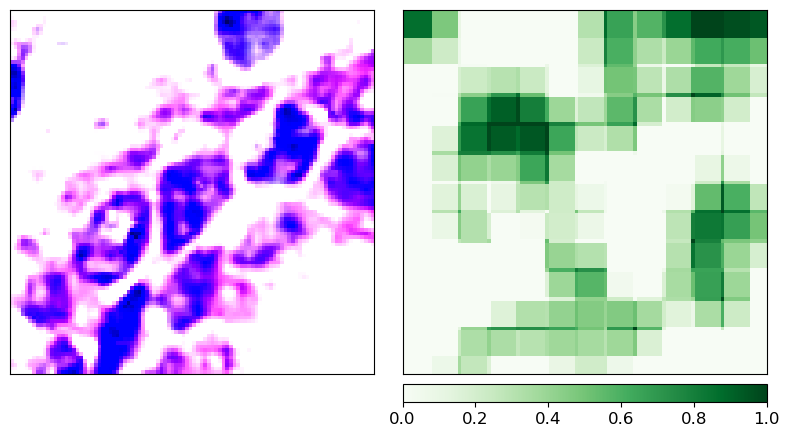

(3, 100, 100)
(3, 100, 100)


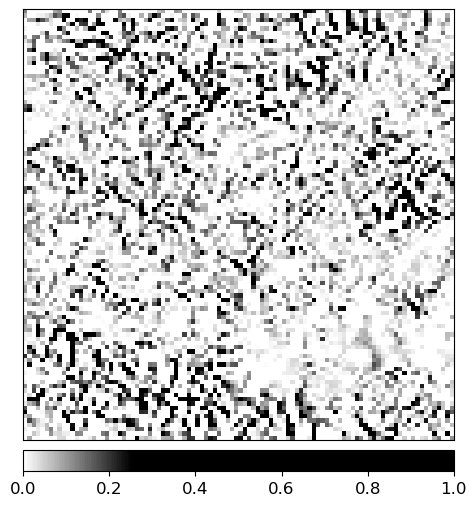

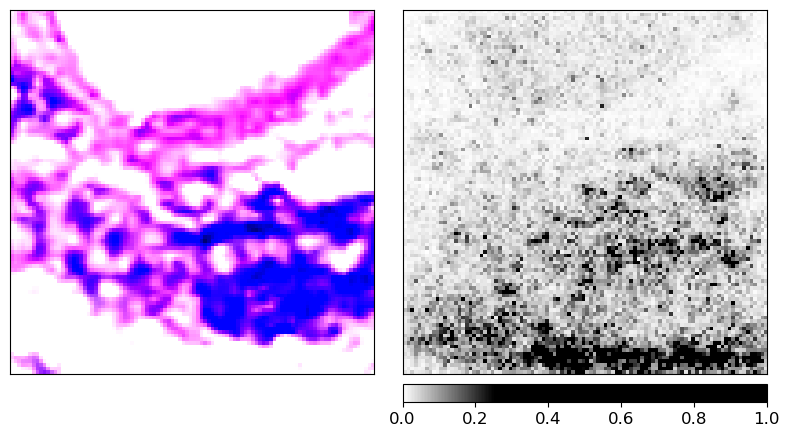

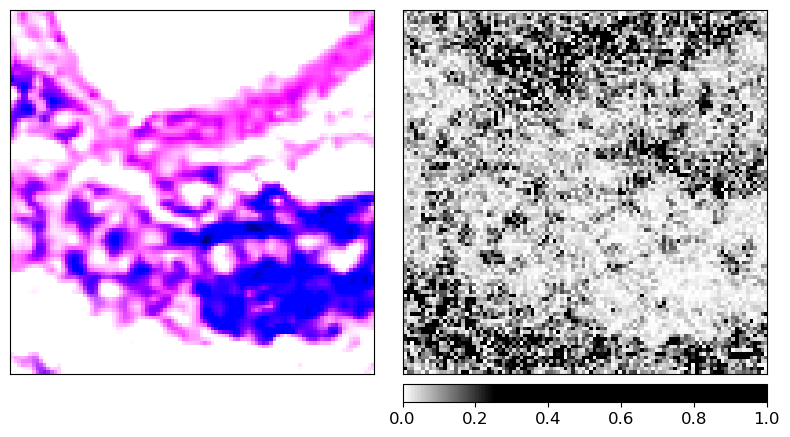

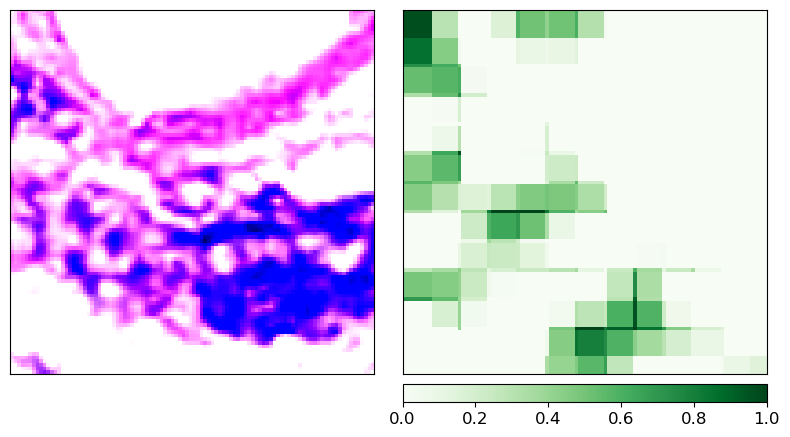

(3, 100, 100)
(3, 100, 100)


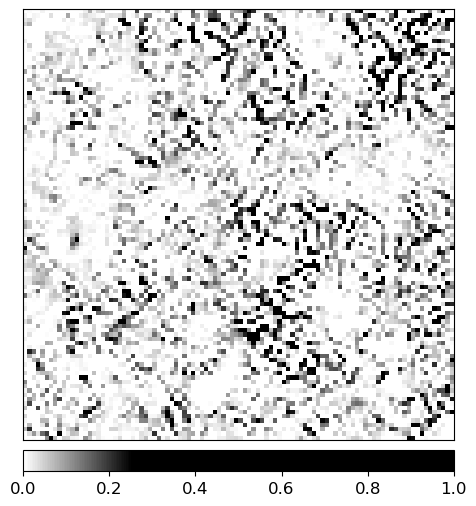

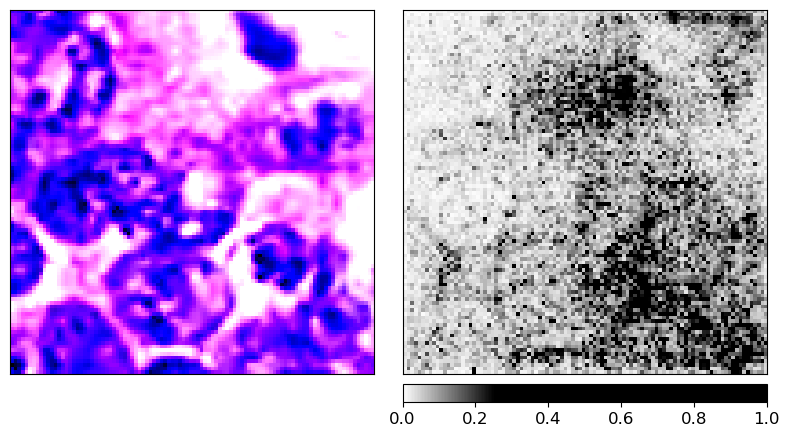

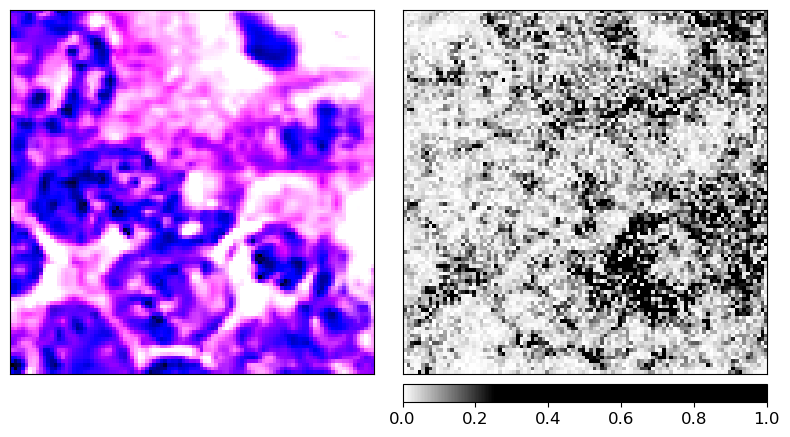

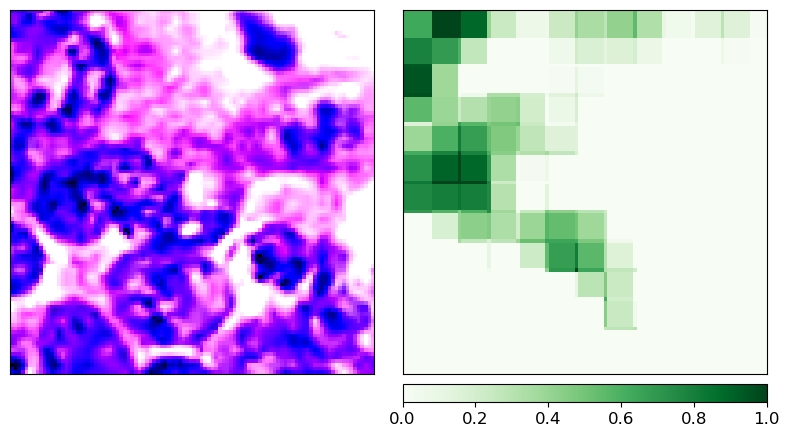

(3, 100, 100)
(3, 100, 100)


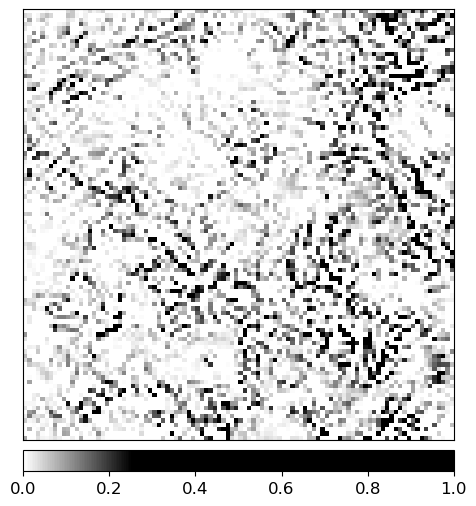

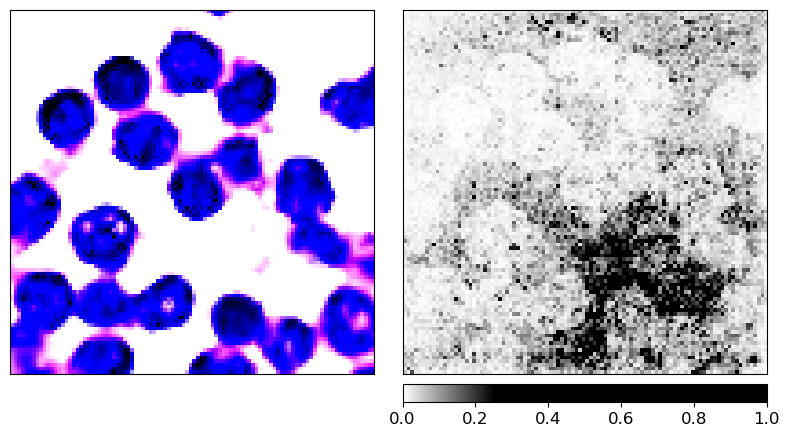

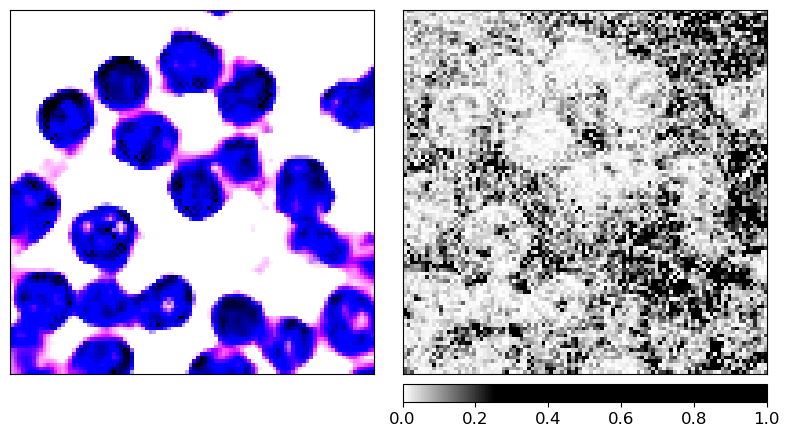

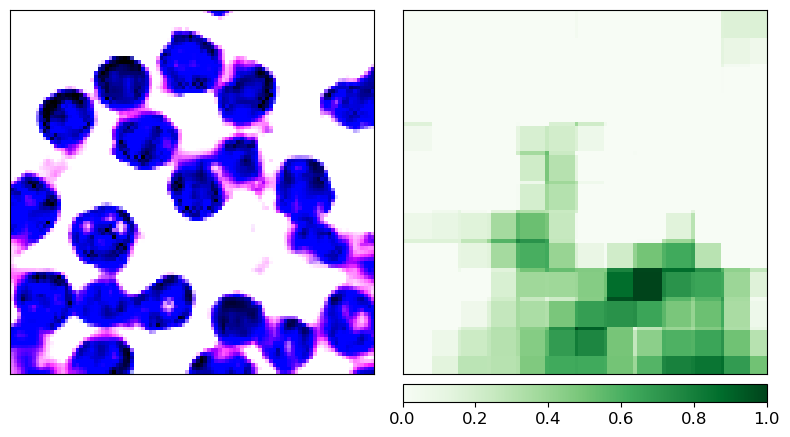

(3, 100, 100)
(3, 100, 100)


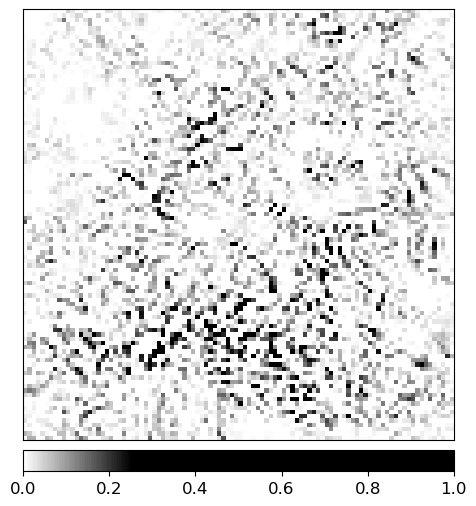

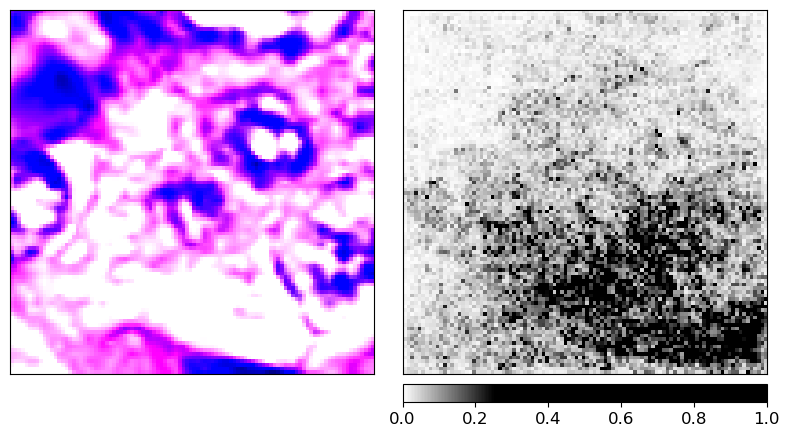

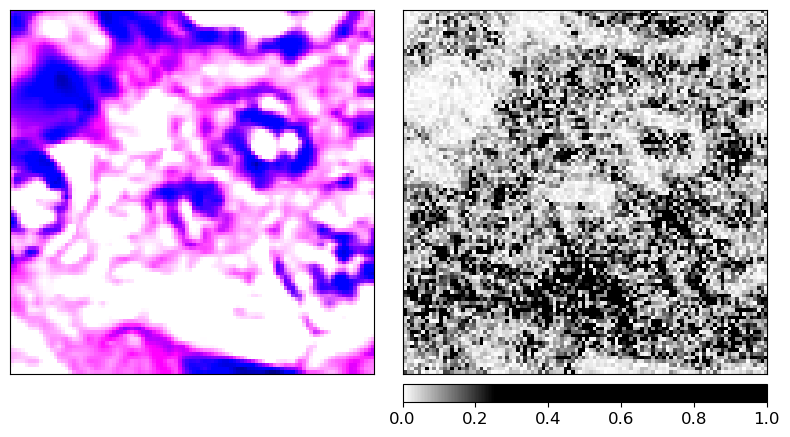

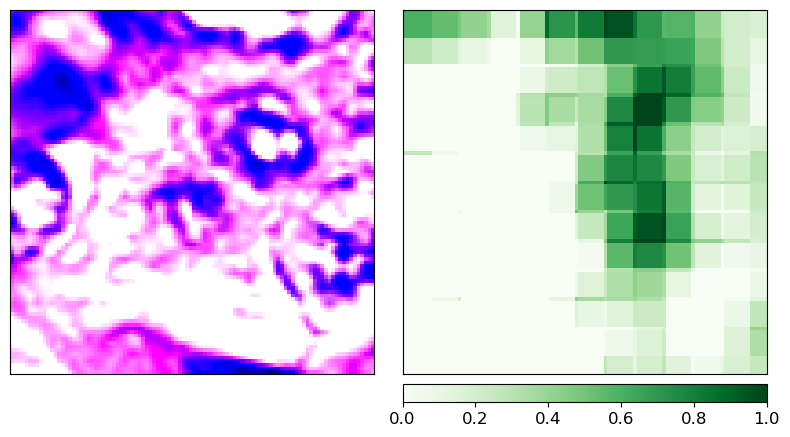

(3, 100, 100)
(3, 100, 100)


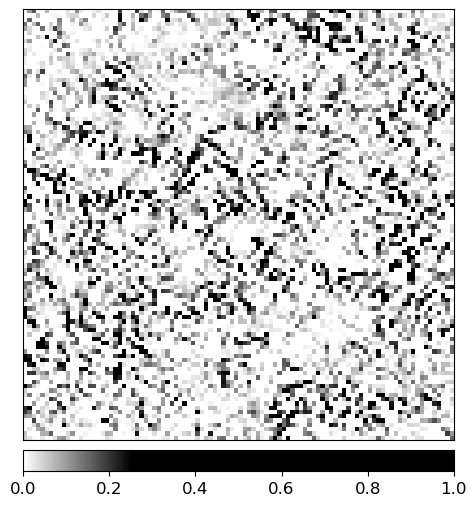

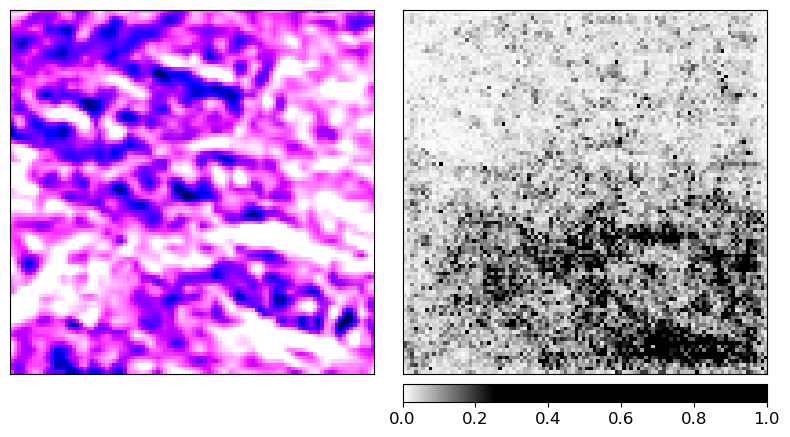

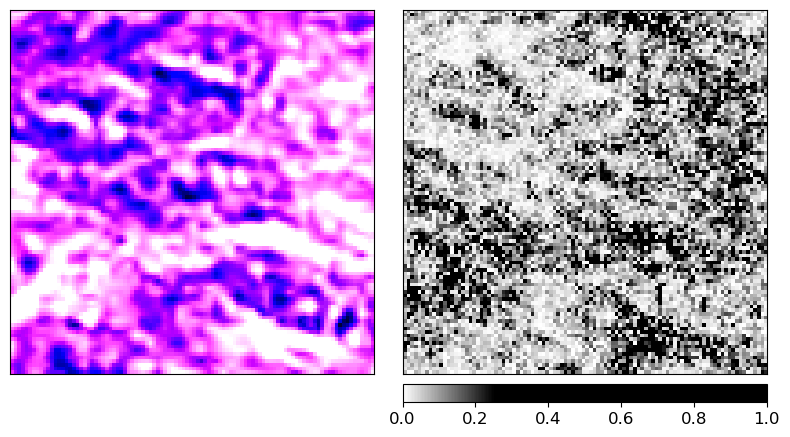

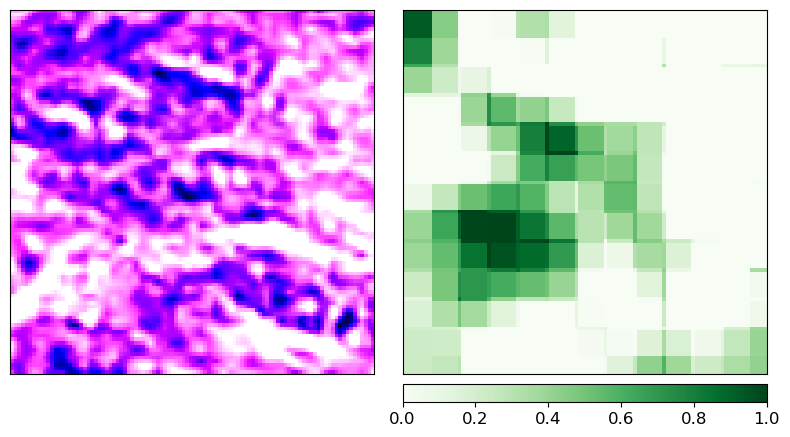

(3, 100, 100)
(3, 100, 100)


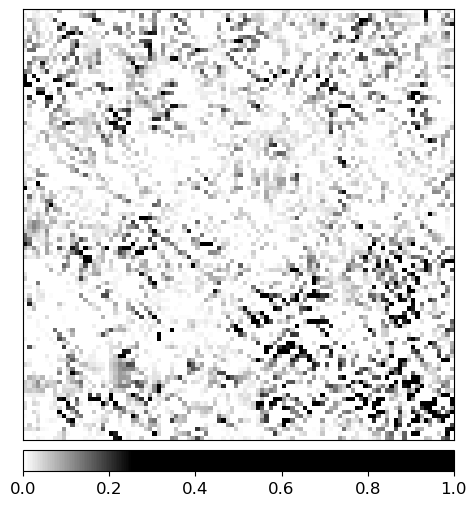

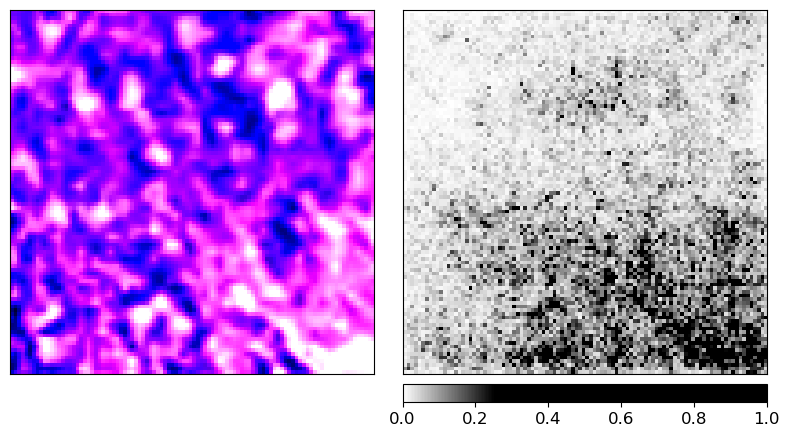

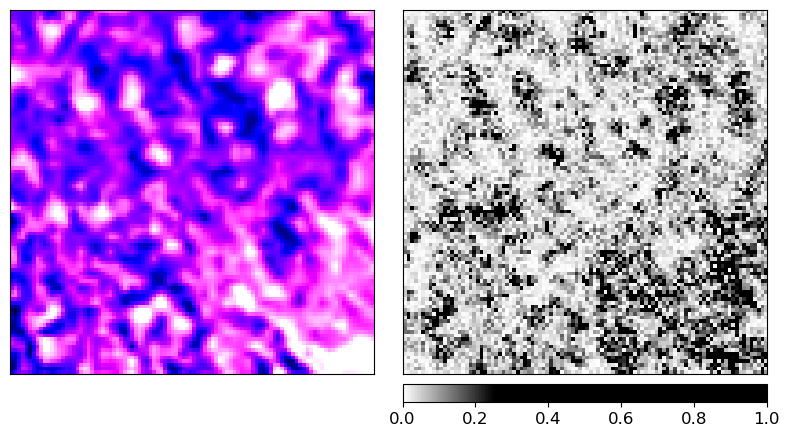

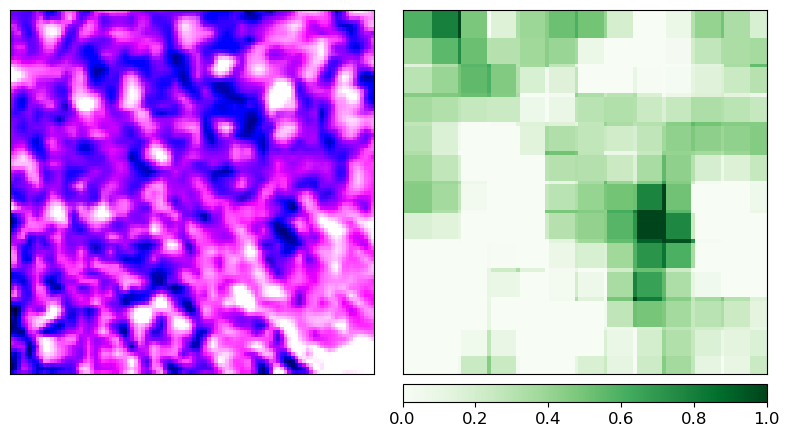

(3, 100, 100)
(3, 100, 100)


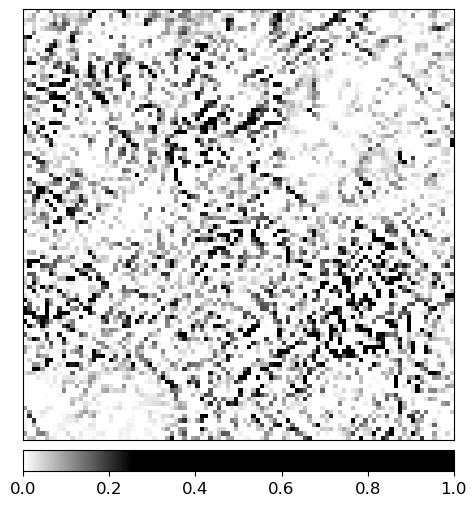

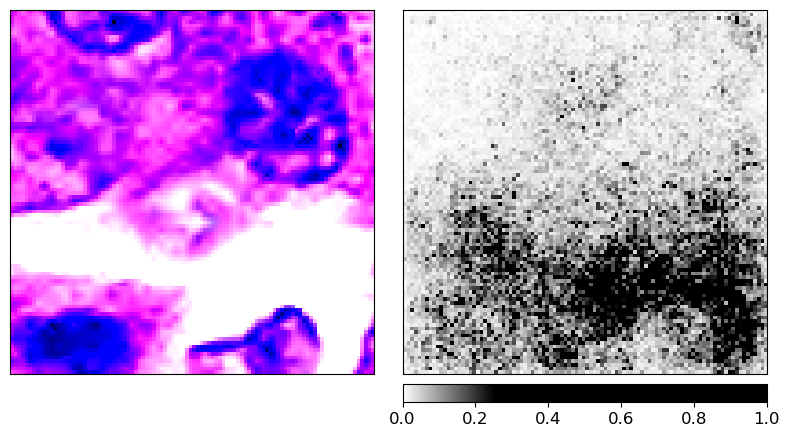

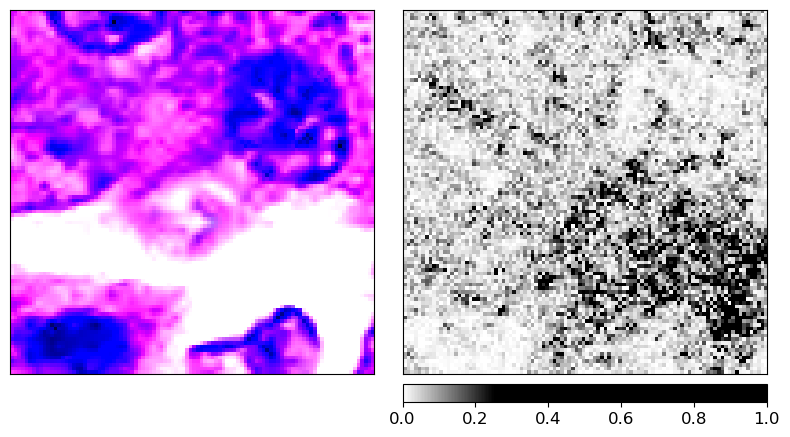

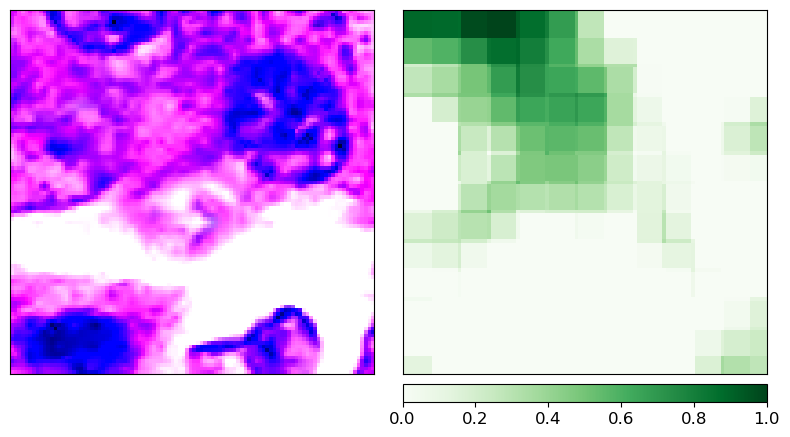

(3, 100, 100)
(3, 100, 100)


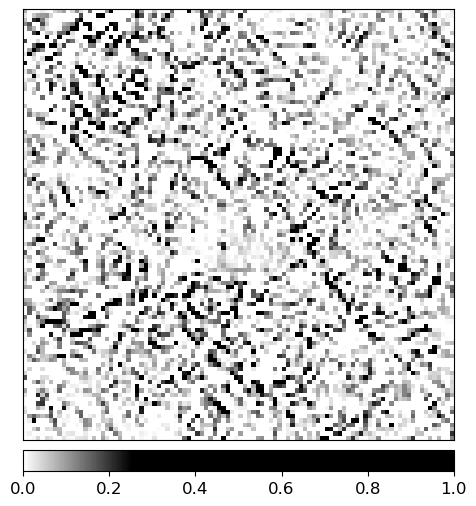

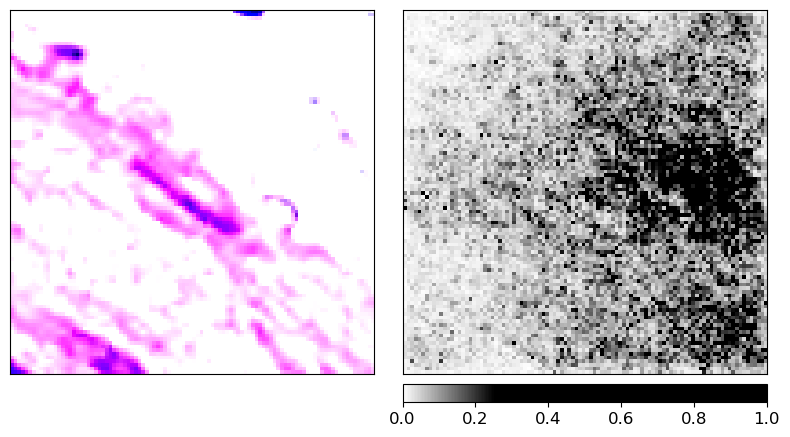

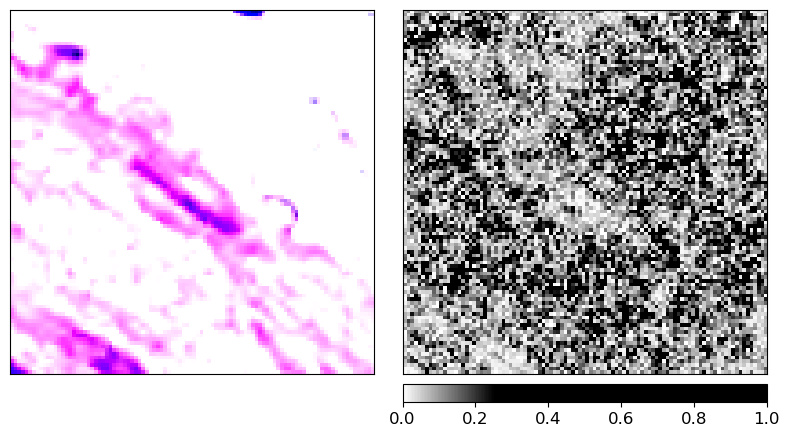

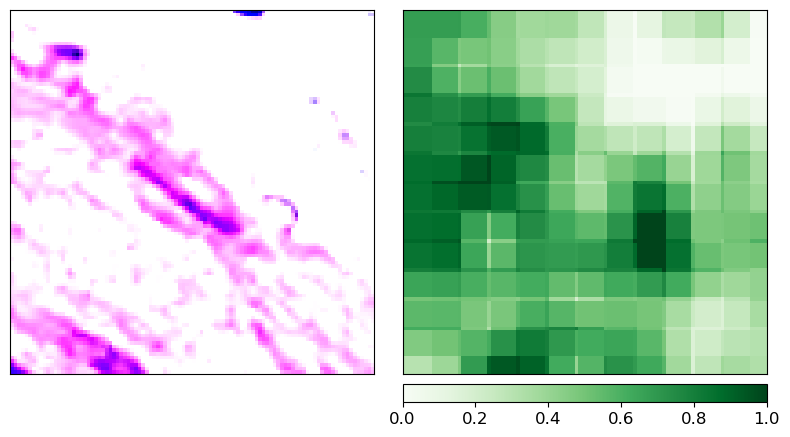

(3, 100, 100)
(3, 100, 100)


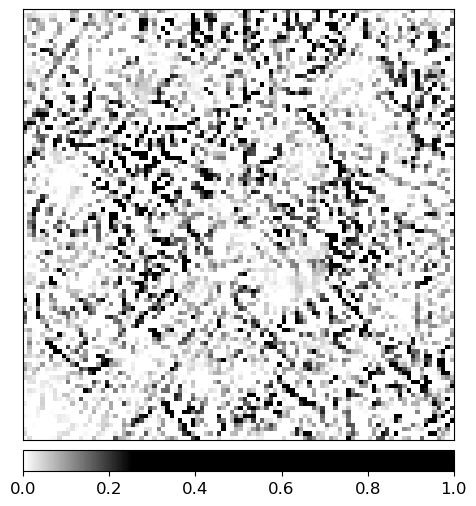

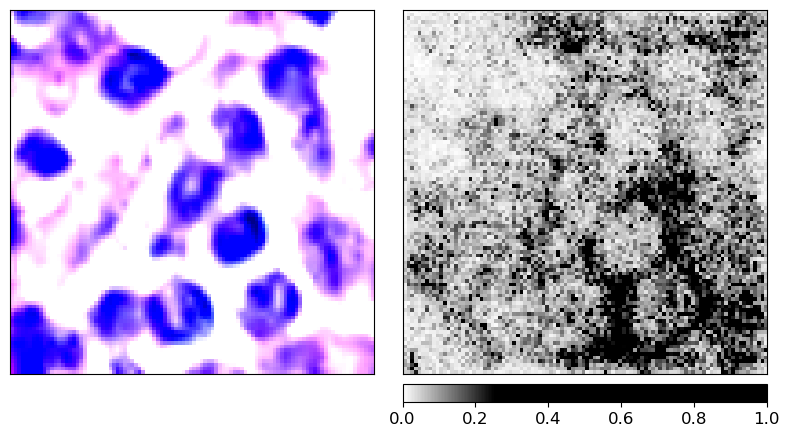

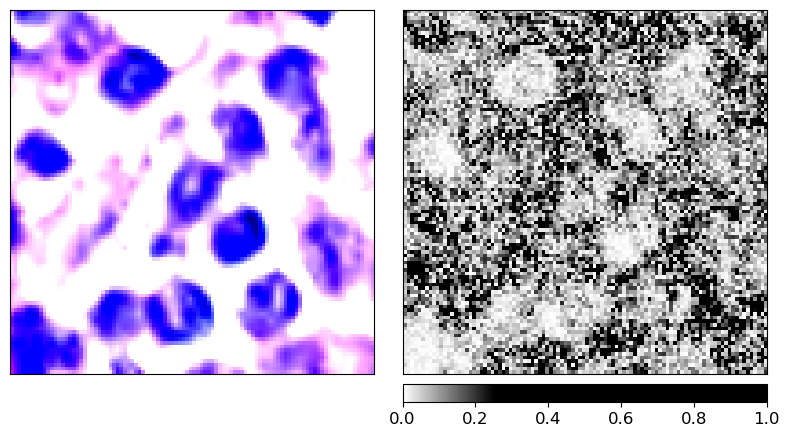

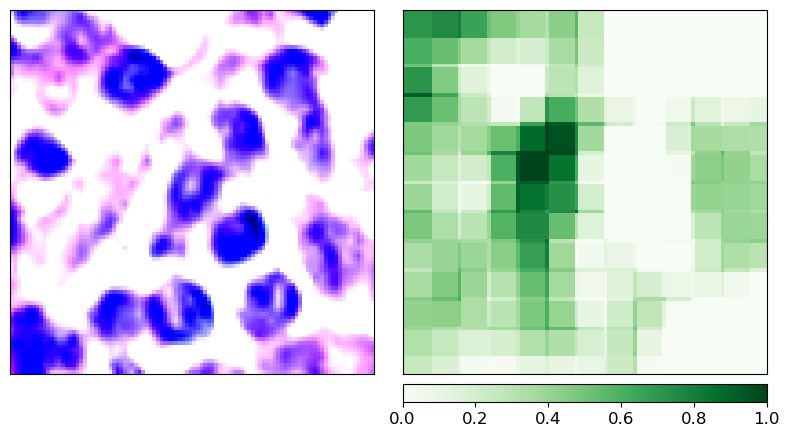

(3, 100, 100)
(3, 100, 100)


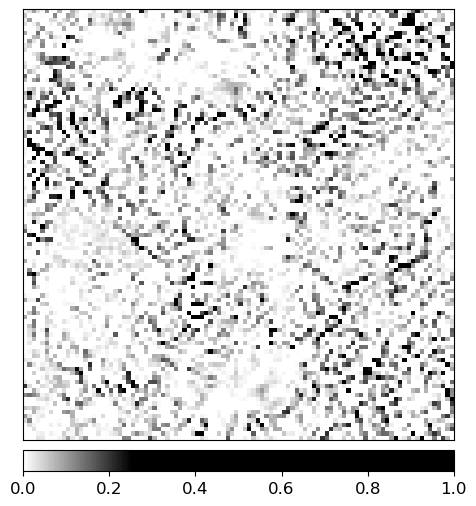

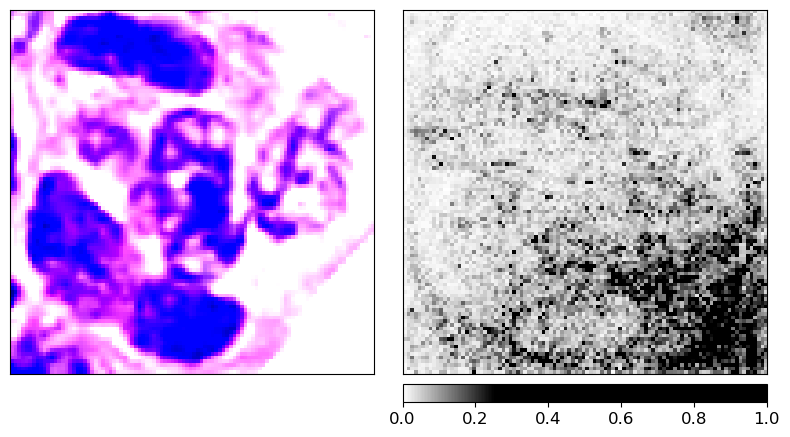

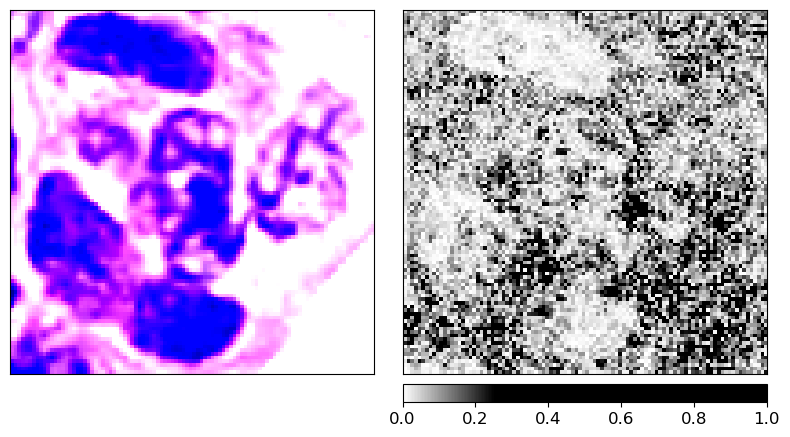

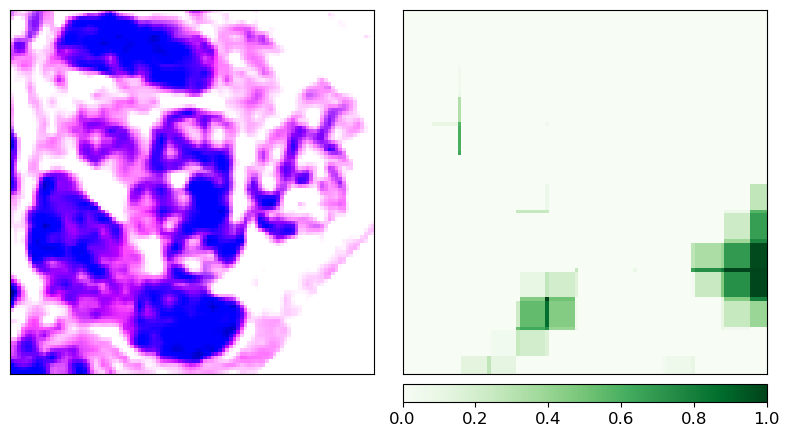

(3, 100, 100)
(3, 100, 100)


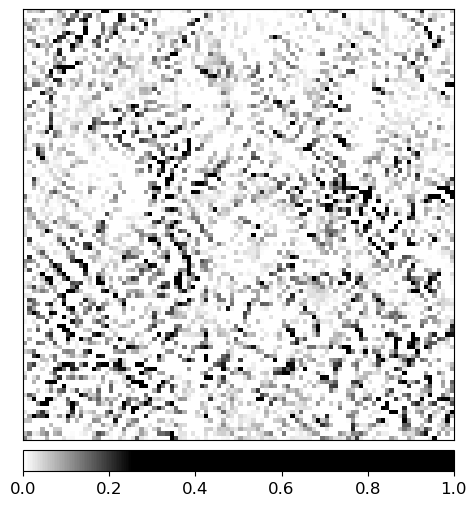

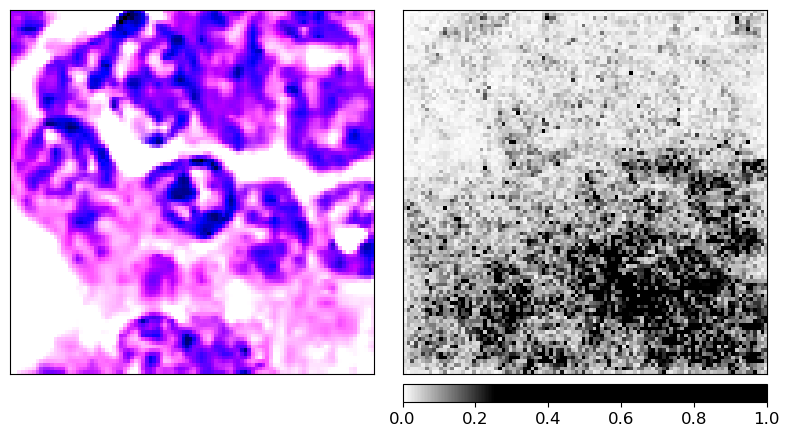

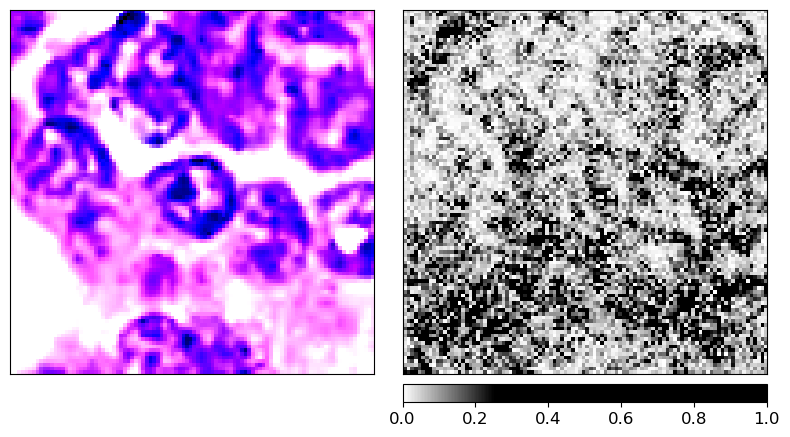

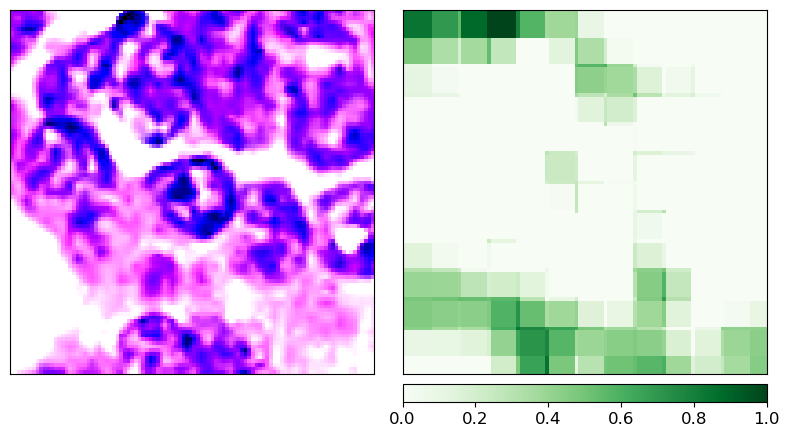

(3, 100, 100)
(3, 100, 100)


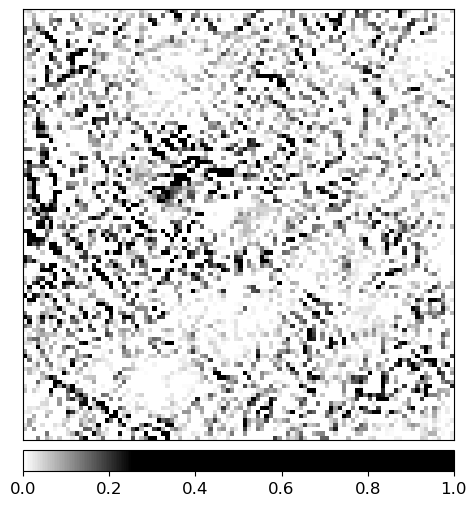

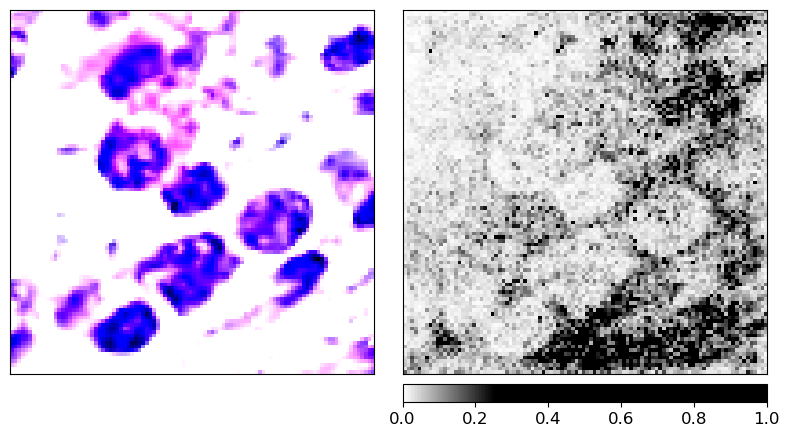

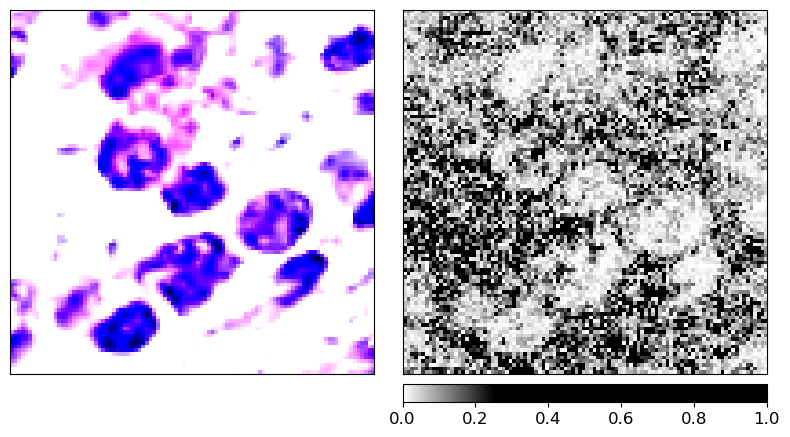

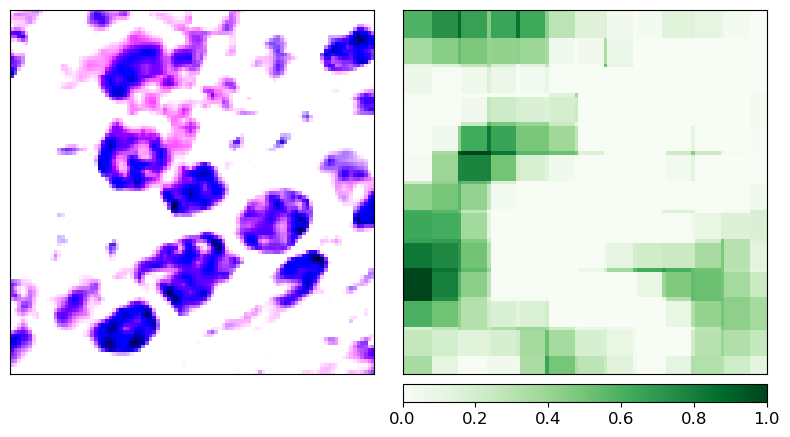

(3, 100, 100)
(3, 100, 100)


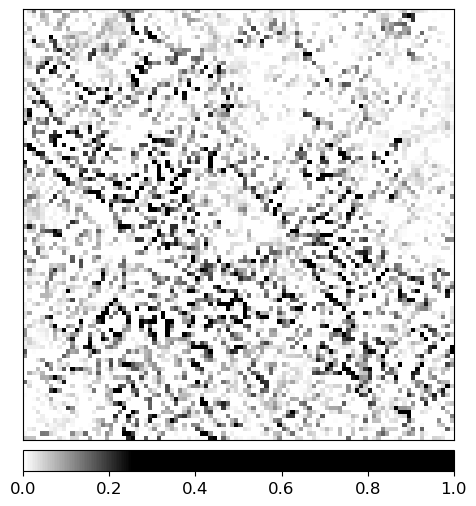

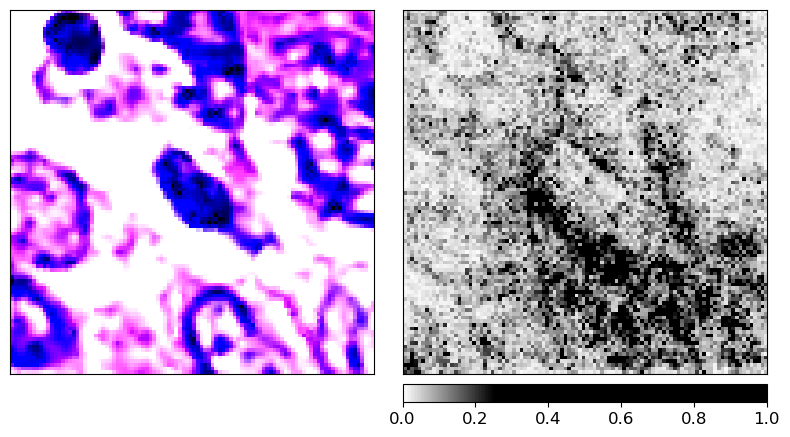

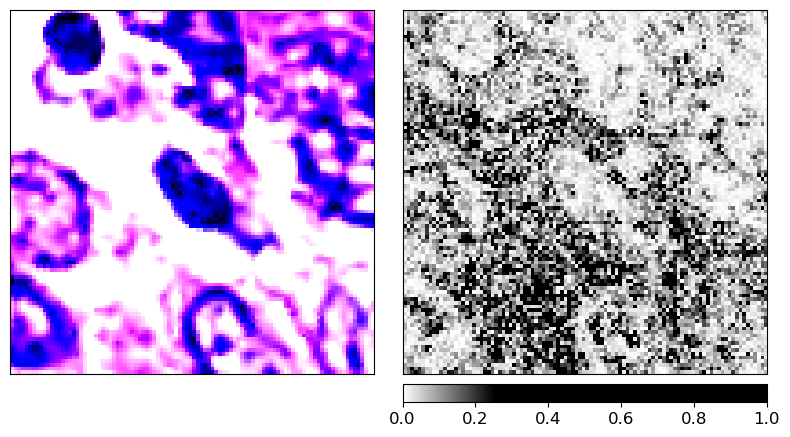

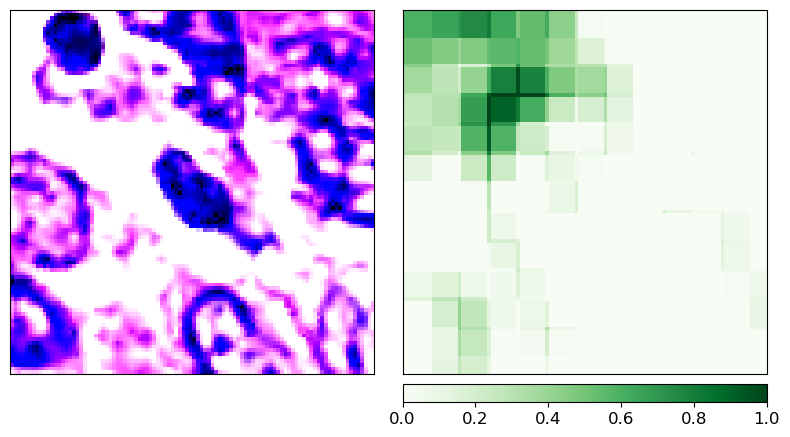

(3, 100, 100)
(3, 100, 100)


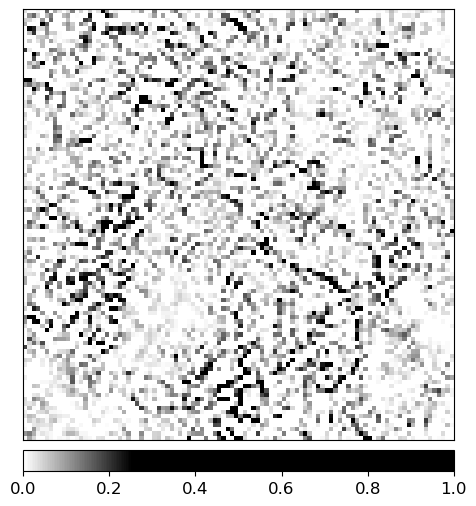

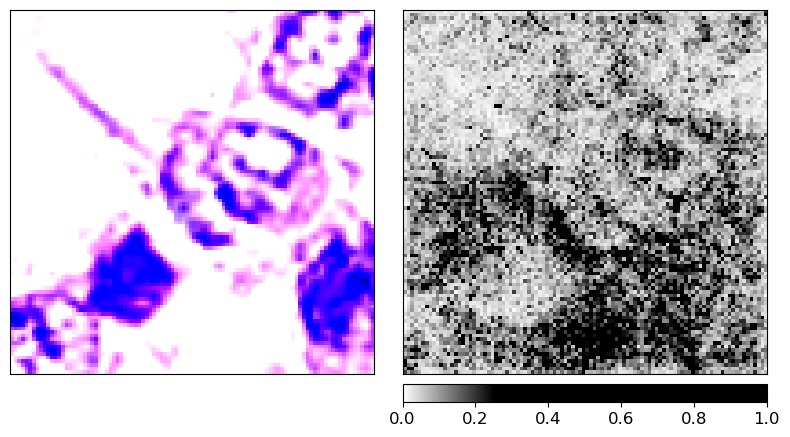

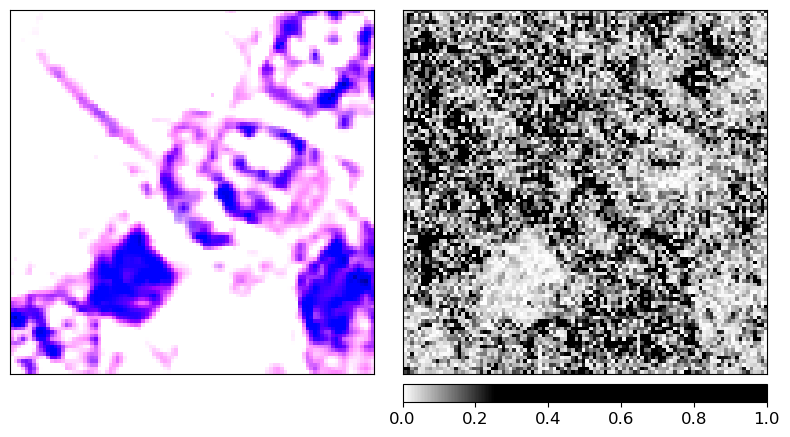

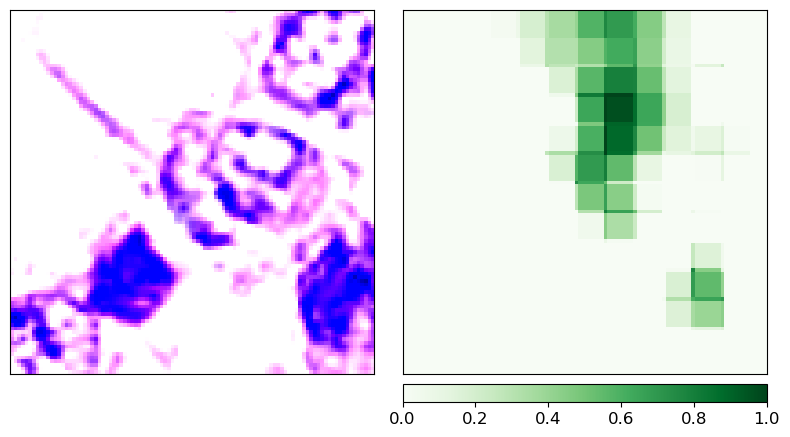

(3, 100, 100)
(3, 100, 100)


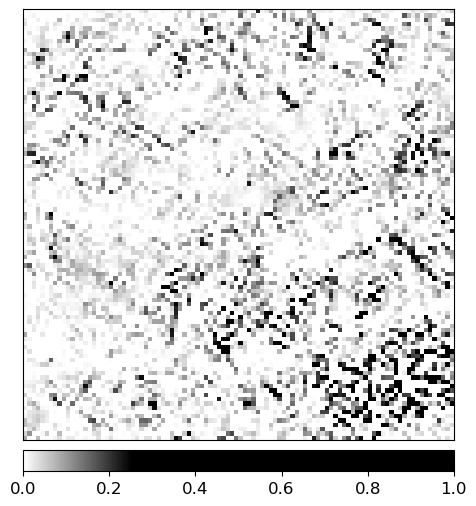

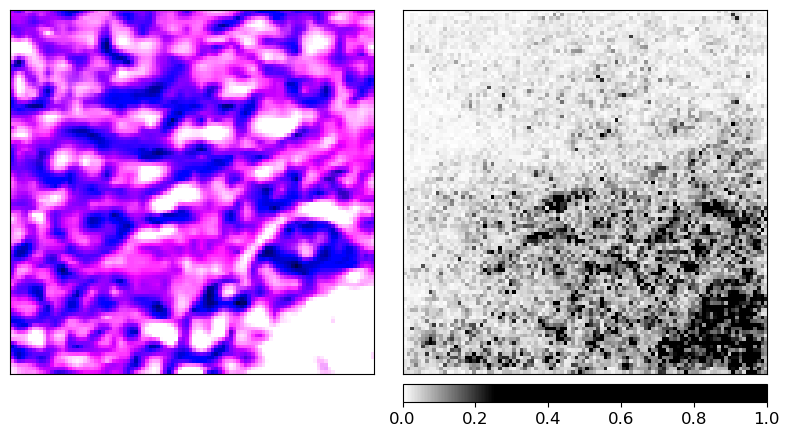

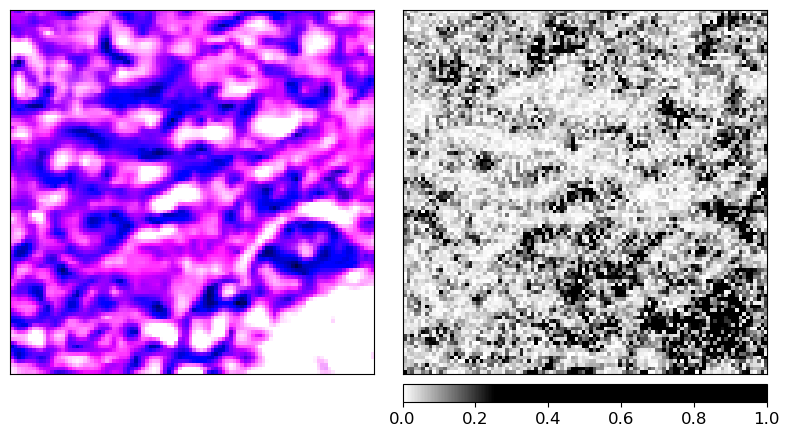

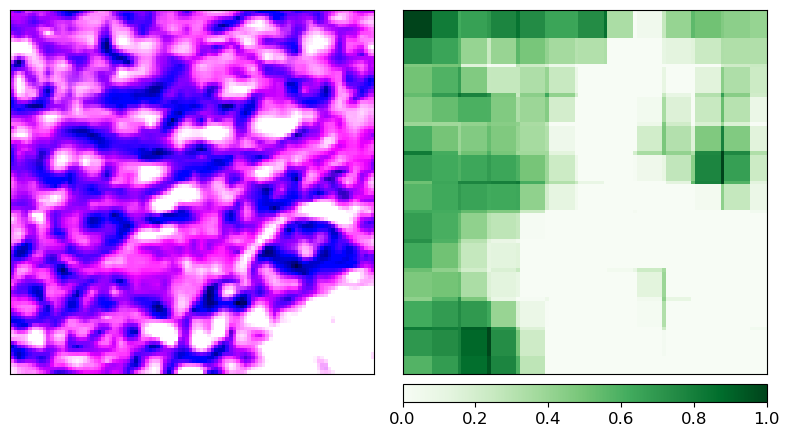

(3, 100, 100)
(3, 100, 100)


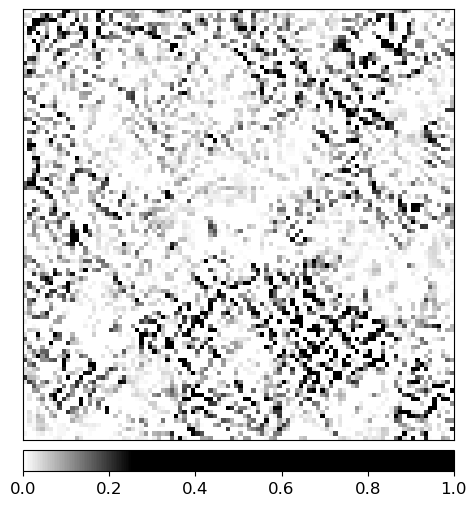

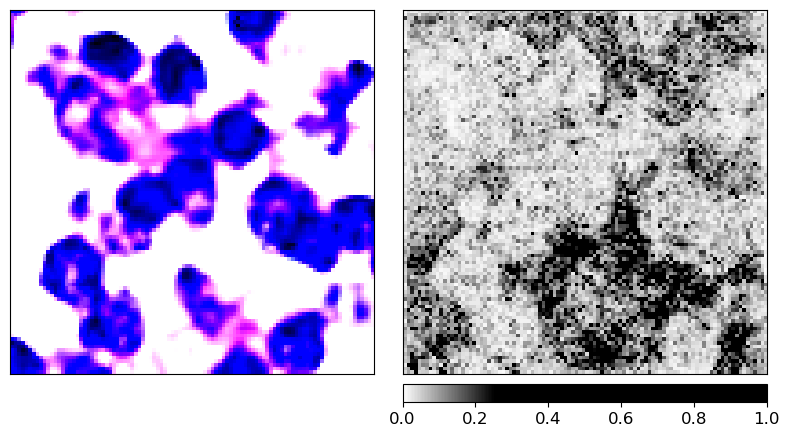

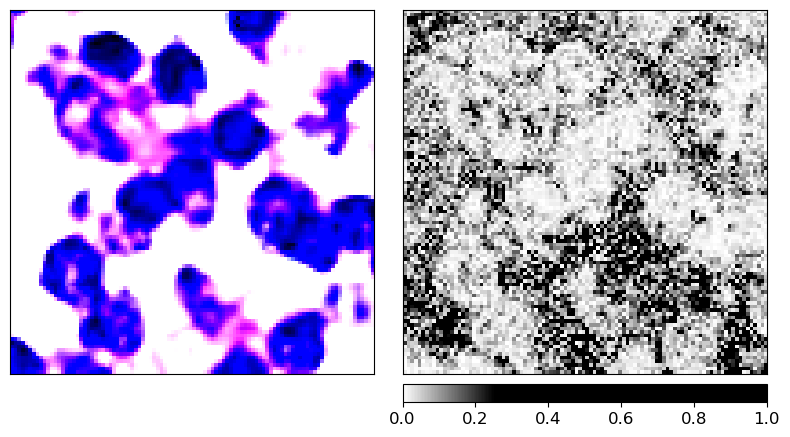

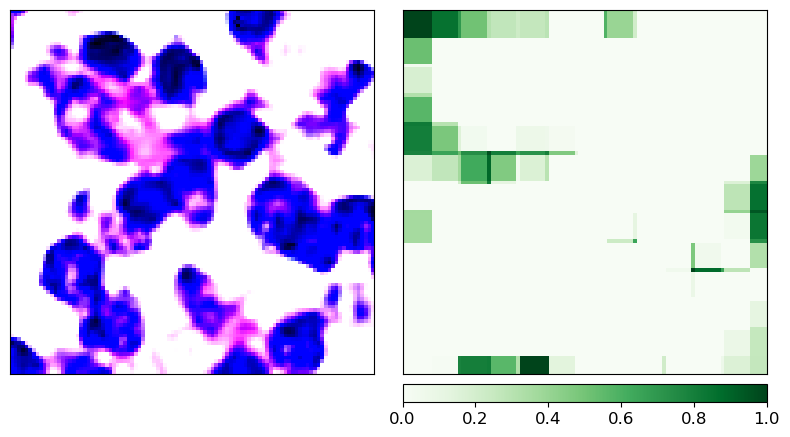

(3, 100, 100)
(3, 100, 100)


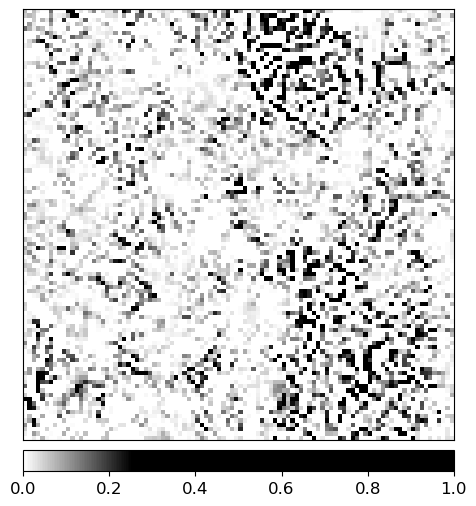

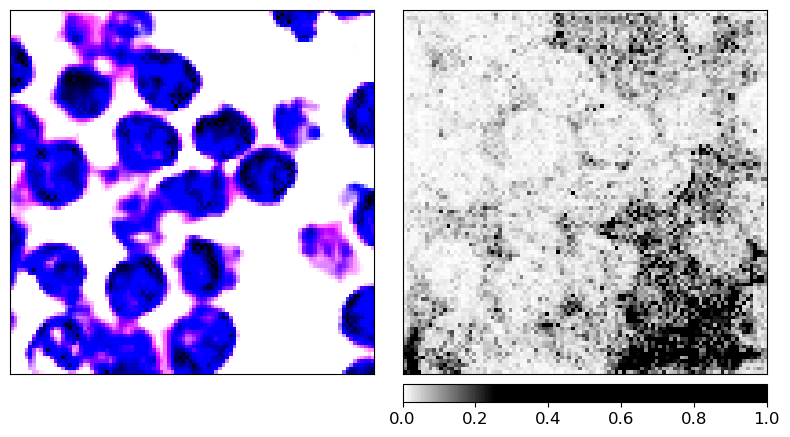

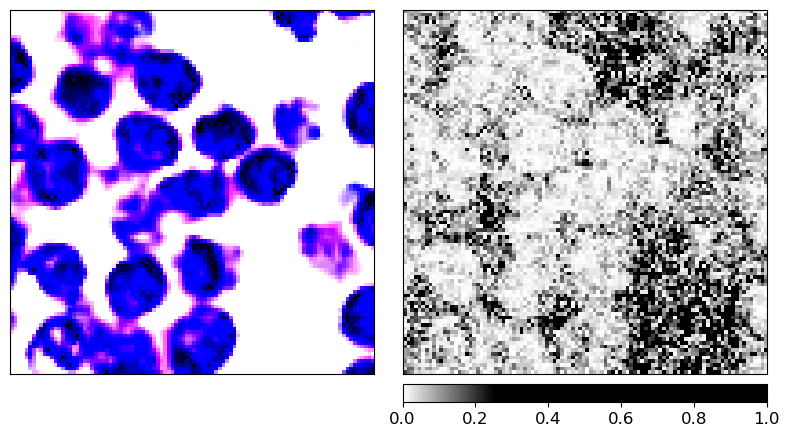

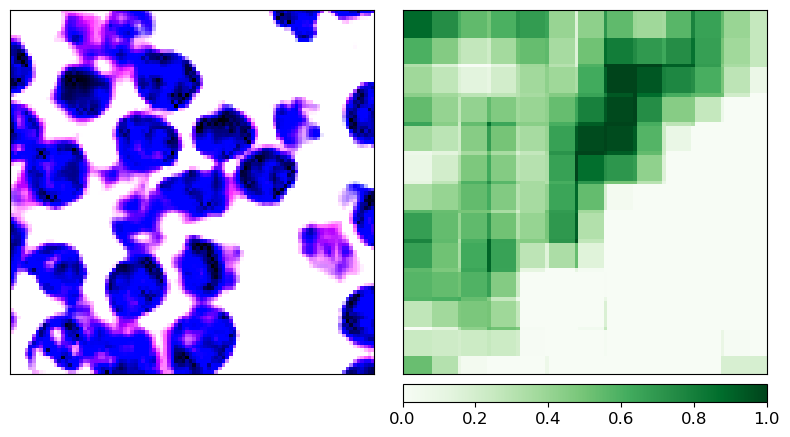

(3, 100, 100)
(3, 100, 100)


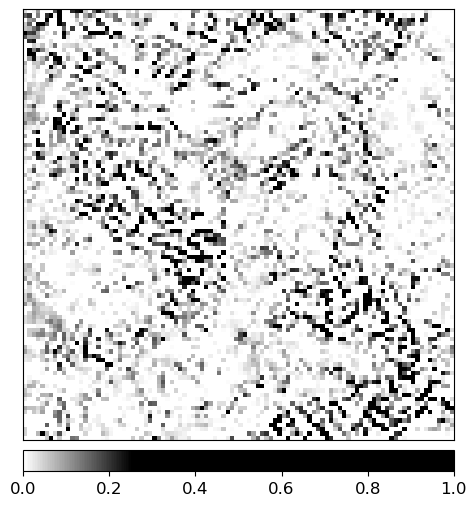

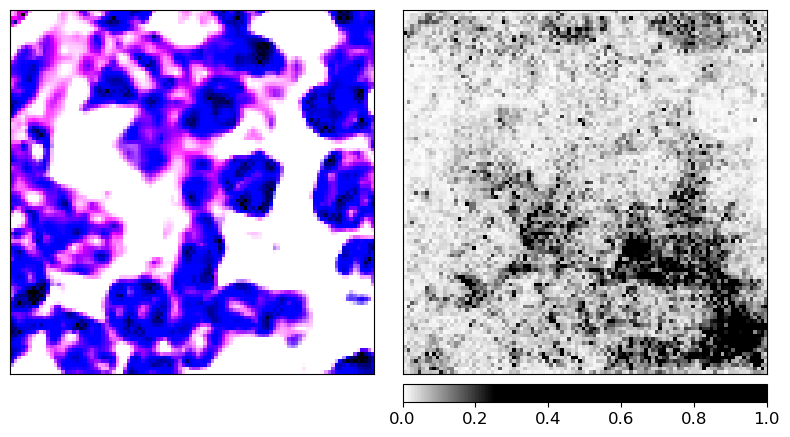

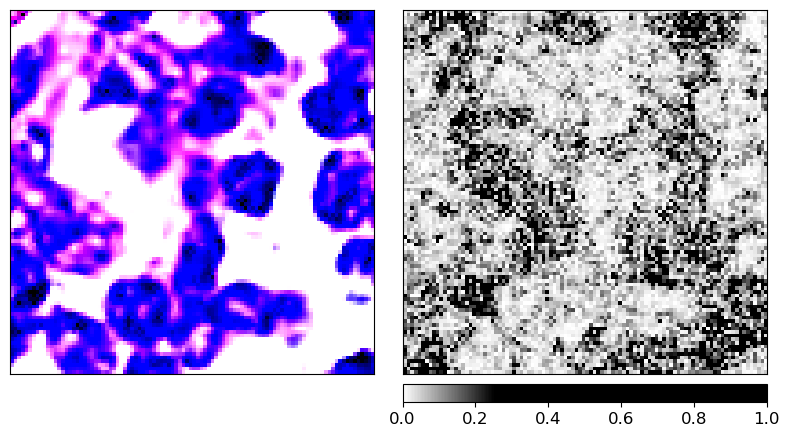

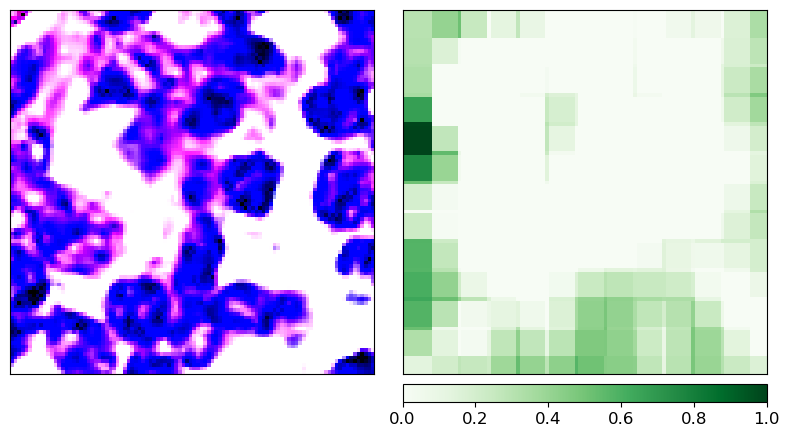

(3, 100, 100)
(3, 100, 100)


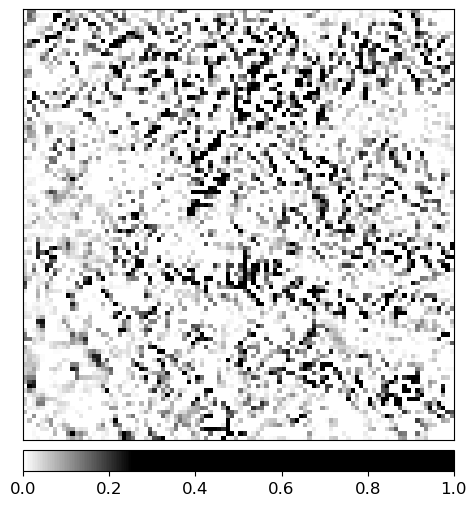

KeyboardInterrupt: 

In [26]:
#Creating the graphs of test set using captum
test_loader = DataLoader(test_set, batch_size=1, shuffle=False)
pred_scores = []
pred_label_in = []
with torch.no_grad():
    for inputs, labels in test_loader:
        inputs, labels = inputs.to(device), labels.to(device)
        output = model(inputs)
        output = F.softmax(output, dim=1)
        prediction_score, pred_label_idx = torch.max(model(inputs), dim=1)
        pred_scores.append(prediction_score)
        pred_label_in.append(pred_label_idx)
        integrated_gradients = IntegratedGradients(model)
        attributions_ig = integrated_gradients.attribute(inputs, target=pred_label_idx, n_steps=2)
        default_cmap = LinearSegmentedColormap.from_list('custom blue', 
                                                 [(0, '#ffffff'),
                                                  (0.25, '#000000'),
                                                  (1, '#000000')], N=256)
        
        print(attributions_ig.squeeze().cpu().detach().numpy().shape)
        print(inputs.squeeze().cpu().detach().numpy().shape)
        
        _ = viz.visualize_image_attr(np.transpose(attributions_ig.squeeze().cpu().detach().numpy(), (1,2,0)),
                             np.transpose(inputs.squeeze().cpu().detach().numpy(), (1,2,0)),
                             method='heat_map',
                             cmap=default_cmap,
                             show_colorbar=True,
                             sign='positive',
                             outlier_perc=1)
        
        noise_tunnel = NoiseTunnel(integrated_gradients)

        attributions_ig_nt = noise_tunnel.attribute(inputs, nt_samples=10, nt_type='smoothgrad_sq', target=pred_label_idx)
        _ = viz.visualize_image_attr_multiple(np.transpose(attributions_ig_nt.squeeze().cpu().detach().numpy(), (1,2,0)),
                                      np.transpose(inputs.squeeze().cpu().detach().numpy(), (1,2,0)),
                                      ["original_image", "heat_map"],
                                      ["all", "positive"],
                                      cmap=default_cmap,
                                      show_colorbar=True)
        torch.manual_seed(0)
        np.random.seed(0)

        gradient_shap = GradientShap(model)

        # Defining baseline distribution of images
        rand_img_dist = torch.cat([inputs * 0, inputs * 1])

        attributions_gs = gradient_shap.attribute(inputs,
                                          n_samples=50,
                                          stdevs=0.0001,
                                          baselines=rand_img_dist,
                                          target=pred_label_idx)
        _ = viz.visualize_image_attr_multiple(np.transpose(attributions_gs.squeeze().cpu().detach().numpy(), (1,2,0)),
                                      np.transpose(inputs.squeeze().cpu().detach().numpy(), (1,2,0)),
                                      ["original_image", "heat_map"],
                                      ["all", "absolute_value"],
                                      cmap=default_cmap,
                                      show_colorbar=True)
        occlusion = Occlusion(model)

        attributions_occ = occlusion.attribute(inputs,
                                       strides = (3, 8, 8),
                                       target=pred_label_idx,
                                       sliding_window_shapes=(3,15, 15),
                                       baselines=0)
        _ = viz.visualize_image_attr_multiple(np.transpose(attributions_occ.squeeze().cpu().detach().numpy(), (1,2,0)),
                                      np.transpose(inputs.squeeze().cpu().detach().numpy(), (1,2,0)),
                                      ["original_image", "heat_map"],
                                      ["all", "positive"],
                                      show_colorbar=True,
                                      outlier_perc=2,
                                     )


Similarly for the pretrained model had to interrupt the execution else kaggle crashes due to too many outputs.

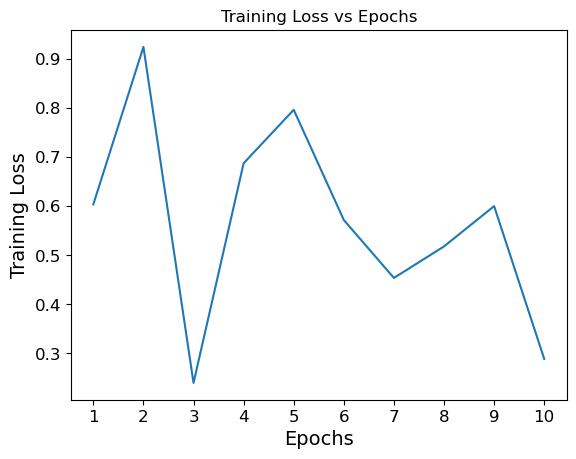

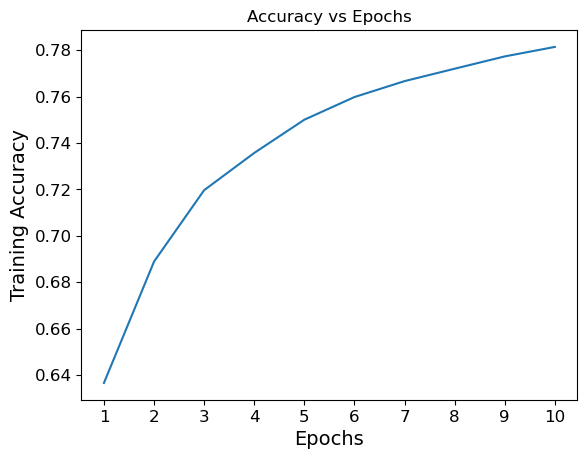

In [19]:
epochs = range(1, 11)

# Plotting the graphs for training loss and accuracy
plt.plot(epochs, train_losses)
plt.title('Training Loss vs Epochs')
plt.xlabel('Epochs')
plt.ylabel('Training Loss')
plt.xticks(epochs)
plt.show()

plt.plot(epochs, train_acc)
plt.title('Accuracy vs Epochs')
plt.xlabel('Epochs')
plt.ylabel('Training Accuracy')
plt.xticks(epochs)
plt.show()

In [20]:
#converting the tensors back to labels
num = []
for i in range(len(predi)):
    for j in range(len(predi[i])):
        number = predi[i][j].item()
        num.append(number)

In [21]:
#inserting the labels in the document of example.csv
doc = pd.read_csv("/kaggle/input/deep-learning-for-msc-2022-23/example.csv")
doc['Label'] = num

In [22]:
#saving the document as csv
doc.to_csv("Pretrained_without_tuning.csv", index=False)

In [23]:
doc.head(20)

,Filename,Label
0,10001.png,3
1,10002.png,2
2,10003.png,3
3,10004.png,3
4,10005.png,3
5,10006.png,3
6,10007.png,2
7,10008.png,1
8,10009.png,3
9,10010.png,3
